#  1. Introduction to Network Intrusion Detection Systems




## 1.1 Research Motivation and Problem Statement



Network Intrusion Detection Systems (NIDS) play a crucial role in modern cybersecurity infrastructure by monitoring network traffic for suspicious activities and potential security breaches. However, with the increasing sophistication of cyber attacks, traditional rule-based and signature-based approaches have proven insufficient to detect novel attacks and adapt to evolving network behaviors.

The increasing complexity of network traffic patterns, the growing variety of attack vectors, and the substantial imbalance between normal and malicious traffic present significant challenges for conventional detection methods. Moreover, existing systems often suffer from high false positive rates, limited interpretability, and inability to adapt to new threats without manual intervention.

This research addresses these challenges by developing an advanced NIDS framework that combines sophisticated feature engineering, adaptive machine learning techniques, and incremental learning capabilities to create a more robust, accurate, and interpretable intrusion detection system.

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
import warnings
warnings.filterwarnings('ignore')

# Set aesthetic parameters for plots
plt.style.use('seaborn-v0_8')
sns.set(font_scale=1.2)
sns.set_style("whitegrid")

# Define a helper function to display section headers
def display_header(title, width=80):
    """Display a formatted header for better notebook organization"""
    print("\n" + "="*width)
    print(f"{title}".center(width))
    print("="*width + "\n")

display_header("Network Intrusion Detection System (NIDS) Research")
print("This research focuses on developing advanced machine learning techniques for")
print("network intrusion detection using the CICIDS2017 dataset.")


               Network Intrusion Detection System (NIDS) Research               

This research focuses on developing advanced machine learning techniques for
network intrusion detection using the CICIDS2017 dataset.


## 1.2 Overview of NIDS Approaches and Challenges



Network Intrusion Detection Systems can be broadly categorized into two main approaches:

1. **Signature-based detection:** Identifies attacks by matching network traffic against a database of known attack patterns. While effective for known threats, it fails to detect zero-day attacks and requires constant database updates.

2. **Anomaly-based detection:** Establishes a baseline of "normal" network behavior and flags deviations as potential threats. This approach can detect novel attacks but often produces high false positive rates.

The major challenges in modern NIDS development include:

- **Class imbalance:** Attack traffic typically represents a small fraction of total network traffic
- **High dimensionality:** Network traffic data contains numerous features, many of which may be irrelevant or redundant
- **Concept drift:** Network traffic patterns evolve over time, requiring continuous model adaptation
- **Interpretability:** Security analysts need to understand why alerts are triggered to take appropriate actions
- **Resource constraints:** Real-time detection requires computationally efficient algorithms

The CICIDS2017 dataset provides a realistic benchmark for evaluating different approaches, containing diverse attack scenarios including DDoS, port scanning, web attacks, and more.


In [ ]:
# Define the single base path
base_path = '/content/drive/MyDrive/CICIDS2017'

# Mount Google Drive if running in Colab
from google.colab import drive
drive.mount('/content/drive')

# Load all the CSV files from the same path
print("Loading CICIDS2017 dataset files...")

data_files = {
    'Monday': pd.read_csv(f'{base_path}/Monday-WorkingHours.pcap_ISCX.csv'),
    'Tuesday': pd.read_csv(f'{base_path}/Tuesday-WorkingHours.pcap_ISCX.csv'),
    'Wednesday': pd.read_csv(f'{base_path}/Wednesday-workingHours.pcap_ISCX.csv'),
    'Thursday-Morning': pd.read_csv(f'{base_path}/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv'),
    'Thursday-Afternoon': pd.read_csv(f'{base_path}/Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv'),
    'Friday-Morning': pd.read_csv(f'{base_path}/Friday-WorkingHours-Morning.pcap_ISCX.csv'),
    'Friday-Afternoon-PortScan': pd.read_csv(f'{base_path}/Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv'),
    'Friday-Afternoon-DDos': pd.read_csv(f'{base_path}/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv')
}

# Print dataset information
print("\nDataset files loaded successfully!")
print(f"Total number of files: {len(data_files)}")

for day, data in data_files.items():
    print(f"{day}: {data.shape[0]} records with {data.shape[1]} features")

# Create a quick overview of attack types
attack_counts = {}
for day, data in data_files.items():
    # Standardize the label column name (it might be 'Label' or ' Label')
    label_col = 'Label' if 'Label' in data.columns else ' Label'

    day_counts = data[label_col].value_counts()
    for label, count in day_counts.items():
        label = str(label).strip()  # Clean whitespace
        if label not in attack_counts:
            attack_counts[label] = 0
        attack_counts[label] += count

print("\nAttack distribution in the dataset:")
for attack, count in attack_counts.items():
    print(f"{attack}: {count} records")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loading CICIDS2017 dataset files...

Dataset files loaded successfully!
Total number of files: 8
Monday: 529918 records with 79 features
Tuesday: 445909 records with 79 features
Wednesday: 692703 records with 79 features
Thursday-Morning: 170366 records with 79 features
Thursday-Afternoon: 288602 records with 79 features
Friday-Morning: 191033 records with 79 features
Friday-Afternoon-PortScan: 286467 records with 79 features
Friday-Afternoon-DDos: 225745 records with 79 features

Attack distribution in the dataset:
BENIGN: 2273097 records
FTP-Patator: 7938 records
SSH-Patator: 5897 records
DoS Hulk: 231073 records
DoS GoldenEye: 10293 records
DoS slowloris: 5796 records
DoS Slowhttptest: 5499 records
Heartbleed: 11 records
Web Attack � Brute Force: 1507 records
Web Attack � XSS: 652 records
Web Attack � Sql Injection: 21 records
Infiltration: 36 records
Bot:

## 1.3 Research Objectives and Contributions


This research aims to develop an advanced NIDS framework that addresses the challenges identified above through the following objectives:

1. **Develop a hybrid feature selection framework** that combines statistical, tree-based, and dimensionality reduction techniques to identify the most relevant features for intrusion detection

2. **Implement advanced techniques for handling imbalanced data** through cluster-based oversampling and adaptive sampling approaches

3. **Design a two-stage classification architecture** that separates anomaly detection from attack classification to reduce false positives

4. **Incorporate model explainability** to provide security analysts with interpretable results that facilitate informed decision-making

5. **Implement incremental learning capabilities** that allow the system to adapt to evolving network behaviors and new attack patterns

The primary contributions of this research include:

- A novel adaptive feature selection framework that evolves with changing network patterns
- An effective approach to handling the extreme class imbalance present in network traffic data
- A practical implementation of explainable AI techniques for security operations
- A comprehensive evaluation framework that reflects real-world operational requirements


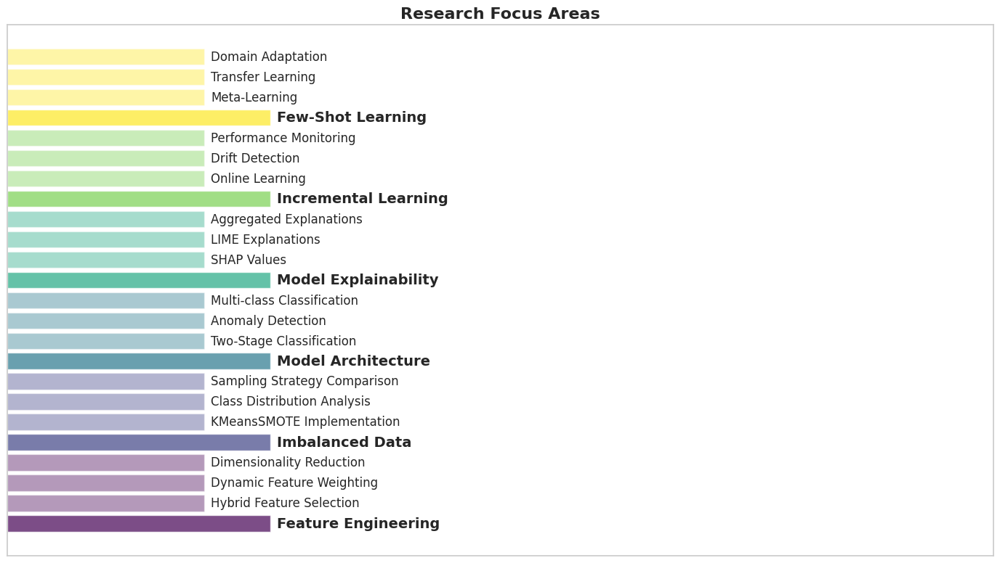


                           Research Approach Summary                            


This research takes a comprehensive approach to advancing NIDS capabilities by addressing
multiple facets of the problem:

1. Leveraging the richness of the CICIDS2017 dataset to develop models that handle realistic
   network traffic patterns

2. Applying state-of-the-art machine learning techniques while maintaining interpretability
   of results

3. Focusing on adaptability through incremental learning to ensure the system remains
   effective as network behaviors evolve

4. Creating a practical framework that balances detection accuracy with operational
   considerations like computational efficiency and false positive rates

The following sections will detail each component of the proposed framework, starting with
exploratory data analysis and advancing through increasingly sophisticated techniques.



In [ ]:
# Define the research objectives and key areas of focus
research_areas = {
    'Feature Engineering': ['Hybrid Feature Selection', 'Dynamic Feature Weighting', 'Dimensionality Reduction'],
    'Imbalanced Data': ['KMeansSMOTE Implementation', 'Class Distribution Analysis', 'Sampling Strategy Comparison'],
    'Model Architecture': ['Two-Stage Classification', 'Anomaly Detection', 'Multi-class Classification'],
    'Model Explainability': ['SHAP Values', 'LIME Explanations', 'Aggregated Explanations'],
    'Incremental Learning': ['Online Learning', 'Drift Detection', 'Performance Monitoring'],
    'Few-Shot Learning': ['Meta-Learning', 'Transfer Learning', 'Domain Adaptation']
}

# Visualize the research areas and their components
plt.figure(figsize=(14, 8))
colors = plt.cm.viridis(np.linspace(0, 1, len(research_areas)))

# Create a horizontal bar chart showing research areas
for i, (area, components) in enumerate(research_areas.items()):
    y_pos = i * (len(components) + 1)
    plt.barh(y_pos, 0.8, color=colors[i], alpha=0.7)
    plt.text(0.82, y_pos, area, fontsize=14, fontweight='bold', va='center')

    # Add component details
    for j, component in enumerate(components):
        plt.barh(y_pos + j + 1, 0.6, color=colors[i], alpha=0.4)
        plt.text(0.62, y_pos + j + 1, component, fontsize=12, va='center')

plt.yticks([])
plt.xticks([])
plt.xlim(0, 3)
plt.title("Research Focus Areas", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Display conclusion for the introduction section
display_header("Research Approach Summary")
print("""
This research takes a comprehensive approach to advancing NIDS capabilities by addressing
multiple facets of the problem:

1. Leveraging the richness of the CICIDS2017 dataset to develop models that handle realistic
   network traffic patterns

2. Applying state-of-the-art machine learning techniques while maintaining interpretability
   of results

3. Focusing on adaptability through incremental learning to ensure the system remains
   effective as network behaviors evolve

4. Creating a practical framework that balances detection accuracy with operational
   considerations like computational efficiency and false positive rates

The following sections will detail each component of the proposed framework, starting with
exploratory data analysis and advancing through increasingly sophisticated techniques.
""")

# 2.	Dataset Characteristics and Exploratory Data Analysis

## 2.1 Load, View Data and Show Analysis on Rows and Columns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
sns.set(style='darkgrid')
import matplotlib.pyplot as plt

In [ ]:
# Define the single base path
base_path = '/content/drive/MyDrive/CICIDS2017'

# Load all the CSV files from the same path
data1 = pd.read_csv(f'{base_path}/Monday-WorkingHours.pcap_ISCX.csv')
data2 = pd.read_csv(f'{base_path}/Tuesday-WorkingHours.pcap_ISCX.csv')
data3 = pd.read_csv(f'{base_path}/Wednesday-workingHours.pcap_ISCX.csv')
data4 = pd.read_csv(f'{base_path}/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv')
data5 = pd.read_csv(f'{base_path}/Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv')
data6 = pd.read_csv(f'{base_path}/Friday-WorkingHours-Morning.pcap_ISCX.csv')
data7 = pd.read_csv(f'{base_path}/Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv')
data8 = pd.read_csv(f'{base_path}/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv')

In [ ]:
data_list = [data1, data2, data3, data4, data5, data6, data7, data8]

print('Data dimensions: ')
for i, data in enumerate(data_list, start = 1):
  rows, cols = data.shape
  print(f'Data{i} -> {rows} rows, {cols} columns')

Data dimensions: 
Data1 -> 529918 rows, 79 columns
Data2 -> 445909 rows, 79 columns
Data3 -> 692703 rows, 79 columns
Data4 -> 170366 rows, 79 columns
Data5 -> 288602 rows, 79 columns
Data6 -> 191033 rows, 79 columns
Data7 -> 286467 rows, 79 columns
Data8 -> 225745 rows, 79 columns


In [ ]:
data = pd.concat(data_list)
rows, cols = data.shape

print('New dimension:')
print(f'Number of rows: {rows}')
print(f'Number of columns: {cols}')
print(f'Total cells: {rows * cols}')

New dimension:
Number of rows: 2830743
Number of columns: 79
Total cells: 223628697


In [ ]:
# Deleting dataframes after concating to save memory
for d in data_list: del d

In [ ]:
# Renaming the columns by removing leading/trailing whitespace
col_names = {col: col.strip() for col in data.columns}
data.rename(columns = col_names, inplace = True)

In [ ]:
data.columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Co

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2830743 entries, 0 to 225744
Data columns (total 79 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Destination Port             int64  
 1   Flow Duration                int64  
 2   Total Fwd Packets            int64  
 3   Total Backward Packets       int64  
 4   Total Length of Fwd Packets  int64  
 5   Total Length of Bwd Packets  int64  
 6   Fwd Packet Length Max        int64  
 7   Fwd Packet Length Min        int64  
 8   Fwd Packet Length Mean       float64
 9   Fwd Packet Length Std        float64
 10  Bwd Packet Length Max        int64  
 11  Bwd Packet Length Min        int64  
 12  Bwd Packet Length Mean       float64
 13  Bwd Packet Length Std        float64
 14  Flow Bytes/s                 float64
 15  Flow Packets/s               float64
 16  Flow IAT Mean                float64
 17  Flow IAT Std                 float64
 18  Flow IAT Max                 int64  
 19  Flow I

In [ ]:
pd.options.display.max_rows = 80

print('Overview of Columns:')
data.describe().transpose()

Overview of Columns:


,count,mean,std,min,25%,50%,75%,max
Destination Port,2830743.0,8.071483e+03,1.828363e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2830743.0,1.478566e+07,3.365374e+07,-1.300000e+01,155.000000,31316.000000,3.204828e+06,1.200000e+08
Total Fwd Packets,2830743.0,9.361160e+00,7.496728e+02,1.000000e+00,2.000000,2.000000,5.000000e+00,2.197590e+05
Total Backward Packets,2830743.0,1.039377e+01,9.973883e+02,0.000000e+00,1.000000,2.000000,4.000000e+00,2.919220e+05
Total Length of Fwd Packets,2830743.0,5.493024e+02,9.993589e+03,0.000000e+00,12.000000,62.000000,1.870000e+02,1.290000e+07
Total Length of Bwd Packets,2830743.0,1.616264e+04,2.263088e+06,0.000000e+00,0.000000,123.000000,4.820000e+02,6.554530e+08
Fwd Packet Length Max,2830743.0,2.075999e+02,7.171848e+02,0.000000e+00,6.000000,37.000000,8.100000e+01,2.482000e+04
Fwd Packet Length Min,2830743.0,1.871366e+01,6.033935e+01,0.000000e+00,0.000000,2.000000,3.600000e+01,2.325000e+03
Fwd Packet Length Mean,2830743.0,5.820194e+01,1.860912e+02,0.000000e+00,6.000000,34.000000,5.000000e+01,5.940857e+03
Fwd Packet Length Std,2830743.0,6.891013e+01,2.811871e+02,0.000000e+00,0.000000,0.000000,2.616295e+01,7.125597e+03


In [ ]:
pd.options.display.max_columns = 80
data

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,49188,4,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,3.000000e+06,5.000000e+05,4.0,0.0,4,4,4,4.0,0.0,4,4,0,0.0,0.0,0,0,0,0,0,0,40,0,5.000000e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,4.000000e+06,6.666667e+05,3.0,0.0,3,3,3,3.0,0.0,3,3,0,0.0,0.0,0,0,0,0,0,0,40,0,6.666667e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,245,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225740,61374,61,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.967213e+05,3.278689e+04,61.0,0.0,61,61,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.639344e+04,16393.44262,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225741,61378,72,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.666667e+05,2.777778e+04,72.0,0.0,72,72,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.388889e+04,13888.88889,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225742,61375,75,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.600000e+05,2.666667e+04,75.0,0.0,75,75,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.333333e+04,13333.33333,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225743,61323,48,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,2.500000e+05,4.166667e+04,48.0,0.0,48,48,48,48.0,0.0,48,48,0,0.0,0.0,0,0,0,0,0,0,40,0,4.166667e+04,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,0,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,4719,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


## 2.2 Data Cleaning









#### Identifying duplicate values


In [ ]:
dups = data[data.duplicated()]
print(f'Number of duplicates: {len(dups)}')

Number of duplicates: 308381


In [ ]:
data.drop_duplicates(inplace = True)
data.shape

(2522362, 79)

#### Identifying missing values


In [ ]:
missing_val = data.isna().sum()
print(missing_val.loc[missing_val > 0])

Flow Bytes/s    353
dtype: int64


In [ ]:
# Checking for infinity values
numeric_cols = data.select_dtypes(include = np.number).columns
inf_count = np.isinf(data[numeric_cols]).sum()
print(inf_count[inf_count > 0])

Flow Bytes/s      1211
Flow Packets/s    1564
dtype: int64


In [ ]:
# Replacing any infinite values (positive or negative) with NaN (not a number)
print(f'Initial missing values: {data.isna().sum().sum()}')

data.replace([np.inf, -np.inf], np.nan, inplace = True)

print(f'Missing values after processing infinite values: {data.isna().sum().sum()}')

Initial missing values: 353
Missing values after processing infinite values: 3128


In [ ]:
missing = data.isna().sum()
print(missing.loc[missing > 0])

Flow Bytes/s      1564
Flow Packets/s    1564
dtype: int64


In [ ]:
# Calculating missing value percentage in the dataset
mis_per = (missing / len(data)) * 100
mis_table = pd.concat([missing, mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table.loc[mis_per > 0])

                Missing Values  Percentage of Total Values
Flow Bytes/s              1564                        0.06
Flow Packets/s            1564                        0.06


#### Visualisation of missing data


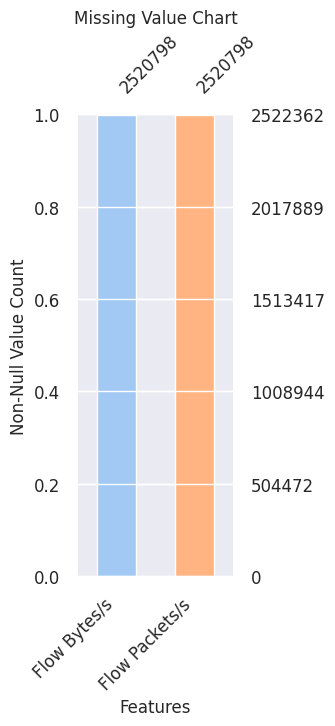

In [ ]:
sns.set_palette('pastel')
colors = sns.color_palette()

missing_vals = [col for col in data.columns if data[col].isna().any()]

fig, ax = plt.subplots(figsize = (2, 6))
msno.bar(data[missing_vals], ax = ax, fontsize = 12, color = colors)
ax.set_xlabel('Features', fontsize = 12)
ax.set_ylabel('Non-Null Value Count', fontsize = 12)
ax.set_title('Missing Value Chart', fontsize = 12)
plt.show()

#### Dealing with missing values (Columns with missing data)

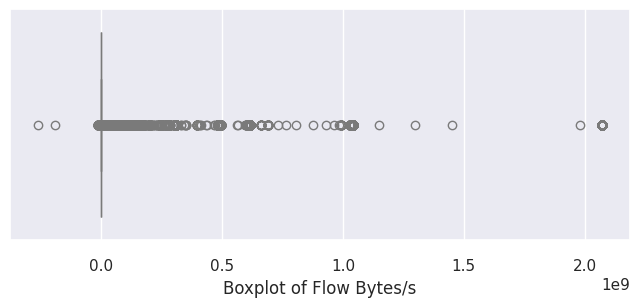

In [ ]:
data = data.reset_index(drop=True)

# Now proceed with creating the boxplot
plt.figure(figsize=(8, 3))
sns.boxplot(x=data['Flow Bytes/s'])
plt.xlabel('Boxplot of Flow Bytes/s')
plt.show()

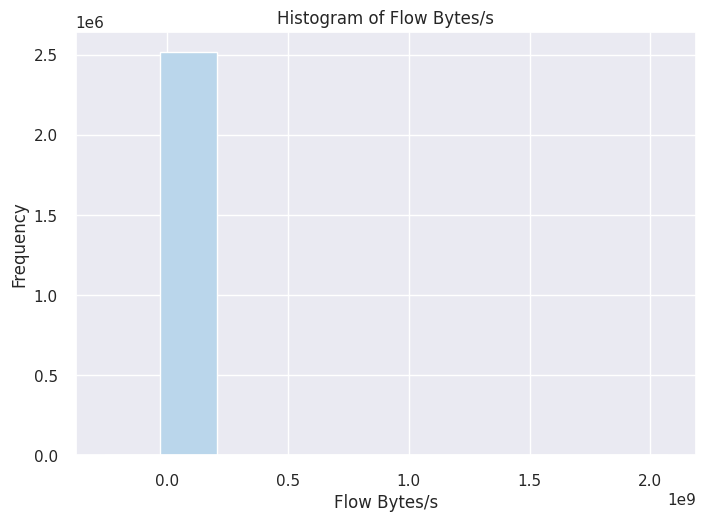

In [ ]:
colors = sns.color_palette('Blues')
plt.hist(data['Flow Bytes/s'], color = colors[1])
plt.title('Histogram of Flow Bytes/s')
plt.xlabel('Flow Bytes/s')
plt.ylabel('Frequency')
plt.show()

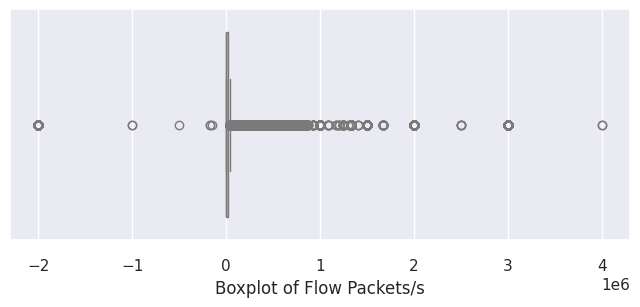

In [ ]:
plt.figure(figsize = (8, 3))
sns.boxplot(x = data['Flow Packets/s'])
plt.xlabel('Boxplot of Flow Packets/s')
plt.show()

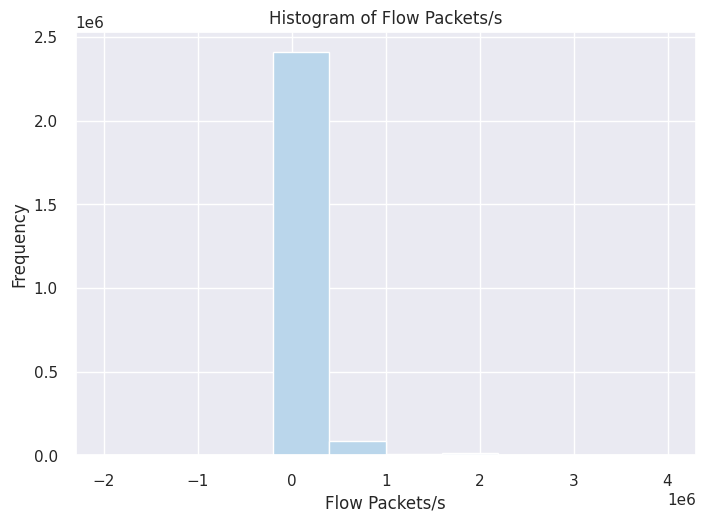

In [ ]:
plt.hist(data['Flow Packets/s'], color = colors[1])
plt.title('Histogram of Flow Packets/s')
plt.xlabel('Flow Packets/s')
plt.ylabel('Frequency')
plt.show()

In [ ]:
med_flow_bytes = data['Flow Bytes/s'].median()
med_flow_packets = data['Flow Packets/s'].median()

print('Median of Flow Bytes/s: ', med_flow_bytes)
print('Median of Flow Packets/s: ', med_flow_packets)

Median of Flow Bytes/s:  3715.0378579999997
Median of Flow Packets/s:  69.742244285


In [ ]:
# Filling missing values with median
data['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
data['Flow Packets/s'].fillna(med_flow_packets, inplace = True)

In [ ]:
print('Number of \'Flow Bytes/s\' missing values:', data['Flow Bytes/s'].isna().sum())
print('Number of \'Flow Packets/s\' missing values:', data['Flow Packets/s'].isna().sum())

Number of 'Flow Bytes/s' missing values: 0
Number of 'Flow Packets/s' missing values: 0


- The first step is to identify duplicate rows and missing or invalid values. We
identified and dropped the duplicate rows (308381 rows). From the data description, we identified that the dataset has infinity values. So, we checked and replaced the positive or negative infinity values with NaN (not a number) and counted it as a missing value. In the dataset, two features, FlowBytes/s, and Flow Packets/s contain missing values. For both columns, the number of missing values is 1564 which is 0.06% of total values.

- Flow Bytes/s and Flow Packets/s are continuous variables. We can see from the Flow Bytes/s and Flow Packets/s histogram and box plot that the majority of values are towards one area which indicates that the data is not normally distributed. The box plot of the Flow Bytes/s and Flow Packets/s shows that the variables have extreme values or outliers. So, our strategy is to fill in missing values with median value. Because, filling the missing values with the median does not introduce any new categories or disrupt the distribution of the data.

In [ ]:
# Save the current state of the 'data' DataFrame to Google Drive.
data.to_csv('/content/drive/MyDrive/CICIDS2017/processed_cicids2017_data.csv', index=False)


## 2.3 Analysing Patterns using Visualisations

#### Visualization of column correlation. Also, plotting Heat Map

In [ ]:
import pandas as pd
from google.colab import drive

drive.mount('/content/drive')
data = pd.read_csv('/content/drive/MyDrive/CICIDS2017/processed_cicids2017_data.csv')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data['Label'].unique()

array(['BENIGN', 'FTP-Patator', 'SSH-Patator', 'DoS slowloris',
       'DoS Slowhttptest', 'DoS Hulk', 'DoS GoldenEye', 'Heartbleed',
       'Web Attack � Brute Force', 'Web Attack � XSS',
       'Web Attack � Sql Injection', 'Infiltration', 'Bot', 'PortScan',
       'DDoS'], dtype=object)

In [ ]:
# Types of attacks & normal instances (BENIGN)
data['Label'].value_counts()

,count
Label,
BENIGN,2096484
DoS Hulk,172849
DDoS,128016
PortScan,90819
DoS GoldenEye,10286
FTP-Patator,5933
DoS slowloris,5385
DoS Slowhttptest,5228
SSH-Patator,3219


In [ ]:
# Creating a dictionary that maps each label to its attack type
attack_map = {
    'BENIGN': 'BENIGN',
    'DDoS': 'DDoS',
    'DoS Hulk': 'DoS',
    'DoS GoldenEye': 'DoS',
    'DoS slowloris': 'DoS',
    'DoS Slowhttptest': 'DoS',
    'PortScan': 'Port Scan',
    'FTP-Patator': 'Brute Force',
    'SSH-Patator': 'Brute Force',
    'Bot': 'Bot',
    'Web Attack � Brute Force': 'Web Attack',
    'Web Attack � XSS': 'Web Attack',
    'Web Attack � Sql Injection': 'Web Attack',
    'Infiltration': 'Infiltration',
    'Heartbleed': 'Heartbleed'
}

# Creating a new column 'Attack Type' in the DataFrame based on the attack_map dictionary
data['Attack Type'] = data['Label'].map(attack_map)

In [ ]:
data['Attack Type'].value_counts()

,count
Attack Type,
BENIGN,2096484
DoS,193748
DDoS,128016
Port Scan,90819
Brute Force,9152
Web Attack,2143
Bot,1953
Infiltration,36
Heartbleed,11


In [ ]:
data.drop('Label', axis = 1, inplace = True)

In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['Attack Number'] = le.fit_transform(data['Attack Type'])

print(data['Attack Number'].unique())

[0 2 4 5 8 6 1 7 3]


In [ ]:
# Printing corresponding attack type for each encoded value
encoded_values = data['Attack Number'].unique()
for val in sorted(encoded_values):
    print(f"{val}: {le.inverse_transform([val])[0]}")

0: BENIGN
1: Bot
2: Brute Force
3: DDoS
4: DoS
5: Heartbleed
6: Infiltration
7: Port Scan
8: Web Attack


In [ ]:
corr = data.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

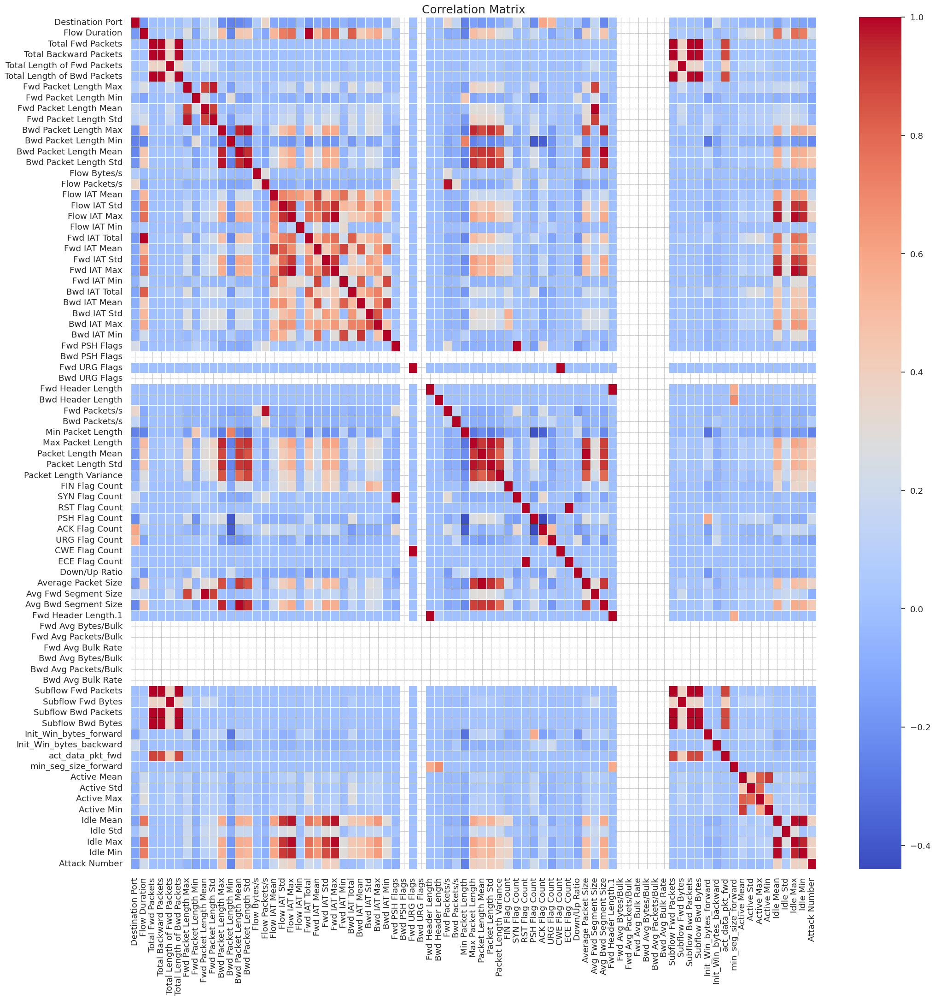

In [ ]:
fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

In [ ]:
# Positive correlation features for 'Attack Number'
pos_corr_features = corr['Attack Number'][(corr['Attack Number'] > 0) & (corr['Attack Number'] < 1)].index.tolist()

print("Features with positive correlation with 'Attack Number':\n")
for i, feature in enumerate(pos_corr_features, start = 1):
    corr_value = corr.loc[feature, 'Attack Number']
    print('{:<3} {:<24} :{}'.format(f'{i}.', feature, corr_value))

Features with positive correlation with 'Attack Number':

1.  Flow Duration            :0.21
2.  Bwd Packet Length Max    :0.44
3.  Bwd Packet Length Mean   :0.43
4.  Bwd Packet Length Std    :0.45
5.  Flow IAT Mean            :0.17
6.  Flow IAT Std             :0.33
7.  Flow IAT Max             :0.38
8.  Flow IAT Min             :0.01
9.  Fwd IAT Total            :0.22
10. Fwd IAT Mean             :0.15
11. Fwd IAT Std              :0.41
12. Fwd IAT Max              :0.38
13. Bwd IAT Mean             :0.01
14. Bwd IAT Std              :0.16
15. Bwd IAT Max              :0.12
16. Bwd Packets/s            :0.07
17. Max Packet Length        :0.4
18. Packet Length Mean       :0.37
19. Packet Length Std        :0.41
20. Packet Length Variance   :0.38
21. FIN Flag Count           :0.23
22. PSH Flag Count           :0.21
23. ACK Flag Count           :0.03
24. Average Packet Size      :0.36
25. Avg Bwd Segment Size     :0.43
26. Init_Win_bytes_forward   :0.04
27. Active Mean              :0.0

In [ ]:
print(f'Number of considerable important features: {len(pos_corr_features)}')

Number of considerable important features: 32


In [ ]:
# Checking for columns with zero standard deviation (the blank squares in the heatmap)
std = data.std(numeric_only = True)
zero_std_cols = std[std == 0].index.tolist()
zero_std_cols

['Bwd PSH Flags',
 'Bwd URG Flags',
 'Fwd Avg Bytes/Bulk',
 'Fwd Avg Packets/Bulk',
 'Fwd Avg Bulk Rate',
 'Bwd Avg Bytes/Bulk',
 'Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate']

- We mapped each label to the corresponding attack type. This groups similar attacks together and provides an easier and more interpretable way to analyze the dataset and identify patterns in the different types of attacks.

- For plotting the correlation matrix, we encoded the 'Attack Type' column and plotted the heatmap. From the heatmap, we observe that there are many pairs of highly correlated features. Highly correlated features in the dataset are problematic and lead to overfitting. A positive correlation exists when one variable decreases as the other variable decreases or one variable increases while the other increases. There are 32 features with positive correlations that may help in predicting the target feature.

- The columns with zero standard deviation have the same value in all rows. These columns don't have any variance. It simply means that there is no meaningful relationship with any other columns which results in NaN correlation cofficient. These columns cannot help differentiate between the classes or groups of data. So, these zero standard deviation columns don't contribute to the correlation matrix and will appear blank in the heatmap. This can be helpful while doing data processing as we may drop the columns if we find out that these columns has no variation.

#### Visualization of Linear Relationships of columns (Continuous Numerical Variables)

In [ ]:
# Data sampling for data analysis
sample_size = int(0.2 * len(data)) # 20% of the original size
sampled_data = data.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape

(504472, 80)

In [ ]:
# To assess if a sample is representative of the population and comparison of descriptive statistics (mean)
numeric_cols = data.select_dtypes(include = [np.number]).columns.tolist()
print('Descriptive Statistics Comparison (mean):\n')
print('{:<32s}{:<22s}{:<22s}{}'.format('Feature', 'Original Dataset', 'Sampled Dataset', 'Variation Percentage'))
print('-' * 96)

high_variations = []
for col in numeric_cols:
    old = data[col].describe()[1]
    new = sampled_data[col].describe()[1]
    if old == 0:
        pct = 0
    else:
        pct = abs((new - old) / old)
    if pct * 100 > 5:
        high_variations.append((col, pct * 100))
    print('{:<32s}{:<22.6f}{:<22.6f}{:<2.2%}'.format(col, old, new, pct))

Descriptive Statistics Comparison (mean):

Feature                         Original Dataset      Sampled Dataset       Variation Percentage
------------------------------------------------------------------------------------------------
Destination Port                8704.762165           8686.623973           0.21%
Flow Duration                   16581323.773163       16502842.174093       0.47%
Total Fwd Packets               10.276271             12.078062             17.53%
Total Backward Packets          11.565964             13.914412             20.30%
Total Length of Fwd Packets     611.575108            601.844586            1.59%
Total Length of Bwd Packets     18133.153930          24424.988089          34.70%
Fwd Packet Length Max           231.091768            230.009202            0.47%
Fwd Packet Length Min           19.194641             19.036484             0.82%
Fwd Packet Length Mean          63.470104             63.151403             0.50%
Fwd Packet Length Std 

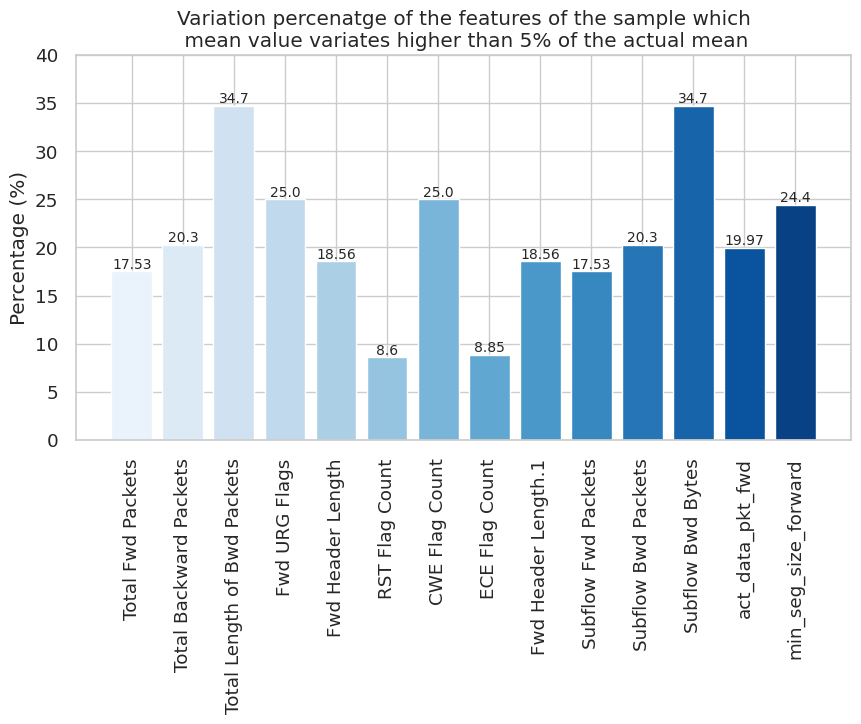

In [ ]:
labels = [t[0] for t in high_variations]
values = [t[1] for t in high_variations]

colors = sns.color_palette('Blues', n_colors=len(labels))
fig, ax = plt.subplots(figsize = (10, 5))
ax.bar(labels, values, color = colors)

for i in range(len(labels)):
    ax.text(i, values[i], str(round(values[i], 2)), ha = 'center', va = 'bottom', fontsize = 10)

plt.xticks(rotation = 90)
ax.set_title('Variation percenatge of the features of the sample which\n mean value variates higher than 5% of the actual mean')
ax.set_ylabel('Percentage (%)')
ax.set_yticks(np.arange(0, 41, 5))
plt.show()

In [ ]:
# Printing the unique value count
indent = '{:<3} {:<30}: {}'
print('Unique value count for: ')
for i, feature in enumerate(list(sampled_data.columns)[:-1], start = 1):
    print(indent.format(f'{i}.', feature, sampled_data[feature].nunique()))

Unique value count for: 
1.  Destination Port              : 33346
2.  Flow Duration                 : 256627
3.  Total Fwd Packets             : 659
4.  Total Backward Packets        : 820
5.  Total Length of Fwd Packets   : 9070
6.  Total Length of Bwd Packets   : 23963
7.  Fwd Packet Length Max         : 3701
8.  Fwd Packet Length Min         : 236
9.  Fwd Packet Length Mean        : 34946
10. Fwd Packet Length Std         : 66038
11. Bwd Packet Length Max         : 3936
12. Bwd Packet Length Min         : 449
13. Bwd Packet Length Mean        : 45585
14. Bwd Packet Length Std         : 62492
15. Flow Bytes/s                  : 346856
16. Flow Packets/s                : 288294
17. Flow IAT Mean                 : 274182
18. Flow IAT Std                  : 229680
19. Flow IAT Max                  : 167860
20. Flow IAT Min                  : 45941
21. Fwd IAT Total                 : 119784
22. Fwd IAT Mean                  : 164556
23. Fwd IAT Std                   : 148638
24. Fwd IAT

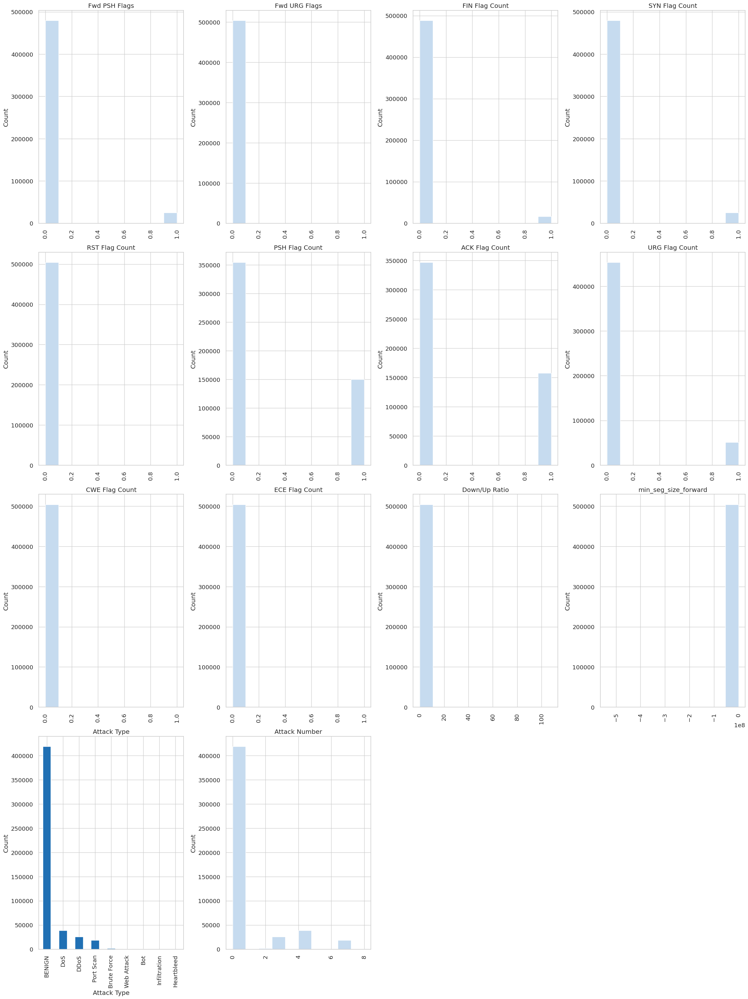

In [ ]:
'''Generating a set of visualizations for columns that have more than one unique value but less than 50 unique values.
For categorical columns, a bar plot is generated showing the count of each unique value.
For numerical columns, a histogram is generated.'''
unique_values = sampled_data.nunique()
selected_cols = sampled_data[[col for col in sampled_data if 1 < unique_values[col] < 50]]
rows, cols = selected_cols.shape
col_names = list(selected_cols)
num_of_rows = (cols + 3) // 4

color_palette = sns.color_palette('Blues', n_colors = 3)
plt.figure(figsize = (6 * 4, 8 * num_of_rows))

for i in range(cols):
    plt.subplot(num_of_rows, 4, i + 1)
    col_data = selected_cols.iloc[:, i]
    if col_data.dtype.name == 'object':
        col_data.value_counts().plot(kind = 'bar', color = color_palette[2])
    else:
        col_data.hist(color = color_palette[0])

    plt.ylabel('Count')
    plt.xticks(rotation = 90)
    plt.title(col_names[i])

plt.tight_layout()
plt.show()

In [ ]:
# Correlation matrix for sampled data
corr_matrix = sampled_data.corr(numeric_only = True).round(2)
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Attack Number
Destination Port,1.00,-0.17,-0.00,-0.00,0.02,-0.00,0.09,-0.05,0.14,0.12,-0.21,-0.26,-0.24,-0.19,0.07,0.36,-0.11,-0.13,-0.13,-0.02,-0.17,-0.11,-0.11,-0.13,-0.05,-0.12,-0.07,-0.04,-0.06,-0.05,0.23,nan,0.01,nan,0.00,0.00,0.35,0.15,-0.26,-0.14,-0.17,-0.14,-0.08,-0.04,0.23,-0.01,-0.22,0.58,0.52,0.01,-0.01,0.03,-0.17,0.14,-0.24,0.00,nan,nan,nan,nan,nan,nan,-0.00,0.02,-0.00,-0.00,-0.13,0.21,-0.00,0.00,-0.04,-0.05,-0.06,-0.03,-0.13,0.01,-0.12,-0.13,-0.12
Flow Duration,-0.17,1.00,0.02,0.02,0.10,0.02,0.27,-0.12,0.14,0.23,0.49,-0.24,0.45,0.43,-0.02,-0.11,0.54,0.74,0.78,0.06,1.00,0.54,0.72,0.78,0.21,0.82,0.41,0.52,0.58,0.21,-0.02,nan,-0.00,nan,-0.00,0.00,-0.10,-0.08,-0.25,0.50,0.42,0.45,0.27,0.22,-0.02,0.01,0.18,0.04,-0.12,-0.00,0.01,-0.17,0.40,0.14,0.45,-0.00,nan,nan,nan,nan,nan,nan,0.02,0.10,0.02,0.02,0.09,-0.03,0.02,-0.00,0.19,0.25,0.29,0.12,0.76,0.24,0.78,0.73,0.21
Total Fwd Packets,-0.00,0.02,1.00,1.00,0.69,0.99,0.01,-0.00,-0.00,0.00,0.03,-0.01,0.02,0.01,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.00,nan,-0.00,nan,0.00,0.02,-0.00,-0.00,-0.01,0.03,0.03,0.01,0.01,-0.00,0.00,-0.00,0.01,0.00,-0.00,-0.00,-0.00,0.00,0.02,-0.00,0.02,0.00,nan,nan,nan,nan,nan,nan,1.00,0.69,1.00,0.99,0.00,-0.00,0.87,-0.00,0.12,0.01,0.08,0.13,0.00,0.00,0.00,0.00,-0.00
Total Backward Packets,-0.00,0.02,1.00,1.00,0.68,0.99,0.01,-0.00,-0.00,0.00,0.03,-0.01,0.02,0.01,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.00,nan,-0.00,nan,0.00,0.02,-0.00,-0.00,-0.01,0.03,0.03,0.01,0.01,-0.00,0.00,-0.00,0.01,0.00,-0.00,-0.00,-0.00,0.00,0.03,-0.00,0.02,0.00,nan,nan,nan,nan,nan,nan,1.00,0.68,1.00,0.99,0.00,-0.00,0.86,0.00,0.12,0.01,0.08,0.13,0.00,0.00,0.00,0.00,-0.00
Total Length of Fwd Packets,0.02,0.10,0.69,0.68,1.00,0.69,0.31,-0.00,0.29,0.25,0.04,-0.05,0.03,0.01,0.00,-0.02,0.01,0.02,0.04,-0.00,0.10,0.01,0.04,0.04,-0.01,0.12,0.01,0.06,0.07,-0.01,0.01,nan,-0.00,nan,-0.00,0.01,-0.02,-0.02,-0.05,0.12,0.13,0.09,0.06,-0.01,0.01,0.01,0.07,-0.01,-0.01,-0.00,0.01,-0.02,0.12,0.29,0.03,-0.00,nan,nan,nan,nan,nan,nan,0.69,1.00,0.68,0.69,0.05,0.01,0.78,-0.00,0.19,0.12,0.19,0.16,0.03,0.04,0.04,0.03,-0.03
Total Length of Bwd Packets,-0.00,0.02,0.99,0.99,0.69,1.00,0.01,-0.00,-0.00,-0.00,0.03,-0.00,0.02,0.01,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,-0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.00,nan,-0.00,nan,0.00,0.02,-0.00,-0.00,-0.01,0.03,0.03,0.01,0.01,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.02,-0.00,0.02,0.00,nan,nan,nan,nan,nan,nan,0.99,0.69,0.99,1.00,0.00,-0.00,0.88,0.00,0.11,0.00,0.07,0.13,0.00,-0.00,0.00,0.00,-0.00
Fwd Packet Length Max,0.09,0.27,0.01,0.01,0.31,0.01,1.00,-0.01,0.

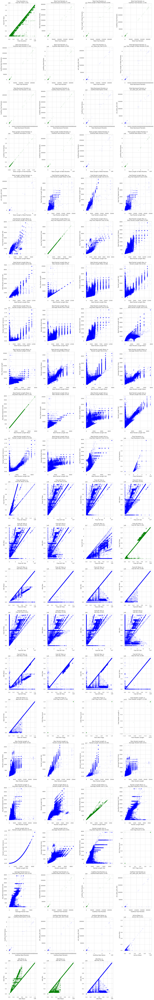

In [ ]:
# Plotting the pairs of strongly positive correlated features in the sampled_data that have a correlation coefficient of 0.85 or higher
cols = list(sampled_data.columns)[:-2]
high_corr_pairs = []
corr_th = 0.85

for i in range(len(cols)):
  for j in range(i + 1, len(cols)):
    val = sampled_data[cols[i]].corr(sampled_data[cols[j]])
    # If the correlation coefficient is NaN or below the threshold, skip to the next pair
    if np.isnan(val) or val < corr_th:
      continue
    high_corr_pairs.append((val, cols[i], cols[j]))

size, cols = len(high_corr_pairs), 4
rows, rem =  size // cols, size % cols
if rem:
  rows += 1

fig, axs = plt.subplots(rows, cols, figsize = (24, int(size * 1.7)))
for i in range(rows):
    for j in range(cols):
      try:
        val, x, y = high_corr_pairs[i * cols + j]
        if val > 0.99:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'green', alpha = 0.1)
        else:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'blue', alpha = 0.1)
        axs[i, j].set_xlabel(x)
        axs[i, j].set_ylabel(y)
        axs[i, j].set_title(f'{x} vs\n{y} ({val:.2f})')
      except IndexError:
        fig.delaxes(axs[i, j])

fig.tight_layout()
plt.show()

In [ ]:
sampled_data.drop('Attack Number', axis = 1, inplace = True)
data.drop('Attack Number', axis = 1, inplace = True)

In [ ]:
# Identifying outliers
numeric_data = sampled_data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

print(outlier_stats)

                             Outlier Count  Outlier Percentage
Destination Port                    109246               21.66
Flow Duration                        93195               18.47
Total Fwd Packets                    50245                9.96
Total Backward Packets               47509                9.42
Total Length of Fwd Packets          62790               12.45
...                                    ...                 ...
Active Min                          111387               22.08
Idle Mean                           113092               22.42
Idle Std                             45767                9.07
Idle Max                            113092               22.42
Idle Min                            113092               22.42

[78 rows x 2 columns]


In [ ]:
# Identifying outliers based on attack type
outlier_counts = {}
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[i][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)

for i in numeric_data:
  print(f'Feature: {i}')
  for attack_type in sampled_data['Attack Type'].unique():
    num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
    print(f'- {attack_type}: {num_outliers} ({outlier_percent:.2f}%)')
  print()

Feature: Destination Port
- BENIGN: 93525 (22.33%)
- DoS: 0 (0.00%)
- DDoS: 2 (0.01%)
- Port Scan: 2305 (12.51%)
- Brute Force: 0 (0.00%)
- Web Attack: 0 (0.00%)
- Bot: 0 (0.00%)
- Infiltration: 0 (0.00%)
- Heartbleed: 0 (0.00%)

Feature: Flow Duration
- BENIGN: 97175 (23.20%)
- DoS: 8444 (21.87%)
- DDoS: 4397 (16.96%)
- Port Scan: 403 (2.19%)
- Brute Force: 443 (23.86%)
- Web Attack: 67 (15.62%)
- Bot: 0 (0.00%)
- Infiltration: 1 (25.00%)
- Heartbleed: 0 (0.00%)

Feature: Total Fwd Packets
- BENIGN: 77615 (18.53%)
- DoS: 464 (1.20%)
- DDoS: 833 (3.21%)
- Port Scan: 272 (1.48%)
- Brute Force: 0 (0.00%)
- Web Attack: 68 (15.85%)
- Bot: 7 (1.82%)
- Infiltration: 1 (25.00%)
- Heartbleed: 0 (0.00%)

Feature: Total Backward Packets
- BENIGN: 59799 (14.28%)
- DoS: 4479 (11.60%)
- DDoS: 0 (0.00%)
- Port Scan: 97 (0.53%)
- Brute Force: 0 (0.00%)
- Web Attack: 36 (8.39%)
- Bot: 7 (1.82%)
- Infiltration: 1 (25.00%)
- Heartbleed: 0 (0.00%)

Feature: Total Length of Fwd Packets
- BENIGN: 80997 (19

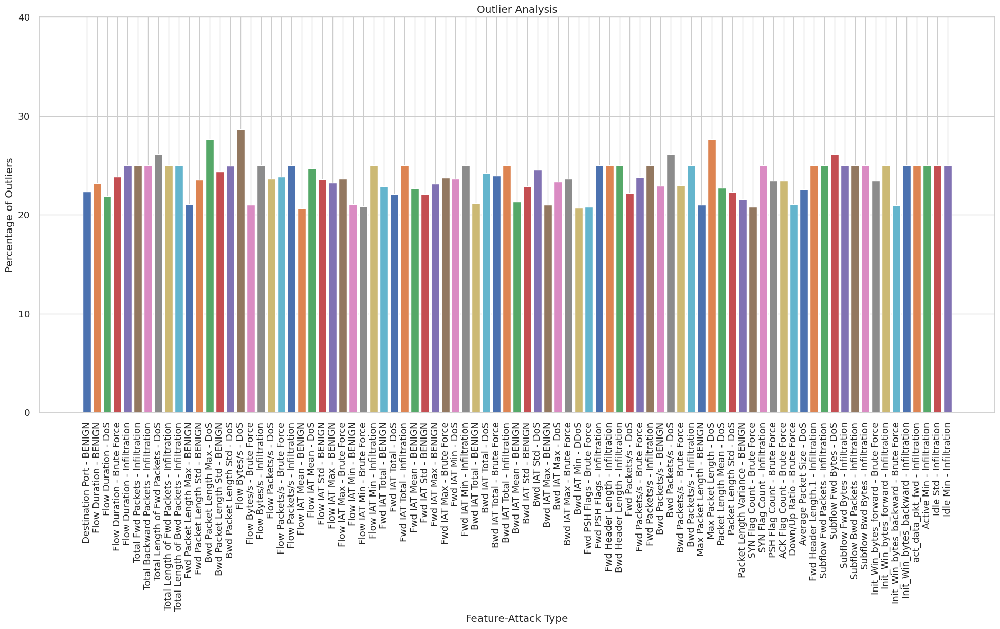

In [ ]:
# Plotting the percentage of outliers that are higher than 20%
fig, ax = plt.subplots(figsize = (24, 10))
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
        if outlier_percent > 20:
            ax.bar(f'{i} - {attack_type}', outlier_percent)

ax.set_xlabel('Feature-Attack Type')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 90)
plt.show()

- As we have a large dataset, it was both time-consuming and computationally expensive to do all the analysis on the original-sized dataset. Therefore, we sampled 20% of the dataset to do our computationally expensive analysis. We also assessed whether the sample is representative of the population by doing a comparison of descriptive statistics (mean) and features that variates 5%
higher than the actual mean values of the dataset.

- A histogram for numerical columns and a bar plot for categorical columns are generated that have more than one unique value and less than 50 unique values. The plots visualize the distribution of data in a quick and easier way. This visualizes patterns like the distribution of values in numerical columns and common categories in categorical columns. It is used to understand the relationships between different variables and identify anomalies in the data.

- The scatter plots show the relationship between strongly positive correlated features with a correlation coefficient of 0.85 or higher. Blue scatter plot points show the correlation coefficient pairs less than 0.99 and green scatter plot points show the pairs with 0.99 or almost 1.0. From these plots, we can visualize linear relationships between the features or identify indications of multicollinearity between features where two or more predictors are highly correlated. Highly correlated features introduce multicollinearity which causes problems for machine learning algorithms because it assumes that the features are independent. From some of the plots, we can see that there is a tight cluster of data points around
the straight line where the correlation coefficient is close to 1.

- We identified the outliers of each feature based on attack types and found that this dataset contains many outliers. Outliers increase variability in the dataset. But in the dataset, outliers may indicate different patterns like network intrusion attempts.

#### Visualization of column relationships (Categorical Variables)

All the features in our dataset is numerical. We have one Categorical Variable.

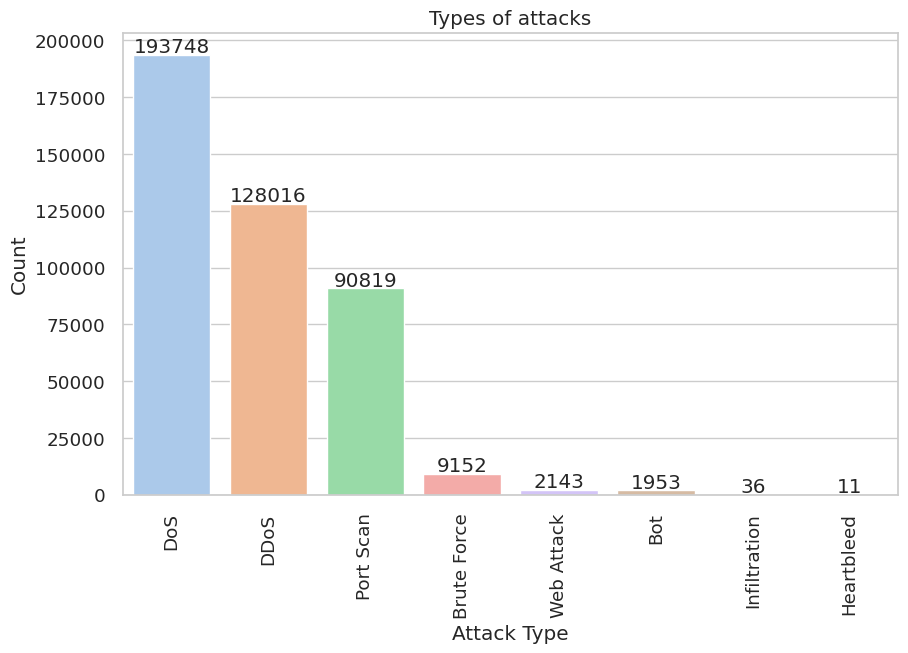

In [ ]:
# Different 'Attack Type' in the main dataset excluding 'BENIGN'
attacks = data.loc[data['Attack Type'] != 'BENIGN']

plt.figure(figsize = (10, 6))
ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)
plt.title('Types of attacks')
plt.xlabel('Attack Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height() + 1000), ha = 'center')

plt.show()

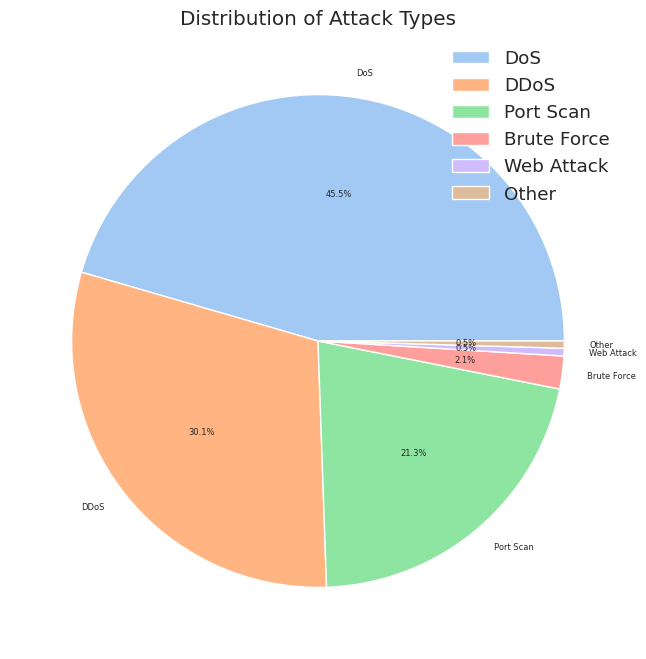

In [ ]:
attack_counts = attacks['Attack Type'].value_counts()
threshold = 0.005
percentages = attack_counts / attack_counts.sum()
small_slices = percentages[percentages < threshold].index.tolist()
attack_counts['Other'] = attack_counts[small_slices].sum()
attack_counts.drop(small_slices, inplace = True)

sns.set_palette('pastel')
plt.figure(figsize = (8, 8))
plt.pie(attack_counts.values, labels = attack_counts.index, autopct = '%1.1f%%', textprops={'fontsize': 6})
plt.title('Distribution of Attack Types')
plt.legend(attack_counts.index, loc = 'best')
plt.show()

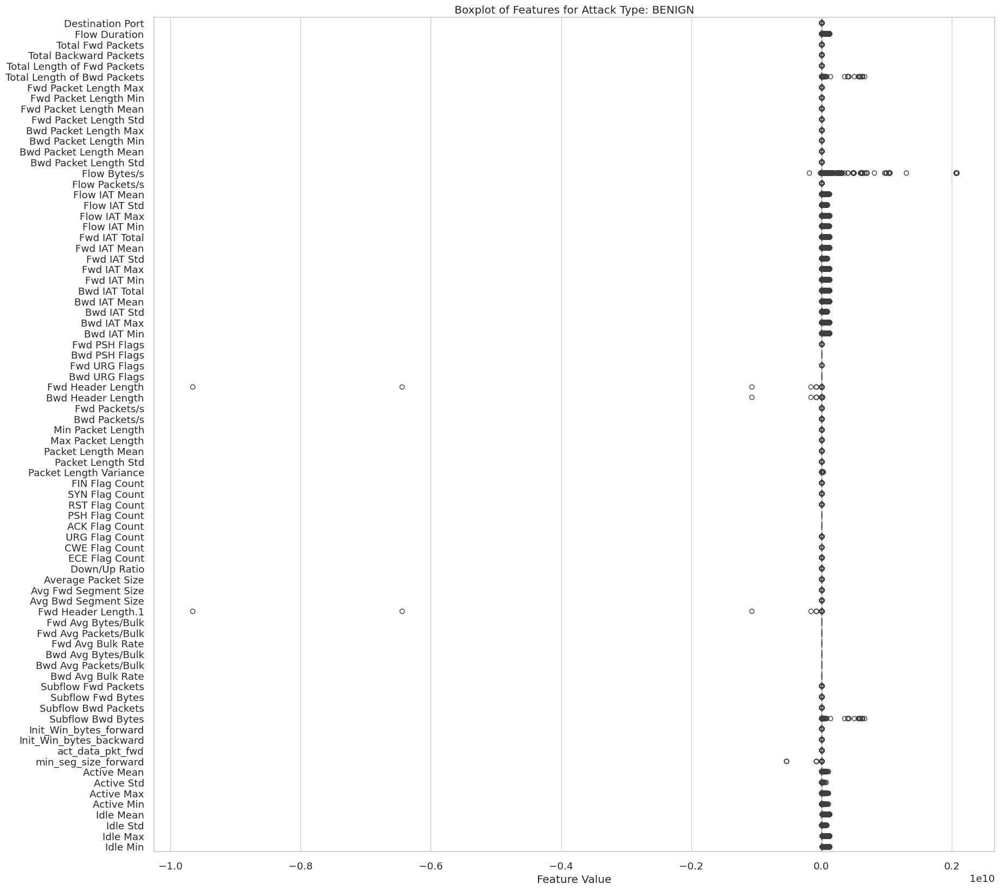

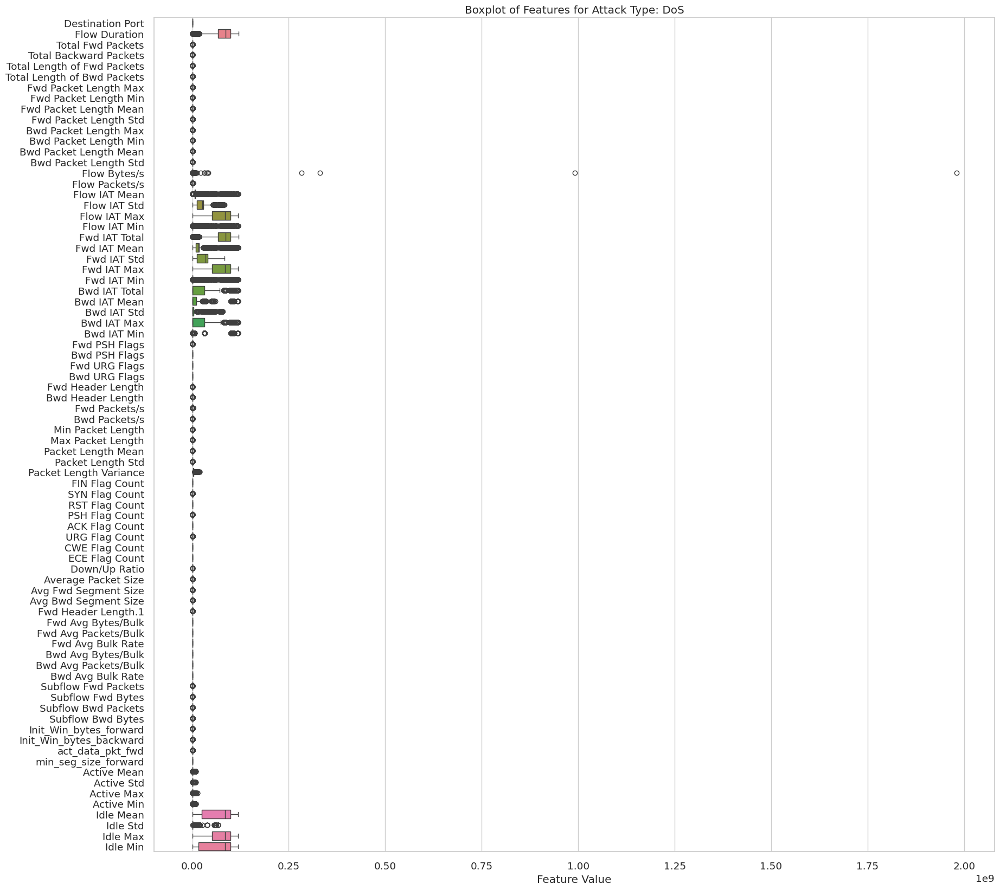

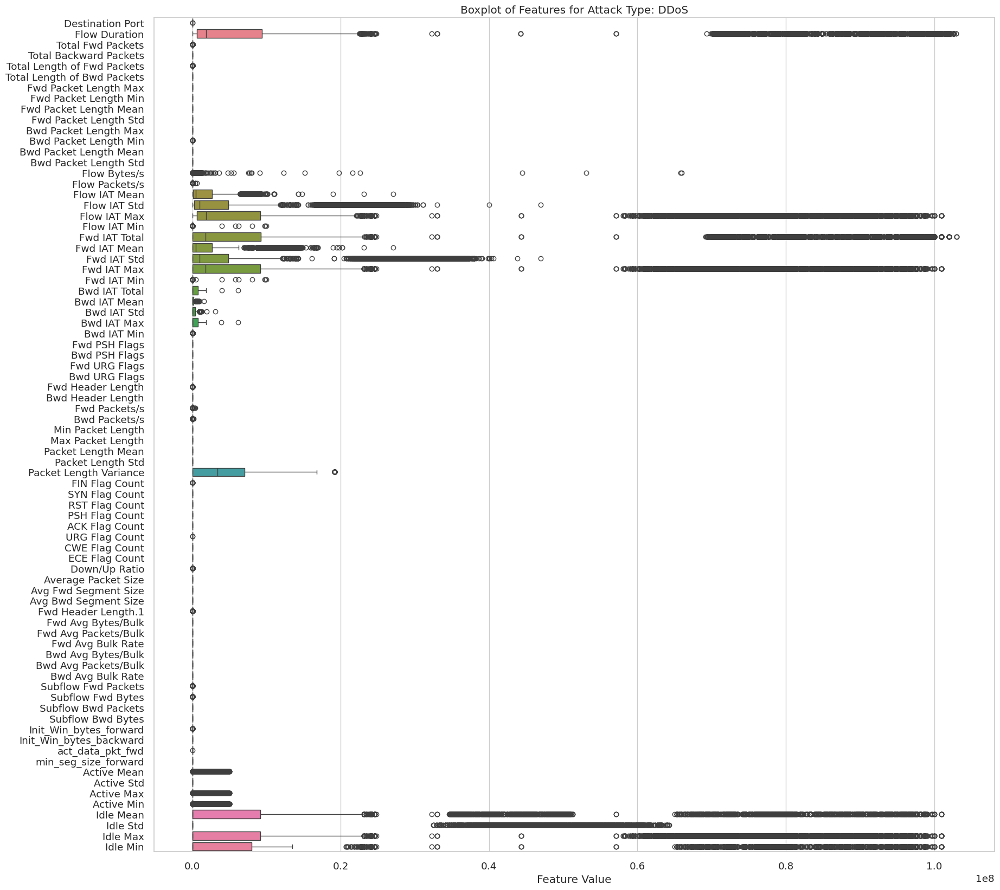

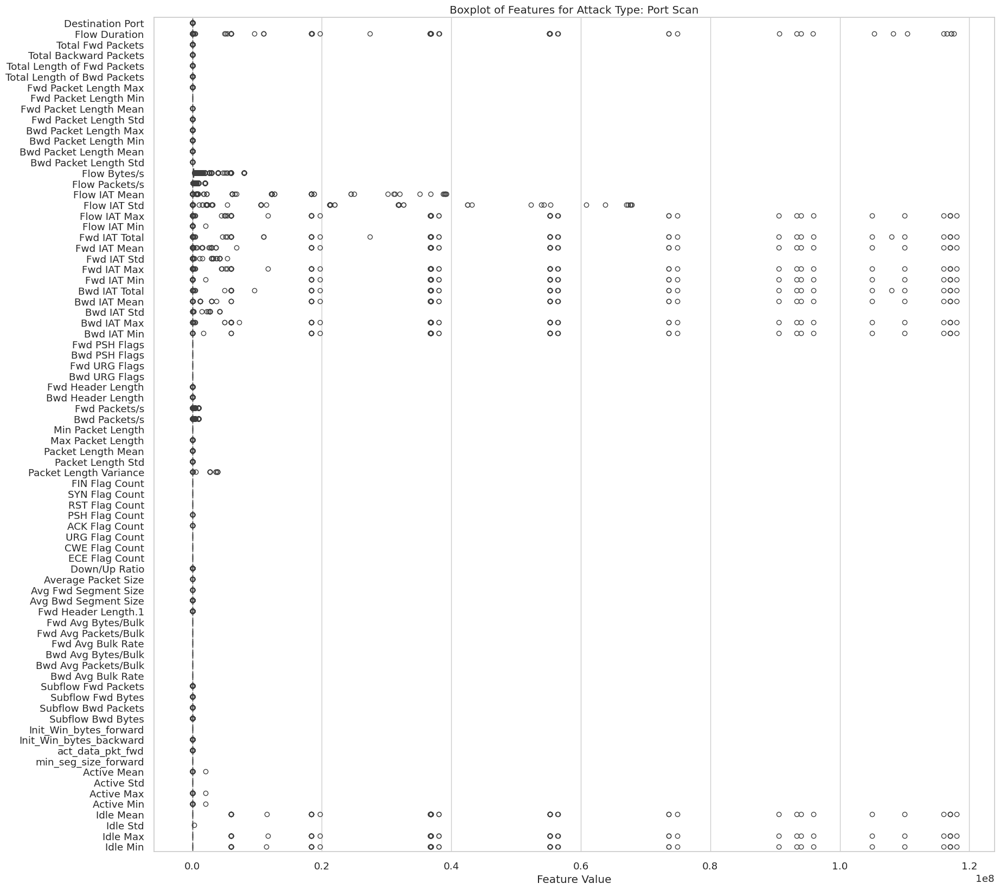

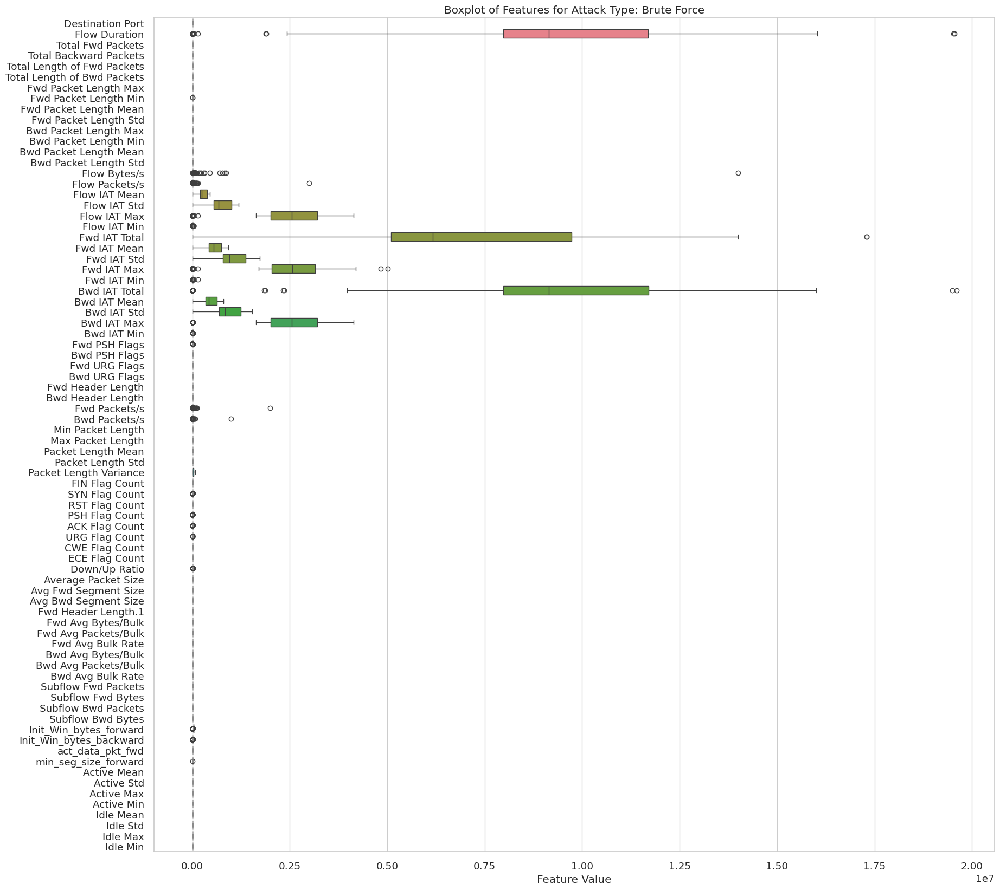

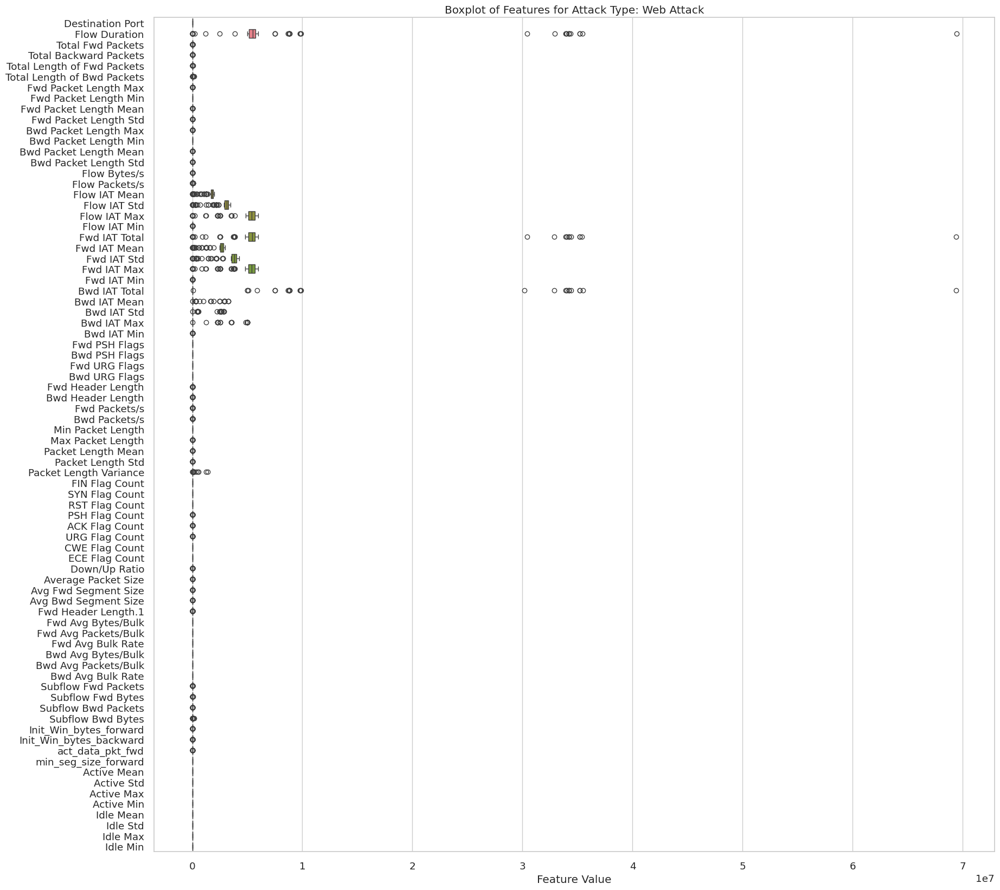

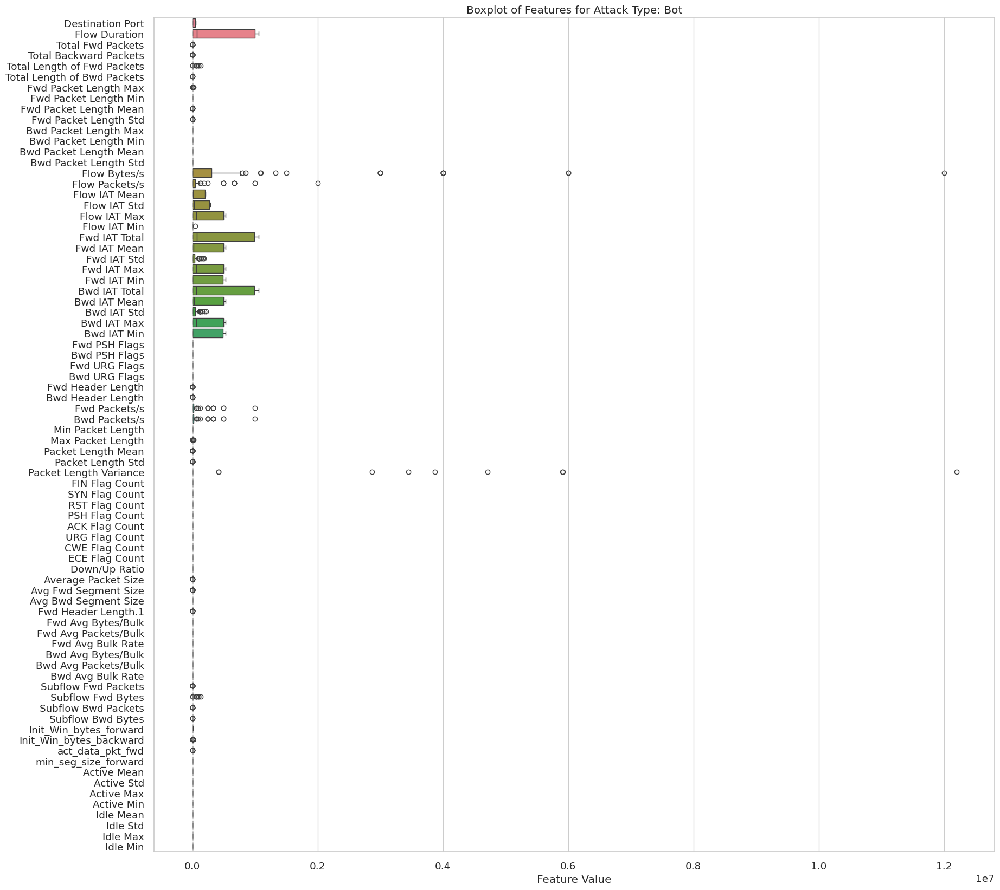

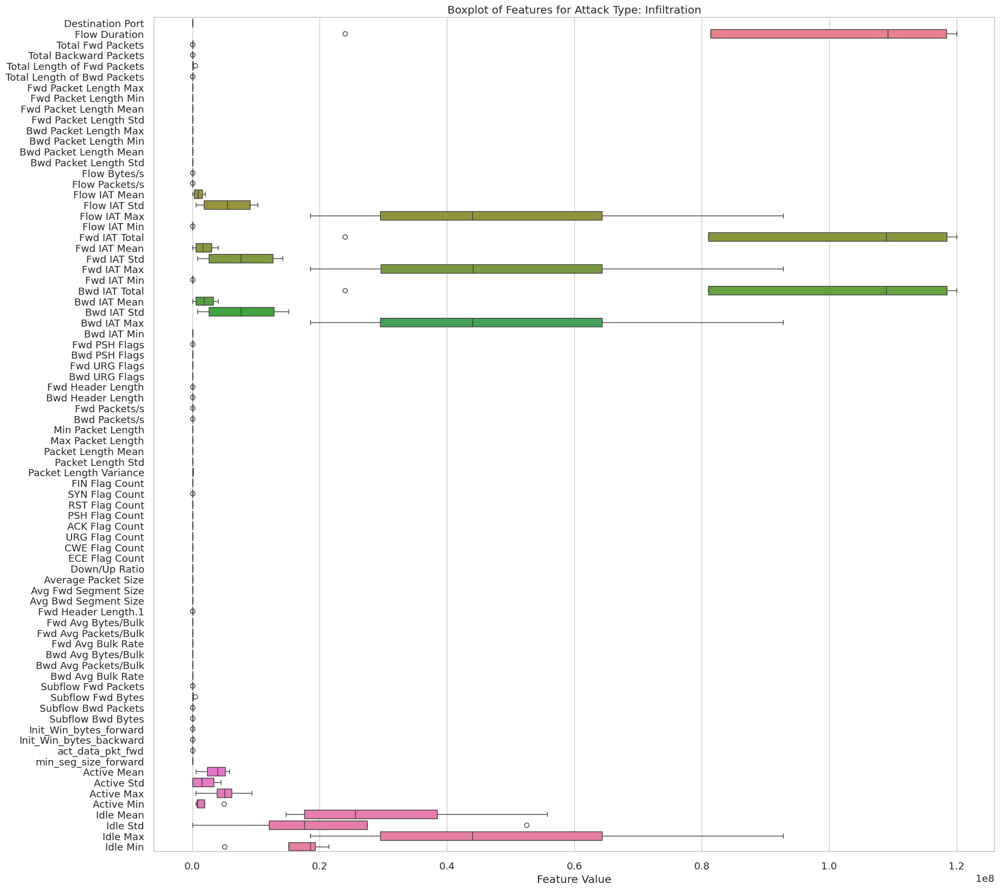

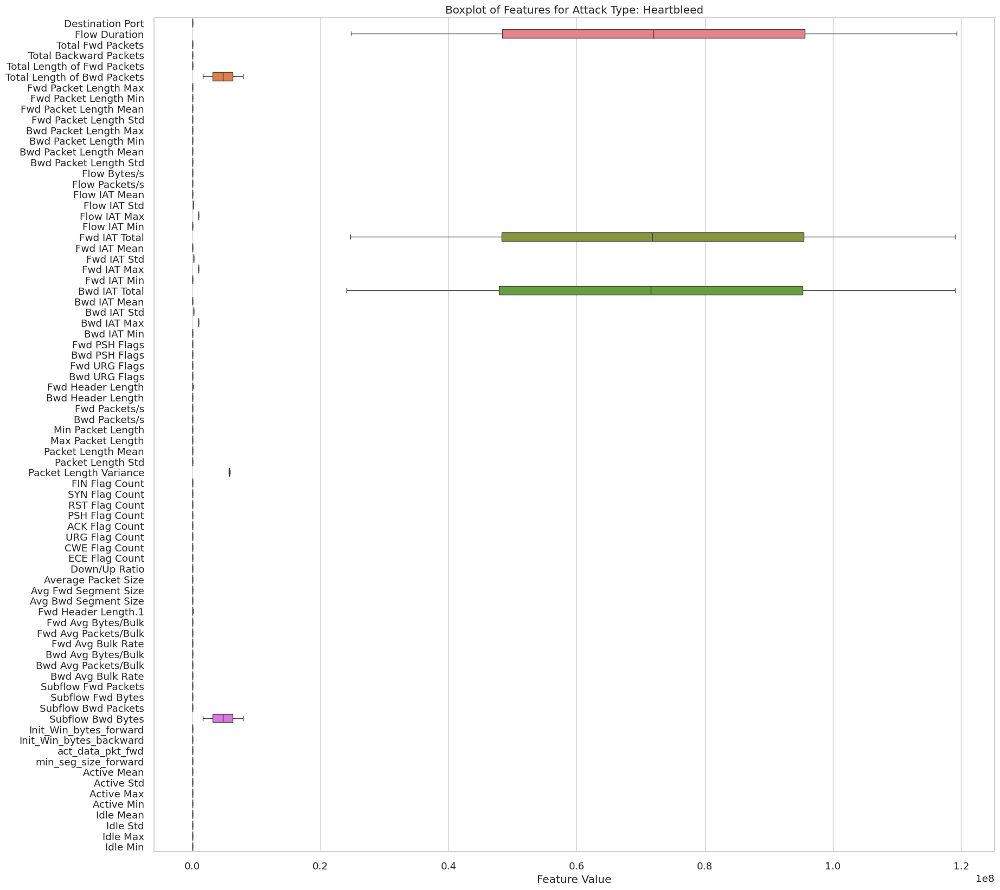

In [ ]:
# Creating a boxplot for each attack type with the columns of sampled dataset
for attack_type in sampled_data['Attack Type'].unique():
    attack_data = sampled_data[sampled_data['Attack Type'] == attack_type]
    plt.figure(figsize=(20, 20))
    sns.boxplot(data = attack_data.drop(columns = ['Attack Type']), orient = 'h')
    plt.title(f'Boxplot of Features for Attack Type: {attack_type}')
    plt.xlabel('Feature Value')
    plt.show()

In [ ]:
data.groupby('Attack Type').first()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
Attack Type,,,,,,,,,,,,,,,,,,,,,
BENIGN,49188,4,2,0,12,0,6,6,6.000000,0.000000,...,1,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Bot,8080,60202640,9,9,322,256,322,0,35.777778,107.333333,...,1,32,63678.2,22252.53596,103175,50911,10200000.0,34941.27201,10200000,10100000
Brute Force,80,5216127,3,1,0,0,0,0,0.000000,0.000000,...,0,32,0.0,0.00000,0,0,0.0,0.00000,0,0
DDoS,80,1293792,3,7,26,11607,20,0,8.666667,10.263203,...,2,20,0.0,0.00000,0,0,0.0,0.00000,0,0
DoS,80,5169956,8,6,1101,4222,410,0,137.625000,185.758628,...,7,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Heartbleed,444,119302728,2685,1729,8299,7556917,517,0,3.090875,16.858421,...,118,32,2217.0,0.00000,2217,2217,5024984.0,0.00000,5024984,5024984
Infiltration,444,42664070,5,6,141,291,93,0,28.200000,38.861292,...,4,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Port Scan,80,5021059,6,5,703,1414,356,0,117.166667,181.536131,...,2,32,0.0,0.00000,0,0,0.0,0.00000,0,0
Web Attack,80,5185118,7,7,1022,2321,372,0,146.000000,184.078788,...,3,32,0.0,0.00000,0,0,0.0,0.00000,0,0


### 2.3.4 Attack Distribution Analysis

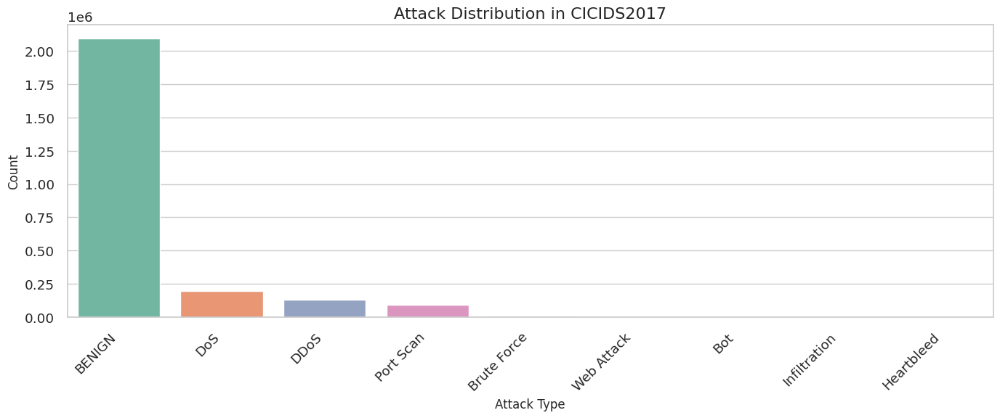

Attack Type
BENIGN          83.115905
DoS              7.681213
DDoS             5.075243
Port Scan        3.600554
Brute Force      0.362835
Web Attack       0.084960
Bot              0.077427
Infiltration     0.001427
Heartbleed       0.000436
Name: count, dtype: float64


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Show distribution of attack labels
plt.figure(figsize=(14,6))
# Use 'Attack Type' instead of 'Label'
attack_counts = data['Attack Type'].value_counts()
sns.barplot(x=attack_counts.index, y=attack_counts.values, palette='Set2')
plt.title('Attack Distribution in CICIDS2017', fontsize=16)
plt.xlabel('Attack Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Optional: Percentage distribution of attacks
attack_percent = (attack_counts / attack_counts.sum()) * 100
print(attack_percent)

In [ ]:

data.to_csv('/content/drive/MyDrive/CICIDS2017/processed_cicids2017_data2.csv', index=False)


# 3. Data Preprocessing

In [ ]:
from google.colab import drive
import pandas as pd

drive.mount('/content/drive')
data = pd.read_csv('/content/drive/MyDrive/CICIDS2017/processed_cicids2017_data2.csv')


### Undersampling of 'Benign' to reduce computaional complexity'

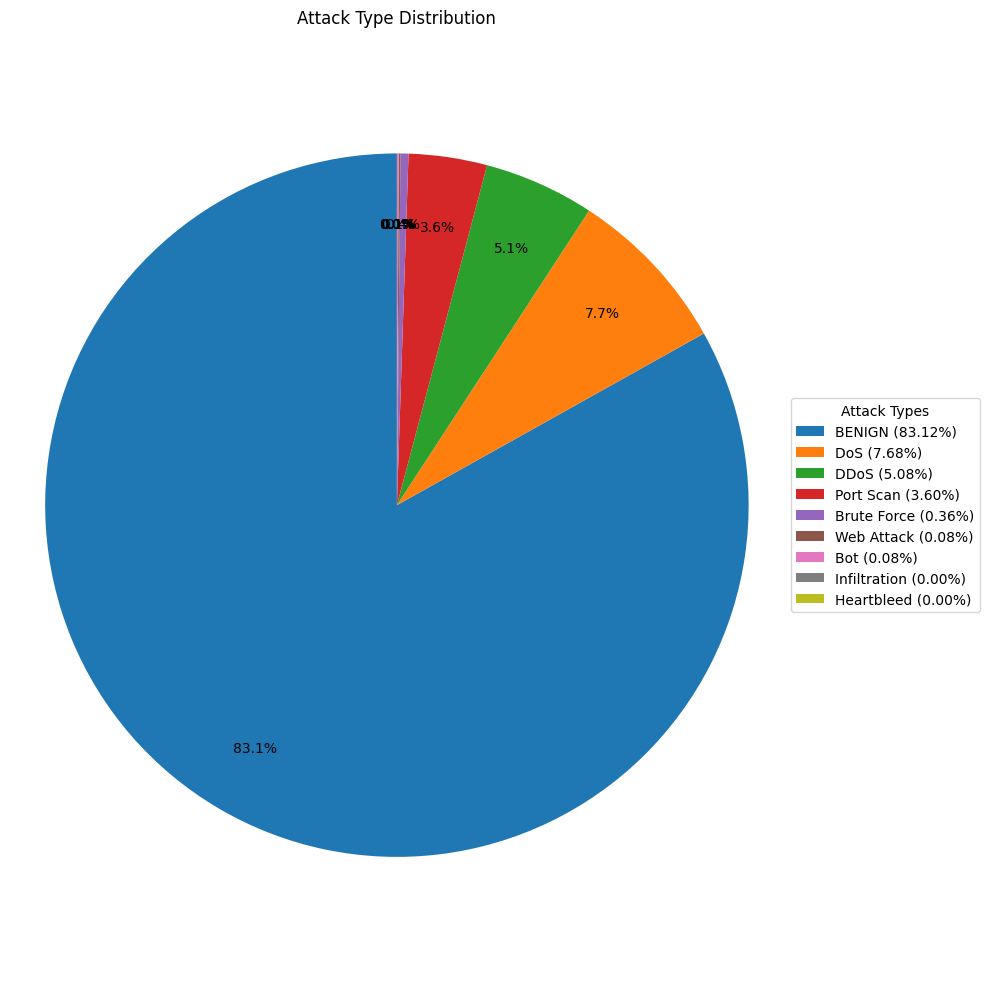

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate attack type percentages
attack_counts = data['Attack Type'].value_counts()
attack_percentages = (attack_counts / attack_counts.sum()) * 100

# Create the pie chart
plt.figure(figsize=(10, 10))
patches, texts, autotexts = plt.pie(
    attack_percentages,
    labels=None,  # We'll use a legend instead
    autopct='%1.1f%%',
    startangle=90,
    labeldistance=1.1,  # Push labels outward if needed
    pctdistance=0.8
)

# Improve text readability
for text in texts + autotexts:
    text.set_fontsize(10)

# Add a legend outside the pie chart
plt.legend(
    patches,
    [f'{label} ({percent:.2f}%)' for label, percent in zip(attack_percentages.index, attack_percentages)],
    title='Attack Types',
    loc='center left',
    bbox_to_anchor=(1, 0.5),
    fontsize=10
)

plt.title('Attack Type Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()
plt.show()


In [ ]:
from imblearn.under_sampling import NearMiss
import pandas as pd
import numpy as np
from collections import Counter

# 1. Compute desired BENIGN count = 3% more than attack samples
attack_total = (data['Attack Type'] != 'BENIGN').sum()
n_benign_desired = int(attack_total * 1.03)

print("Original label distribution:", Counter(data['Attack Type']))
print(f"Attack total: {attack_total}")
print(f"Target BENIGN count (3% more than attacks): {n_benign_desired}")

# 2. Separate features and target
X = data.drop(columns=['Attack Type'])
y = data['Attack Type']

# 3. Select numeric columns only
X_numeric = X.select_dtypes(include=[np.number])

# 4. Apply NearMiss to undersample BENIGN
nm = NearMiss(
    version=1,
    sampling_strategy={'BENIGN': n_benign_desired}
)
X_res, y_res = nm.fit_resample(X_numeric, y)

# 5. Reconstruct DataFrame
resampled_df = pd.DataFrame(X_res, columns=X_numeric.columns)
resampled_df['Attack Type'] = y_res

print("Resampled label distribution:", Counter(resampled_df['Attack Type']))

# 6. Save to Google Drive
output_path = '/content/drive/MyDrive/CICIDS2017/undersampled_data_nearmiss.csv'
resampled_df.to_csv(output_path, index=False)
print(f"Undersampled data saved to: {output_path}")


Original label distribution: Counter({'BENIGN': 2096484, 'DoS': 193748, 'DDoS': 128016, 'Port Scan': 90819, 'Brute Force': 9152, 'Web Attack': 2143, 'Bot': 1953, 'Infiltration': 36, 'Heartbleed': 11})
Attack total: 425878
Target BENIGN count (3% more than attacks): 438654
Resampled label distribution: Counter({'BENIGN': 438654, 'DoS': 193748, 'DDoS': 128016, 'Port Scan': 90819, 'Brute Force': 9152, 'Web Attack': 2143, 'Bot': 1953, 'Infiltration': 36, 'Heartbleed': 11})
Undersampled data saved to: /content/drive/MyDrive/CICIDS2017/undersampled_data_nearmiss.csv


In [ ]:
import pandas as pd
# Load the undersampled data
#mount drive
from google.colab import drive
drive.mount('/content/drive')
undersampled_data_path = '/content/drive/MyDrive/CICIDS2017/undersampled_data.csv'
data = pd.read_csv(undersampled_data_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Preprocessing

In [ ]:
# For improving performance and reduce memory-related errors
old_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f'Initial memory usage: {old_memory_usage:.2f} MB')
for col in data.columns:
    col_type = data[col].dtype
    if col_type != object:
        c_min = data[col].min()
        c_max = data[col].max()
        # Downcasting float64 to float32
        if str(col_type).find('float') >= 0 and c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
            data[col] = data[col].astype(np.float32)

        # Downcasting int64 to int32
        elif str(col_type).find('int') >= 0 and c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
            data[col] = data[col].astype(np.int32)

new_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f"Final memory usage: {new_memory_usage:.2f} MB")

Initial memory usage: 461.39 MB
Final memory usage: 240.44 MB


In [ ]:
# Calculating percentage reduction in memory usage
print(f'Reduced memory usage: {1 - (new_memory_usage / old_memory_usage):.2%}')

Reduced memory usage: 47.89%


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 851756 entries, 0 to 851755
Data columns (total 71 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Destination Port             851756 non-null  int32  
 1   Flow Duration                851756 non-null  int32  
 2   Total Fwd Packets            851756 non-null  int32  
 3   Total Backward Packets       851756 non-null  int32  
 4   Total Length of Fwd Packets  851756 non-null  int32  
 5   Total Length of Bwd Packets  851756 non-null  int32  
 6   Fwd Packet Length Max        851756 non-null  int32  
 7   Fwd Packet Length Min        851756 non-null  int32  
 8   Fwd Packet Length Mean       851756 non-null  float32
 9   Fwd Packet Length Std        851756 non-null  float32
 10  Bwd Packet Length Max        851756 non-null  int32  
 11  Bwd Packet Length Min        851756 non-null  int32  
 12  Bwd Packet Length Mean       851756 non-null  float32
 13 

In [ ]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Destination Port,2522362.0,8.704762e+03,1.902507e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2522362.0,1.658132e+07,3.522426e+07,-1.300000e+01,208.000000,50577.000000,5.329717e+06,1.200000e+08
Total Fwd Packets,2522362.0,1.027627e+01,7.941738e+02,1.000000e+00,2.000000,2.000000,6.000000e+00,2.197590e+05
Total Backward Packets,2522362.0,1.156596e+01,1.056594e+03,0.000000e+00,1.000000,2.000000,5.000000e+00,2.919220e+05
Total Length of Fwd Packets,2522362.0,6.115751e+02,1.058499e+04,0.000000e+00,12.000000,66.000000,3.320000e+02,1.290000e+07
Total Length of Bwd Packets,2522362.0,1.813315e+04,2.397434e+06,0.000000e+00,6.000000,155.000000,9.880000e+02,6.554530e+08
Fwd Packet Length Max,2522362.0,2.310918e+02,7.561625e+02,0.000000e+00,6.000000,40.000000,2.020000e+02,2.482000e+04
Fwd Packet Length Min,2522362.0,1.919464e+01,6.079447e+01,0.000000e+00,0.000000,2.000000,3.700000e+01,2.325000e+03
Fwd Packet Length Mean,2522362.0,6.347013e+01,1.955015e+02,0.000000e+00,6.000000,36.111111,5.200000e+01,5.940857e+03
Fwd Packet Length Std,2522362.0,7.727757e+01,2.967953e+02,0.000000e+00,0.000000,0.000000,7.413914e+01,7.125597e+03


In [ ]:
# Dropping columns with only one unique value
num_unique = data.nunique()
one_variable = num_unique[num_unique == 1]
not_one_variable = num_unique[num_unique > 1].index

dropped_cols = one_variable.index
data = data[not_one_variable]

print('Dropped columns:')
dropped_cols

Dropped columns:


Index([], dtype='object')

In [ ]:
data.shape

(2522362, 71)

In [ ]:
# Columns after removing non variant columns
data.columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Fwd URG Flags',
       'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s',
       'Bwd Packets/s', 'Min Packet Length', 'Max Packet Length',
       'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance',
       'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count',

- To improve performance and reduce the risk of memory-related errors (mostly session crashes), we downcasted the float and integer values based on the presence of the minimum and maximum values and reduced memory usage by 47.5%.

- The columns with zero standard deviation have the same value in all rows.
These columns don't have any variance. It simply means that there is no meaningful relationship with any other columns. These columns cannot help differentiate between the classes or groups of data. So, we dropped the columns that have no variation.

## Feature Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

# Select only numeric columns
num_cols = data.select_dtypes(include=['int64','float64']).columns

# Fit scaler on the entire cleaned dataset
scaler = StandardScaler()
data[num_cols] = scaler.fit_transform(data[num_cols])

## Feature Selction


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import shap
from umap import UMAP

# Constants
MAX_FEATURES = 24  # Maximum features for all methods
HYBRID_FIRST_STAGE = 48  # First stage features for hybrid methods

# Function to measure execution time and performance
def evaluate_method(X_train, X_test, y_train, y_test, method_name):
    start_time = time.time()

    # Train LightGBM classifier
    model = LGBMClassifier(random_state=42,verbose=-1)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='macro')
    exec_time = time.time() - start_time

    return {
        'Method': method_name,
        'Accuracy': accuracy,
        'F1 Score': f1,
        'Execution Time': exec_time,
        'Feature Count': X_train.shape[1]
    }

# Load your data (replace this with your actual data loading)
# data = pd.read_csv('your_dataset.csv')

# For demonstration, let's assume 'data' is loaded
# with features and a 'target' column for multiclass classification

# Create a binary classification version
data_binary = data.copy()
# Assuming 'normal' is your benign class and everything else is an attack
data_binary['label'] = data_binary['Attack Type'].apply(lambda x: 0 if x == 'normal' else 1)

# Split features and targets
X = data.drop('Attack Type', axis=1)
y = data['Attack Type']  # Multiclass target
y_binary = data_binary['label']  # Binary target

# Store original feature count
total_attributes = X.shape[1]

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(X, y_binary, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize results storage
results = []

# 1. Tree-based feature selection
def tree_based_selection(X_train, X_test, n_features=MAX_FEATURES):
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)

    # Select top n_features based on importance
    selector = SelectFromModel(rf, threshold=-np.inf, max_features=n_features)
    selector.fit(X_train, y_train)

    # Transform datasets
    X_train_selected = selector.transform(X_train)
    X_test_selected = selector.transform(X_test)

    # Get selected feature indices
    selected_indices = selector.get_support()

    return X_train_selected, X_test_selected, selected_indices

# 2. PCA feature reduction
def pca_reduction(X_train, X_test, n_components=MAX_FEATURES):
    pca = PCA(n_components=n_components)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)

    # Calculate explained variance
    explained_variance = sum(pca.explained_variance_ratio_)

    return X_train_pca, X_test_pca, explained_variance

# 3. UMAP dimensionality reduction
def umap_reduction(X_train, X_test, n_components=MAX_FEATURES):
    reducer = UMAP(n_components=n_components, random_state=42)
    X_train_umap = reducer.fit_transform(X_train)
    X_test_umap = reducer.transform(X_test)

    return X_train_umap, X_test_umap

# 4. Iterative method (2 iterations)
def iterative_selection(X_train, X_test, y_train, n_features=MAX_FEATURES, iterations=2):
    X_train_iter = X_train.copy()
    X_test_iter = X_test.copy()

    for i in range(iterations):
        # Train a model
        model = LGBMClassifier(random_state=42)
        model.fit(X_train_iter, y_train)

        # Get feature importances
        importances = model.feature_importances_

        # Calculate features to select per iteration
        if i < iterations - 1:
            # Intermediate iteration - reduce by half but keep at least n_features
            features_to_keep = max(X_train_iter.shape[1] // 2, n_features)
        else:
            # Final iteration - ensure exactly n_features
            features_to_keep = n_features

        # Sort feature indices by importance
        indices = np.argsort(importances)[::-1][:features_to_keep]

        # Subset the data
        if isinstance(X_train_iter, np.ndarray):
            X_train_iter = X_train_iter[:, indices]
            X_test_iter = X_test_iter[:, indices]
        else:
            # If it's a DataFrame, convert indices to column names
            cols = X_train_iter.columns[indices] if hasattr(X_train_iter, 'columns') else indices
            X_train_iter = pd.DataFrame(X_train_iter).iloc[:, indices]
            X_test_iter = pd.DataFrame(X_test_iter).iloc[:, indices]

    return X_train_iter, X_test_iter

### Tree Based & PCA

In [ ]:
# Run all individual methods on multiclass problem
print(f"Original feature count: {total_attributes}")
print(f"Target feature count for all methods: {MAX_FEATURES}")

# Method 1: Tree-based selection
X_train_tree, X_test_tree, tree_indices = tree_based_selection(X_train_scaled, X_test_scaled)
results.append(evaluate_method(X_train_tree, X_test_tree, y_train, y_test, "Tree-based"))

# Method 2: PCA
X_train_pca, X_test_pca, pca_variance = pca_reduction(X_train_scaled, X_test_scaled)
results.append(evaluate_method(X_train_pca, X_test_pca, y_train, y_test, "PCA"))

Original feature count: 70
Target feature count for all methods: 24


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
results

[{'Method': 'Tree-based',
  'Accuracy': 0.7840823706208322,
  'F1 Score': 0.27825738440334785,
  'Execution Time': 85.30721735954285,
  'Feature Count': 24},
 {'Method': 'PCA',
  'Accuracy': 0.978180473372781,
  'F1 Score': 0.6121452585767954,
  'Execution Time': 94.48972511291504,
  'Feature Count': 24}]

### Iterative

In [ ]:
# Method 4: Iterative
X_train_iter, X_test_iter = iterative_selection(X_train_scaled, X_test_scaled, y_train)
results.append(evaluate_method(X_train_iter, X_test_iter, y_train, y_test, "Iterative"))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.306522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14523
[LightGBM] [Info] Number of data points in the train set: 681404, number of used features: 68
[LightGBM] [Info] Start training from score -0.693640
[LightGBM] [Info] Start training from score -6.083967
[LightGBM] [Info] Start training from score -4.527009
[LightGBM] [Info] Start training from score -1.893405
[LightGBM] [Info] Start training from score -1.480982
[LightGBM] [Info] Start training from score -11.129326
[LightGBM] [Info] Start training from score -10.099706
[LightGBM] [Info] Start training from score -2.238901
[LightGBM] [Info] Start training from score -5.971420
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.459651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8907
[LightGBM] [Info] Number of data points in the train set: 681404, number of used features: 35
[LightGBM] [Info] Start training from score -0.693640
[LightGBM] [Info] Start training from score -6.083967
[LightGBM] [Info] Start training from score -4.527009
[LightGBM] [Info] Start training from score -1.893405
[LightGBM] [Info] Start training from score -1.480982
[LightGBM] [Info] Start training from score -11.129326
[LightGBM] [Info] Start training from score -10.099706
[LightGBM] [Info] Start training from score -2.238901
[LightGBM] [Info] Start training from score -5.971420
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
results

[{'Method': 'Iterative',
  'Accuracy': 0.9537604489527567,
  'F1 Score': 0.5380392897890393,
  'Execution Time': 97.6595618724823,
  'Feature Count': 24}]

### Tree(48)+PCA(24)

In [ ]:

# Hybrid Methods (first stage: 48 features, final: 24 features)
print(f"\nHybrid methods: First stage = {HYBRID_FIRST_STAGE} features, Final = {MAX_FEATURES} features")

# Method 5: Tree + PCA
X_train_tree_selected, X_test_tree_selected, _ = tree_based_selection(X_train_scaled, X_test_scaled, n_features=HYBRID_FIRST_STAGE)
X_train_tree_pca, X_test_tree_pca, _ = pca_reduction(X_train_tree_selected, X_test_tree_selected, n_components=MAX_FEATURES)
results.append(evaluate_method(X_train_tree_pca, X_test_tree_pca, y_train, y_test, "Tree+PCA"))



Hybrid methods: First stage = 48 features, Final = 24 features


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
results

[{'Method': 'Iterative',
  'Accuracy': 0.9537604489527567,
  'F1 Score': 0.5380392897890393,
  'Execution Time': 97.6595618724823,
  'Feature Count': 24},
 {'Method': 'Tree+PCA',
  'Accuracy': 0.9639393725932187,
  'F1 Score': 0.5640816364381148,
  'Execution Time': 102.69165134429932,
  'Feature Count': 24}]

### PCA(48)+Iterative(24)

In [ ]:
### Tree(48)+PCA(24)

In [ ]:
# Method 7: PCA + Iterative
X_train_pca_selected, X_test_pca_selected, _ = pca_reduction(X_train_scaled, X_test_scaled, n_components=HYBRID_FIRST_STAGE)
X_train_pca_iter, X_test_pca_iter = iterative_selection(X_train_pca_selected, X_test_pca_selected, y_train, n_features=MAX_FEATURES)
results.append(evaluate_method(X_train_pca_iter, X_test_pca_iter, y_train, y_test, "PCA+Iterative"))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
results

[{'Method': 'Iterative',
  'Accuracy': 0.9537604489527567,
  'F1 Score': 0.5380392897890393,
  'Execution Time': 97.6595618724823,
  'Feature Count': 24},
 {'Method': 'Tree+PCA',
  'Accuracy': 0.9639393725932187,
  'F1 Score': 0.5640816364381148,
  'Execution Time': 102.69165134429932,
  'Feature Count': 24},
 {'Method': 'PCA+Iterative',
  'Accuracy': 0.9675906358598666,
  'F1 Score': 0.5244347211635658,
  'Execution Time': 98.98138976097107,
  'Feature Count': 24}]

### Tree + Iterative

In [ ]:
# Method 8: Tree + Iterative
X_train_tree_selected, X_test_tree_selected, _ = tree_based_selection(X_train_scaled, X_test_scaled, n_features=HYBRID_FIRST_STAGE)
X_train_tree_iter, X_test_tree_iter = iterative_selection(X_train_tree_selected, X_test_tree_selected, y_train, n_features=MAX_FEATURES)
results.append(evaluate_method(X_train_tree_iter, X_test_tree_iter, y_train, y_test, "Tree+Iterative"))


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
results

[{'Method': 'Iterative',
  'Accuracy': 0.9537604489527567,
  'F1 Score': 0.5380392897890393,
  'Execution Time': 97.6595618724823,
  'Feature Count': 24},
 {'Method': 'Tree+PCA',
  'Accuracy': 0.9639393725932187,
  'F1 Score': 0.5640816364381148,
  'Execution Time': 102.69165134429932,
  'Feature Count': 24},
 {'Method': 'PCA+Iterative',
  'Accuracy': 0.9675906358598666,
  'F1 Score': 0.5244347211635658,
  'Execution Time': 98.98138976097107,
  'Feature Count': 24},
 {'Method': 'Tree+Iterative',
  'Accuracy': 0.340371700948624,
  'F1 Score': 0.10965872020119279,
  'Execution Time': 90.76111674308777,
  'Feature Count': 24}]

In [ ]:
results = [
    {'Method': 'Iterative',
     'Accuracy': 0.9537604489527567,
     'F1 Score': 0.5380392897890393,
     'Execution Time': 97.6595618724823,
     'Feature Count': 24},
    {'Method': 'Tree+PCA',
     'Accuracy': 0.9639393725932187,
     'F1 Score': 0.5640816364381148,
     'Execution Time': 102.69165134429932,
     'Feature Count': 24},
    {'Method': 'PCA+Iterative',
     'Accuracy': 0.9675906358598666,
     'F1 Score': 0.5244347211635658,
     'Execution Time': 98.98138976097107,
     'Feature Count': 24},
    {'Method': 'Tree+Iterative',
     'Accuracy': 0.340371700948624,
     'F1 Score': 0.10965872020119279,
     'Execution Time': 90.76111674308777,
     'Feature Count': 24},
    {'Method': 'Tree-based',
     'Accuracy': 0.7840823706208322,
     'F1 Score': 0.27825738440334785,
     'Execution Time': 85.30721735954285,
     'Feature Count': 24},
    {'Method': 'PCA',
     'Accuracy': 0.978180473372781,
     'F1 Score': 0.6121452585767954,
     'Execution Time': 94.48972511291504,
     'Feature Count': 24}
]

### Comparisons



Performance Comparison of Dimensionality Reduction Methods:
           Method  Accuracy  F1 Score  Execution Time  Feature Count
0       Iterative  0.953760  0.538039       97.659562             24
1        Tree+PCA  0.963939  0.564082      102.691651             24
2   PCA+Iterative  0.967591  0.524435       98.981390             24
3  Tree+Iterative  0.340372  0.109659       90.761117             24
4      Tree-based  0.784082  0.278257       85.307217             24
5             PCA  0.978180  0.612145       94.489725             24


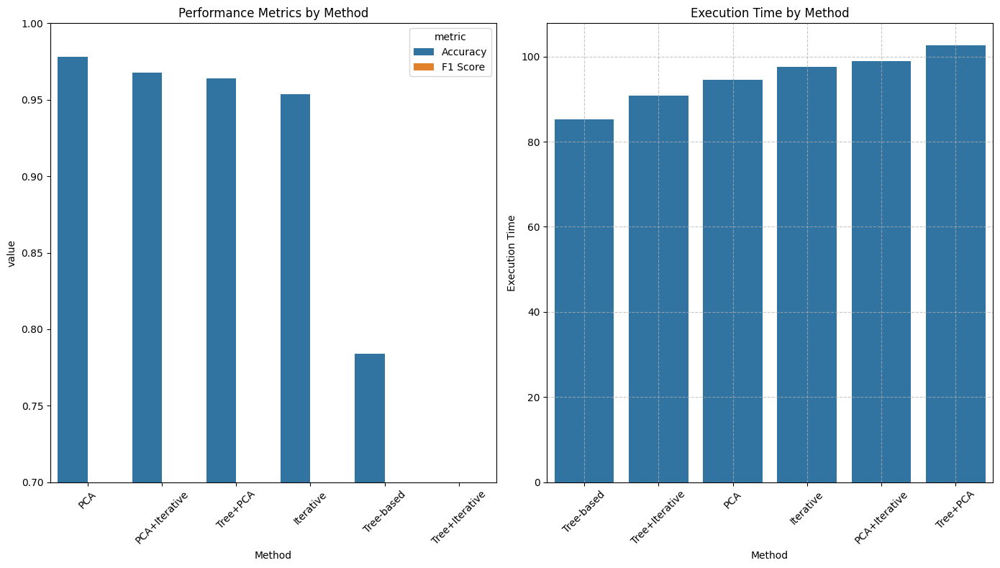

In [ ]:
# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Display results table
print("\nPerformance Comparison of Dimensionality Reduction Methods:")
print(results_df)

# Plot results
plt.figure(figsize=(14, 8))

# Plot 1: Accuracy and F1 Score
plt.subplot(1, 2, 1)
results_plot = results_df.sort_values('Accuracy', ascending=False)
sns.barplot(x='Method', y='value', hue='metric',
            data=pd.melt(results_plot, id_vars=['Method'],
                         value_vars=['Accuracy', 'F1 Score'],
                         var_name='metric', value_name='value'))
plt.title('Performance Metrics by Method')
plt.ylim(0.7, 1.0)  # Adjust as needed for your data
plt.xticks(rotation=45)

# Plot 2: Execution Time
plt.subplot(1, 2, 2)
sns.barplot(x='Method', y='Execution Time', data=results_df.sort_values('Execution Time'))
plt.title('Execution Time by Method')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('dimensionality_reduction_comparison.png')
plt.show()



Best method based on accuracy: PCA


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


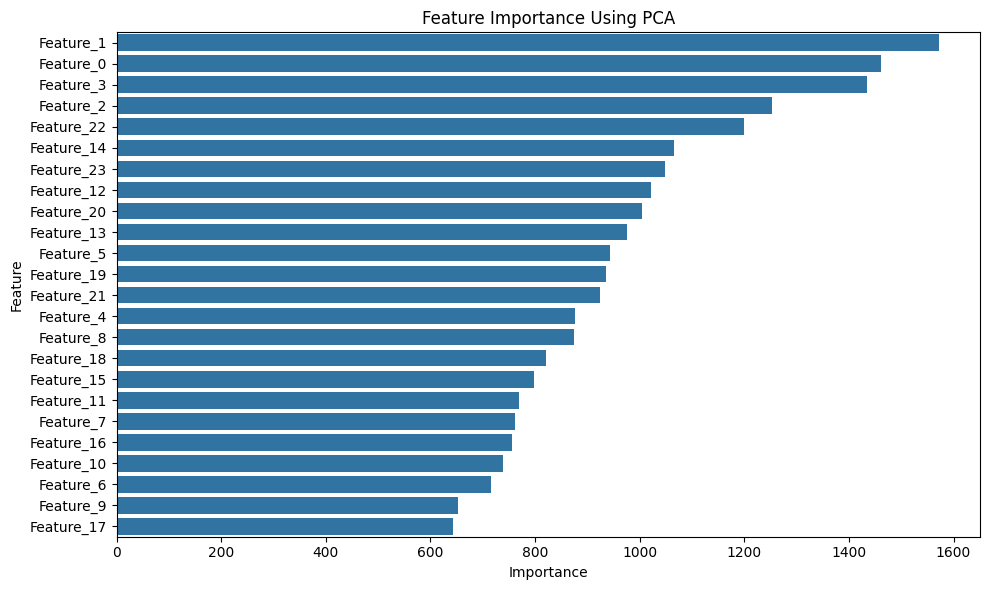

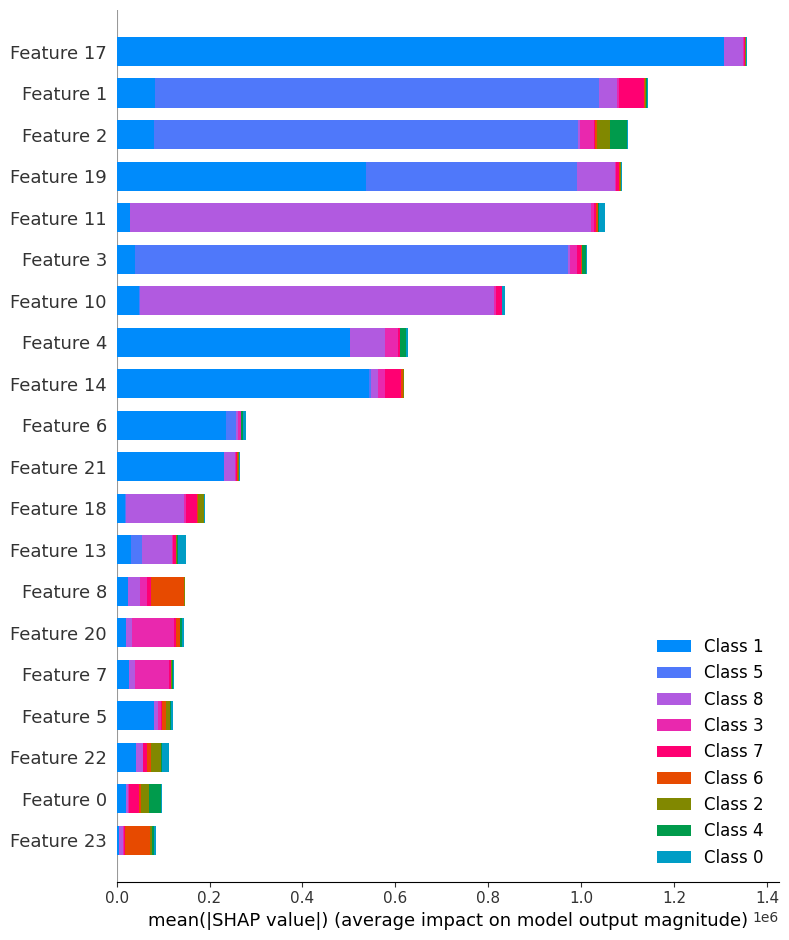

<Figure size 640x480 with 0 Axes>

In [ ]:
# Find the best method
best_method_idx = results_df['Accuracy'].idxmax()
best_method = results_df.loc[best_method_idx, 'Method']
print(f"\nBest method based on accuracy: {best_method}")

# Apply the best method to prepare final dataset
# This function will determine and apply the best method
def apply_best_method(best_method, X_train_scaled, X_test_scaled, y_train):
    if best_method == "Tree-based":
        return tree_based_selection(X_train_scaled, X_test_scaled)
    elif best_method == "PCA":
        X_reduced, X_test_reduced, _ = pca_reduction(X_train_scaled, X_test_scaled)
        return X_reduced, X_test_reduced, None
    elif best_method == "UMAP":
        X_reduced, X_test_reduced = umap_reduction(X_train_scaled, X_test_scaled)
        return X_reduced, X_test_reduced, None
    elif best_method == "Iterative":
        X_reduced, X_test_reduced = iterative_selection(X_train_scaled, X_test_scaled, y_train)
        return X_reduced, X_test_reduced, None
    elif best_method == "Tree+PCA":
        X_tree, X_test_tree, _ = tree_based_selection(X_train_scaled, X_test_scaled, n_features=HYBRID_FIRST_STAGE)
        X_reduced, X_test_reduced, _ = pca_reduction(X_tree, X_test_tree)
        return X_reduced, X_test_reduced, None
    elif best_method == "Tree+UMAP":
        X_tree, X_test_tree, _ = tree_based_selection(X_train_scaled, X_test_scaled, n_features=HYBRID_FIRST_STAGE)
        X_reduced, X_test_reduced = umap_reduction(X_tree, X_test_tree)
        return X_reduced, X_test_reduced, None
    elif best_method == "PCA+Iterative":
        X_pca, X_test_pca, _ = pca_reduction(X_train_scaled, X_test_scaled, n_components=HYBRID_FIRST_STAGE)
        X_reduced, X_test_reduced = iterative_selection(X_pca, X_test_pca, y_train)
        return X_reduced, X_test_reduced, None
    elif best_method == "Tree+Iterative":
        X_tree, X_test_tree, _ = tree_based_selection(X_train_scaled, X_test_scaled, n_features=HYBRID_FIRST_STAGE)
        X_reduced, X_test_reduced = iterative_selection(X_tree, X_test_tree, y_train)
        return X_reduced, X_test_reduced, None
    else:
        # Default to Tree-based as fallback
        return tree_based_selection(X_train_scaled, X_test_scaled)

# Get the best reduced dataset
X_train_best, X_test_best, _ = apply_best_method(best_method, X_train_scaled, X_test_scaled, y_train)

# Verify we have exactly MAX_FEATURES
assert X_train_best.shape[1] == MAX_FEATURES, f"Expected {MAX_FEATURES} features, got {X_train_best.shape[1]}"

# Save reduced datasets
final_train = pd.DataFrame(X_train_best, columns=[f'feature_{i}' for i in range(MAX_FEATURES)])
final_train['target'] = y_train.values
final_test = pd.DataFrame(X_test_best, columns=[f'feature_{i}' for i in range(MAX_FEATURES)])
final_test['target'] = y_test.values

final_train.to_csv('reduced_train_data.csv', index=False)
final_test.to_csv('reduced_test_data.csv', index=False)

# Visualize feature importance for the best model
# Train a model on the best reduced dataset
final_model = LGBMClassifier(random_state=42)
final_model.fit(X_train_best, y_train)

# Plot feature importance
plt.figure(figsize=(10, 6))
feature_imp = pd.DataFrame({
    'Feature': [f'Feature_{i}' for i in range(X_train_best.shape[1])],
    'Importance': final_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

sns.barplot(x='Importance', y='Feature', data=feature_imp)
plt.title(f'Feature Importance Using {best_method}')
plt.tight_layout()
plt.savefig('feature_importance.png')
plt.show()

# Optional: SHAP analysis
explainer = shap.TreeExplainer(final_model)
shap_values = explainer.shap_values(X_test_best)

plt.figure(figsize=(12, 8))
shap.summary_plot(shap_values, X_test_best, plot_type="bar")
plt.savefig('shap_summary.png')
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(



Binary Classification Performance with PCA:
Accuracy: 1.0000
F1 Score: 1.0000


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


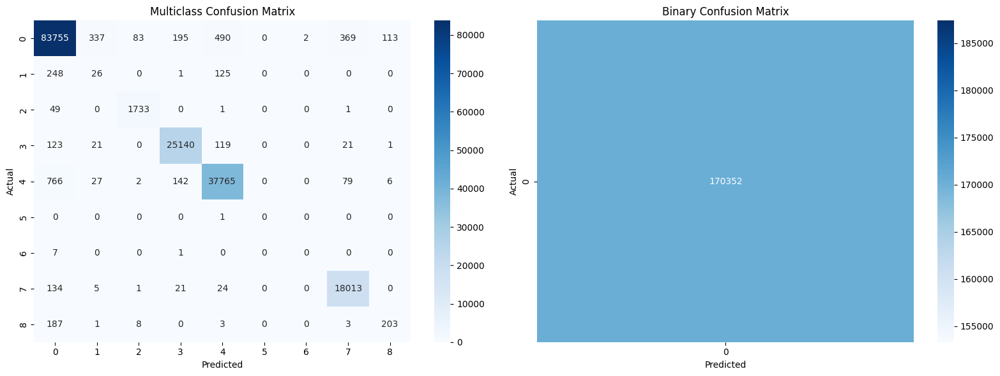

Analysis complete! All methods constrained to 24 features.
Hybrid methods used 48 features in first stage, reduced to 24 in second stage.
Results saved to disk.


In [ ]:

# Compare with binary classification
# Apply the same best method to binary classification
X_train_bin_best, X_test_bin_best, _ = apply_best_method(best_method, X_train_scaled, X_test_scaled, y_train_bin)

# Train binary classifier
binary_model = LGBMClassifier(random_state=42)
binary_model.fit(X_train_bin_best, y_train_bin)
y_bin_pred = binary_model.predict(X_test_bin_best)

# Calculate metrics
bin_accuracy = accuracy_score(y_test_bin, y_bin_pred)
bin_f1 = f1_score(y_test_bin, y_bin_pred)

print(f"\nBinary Classification Performance with {best_method}:")
print(f"Accuracy: {bin_accuracy:.4f}")
print(f"F1 Score: {bin_f1:.4f}")

# Create confusion matrix for both problems
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Multiclass confusion matrix
cm_multi = confusion_matrix(y_test, final_model.predict(X_test_best))
sns.heatmap(cm_multi, annot=True, fmt='d', cmap='Blues', ax=axes[0])
axes[0].set_title('Multiclass Confusion Matrix')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('Actual')

# Binary confusion matrix
cm_bin = confusion_matrix(y_test_bin, y_bin_pred)
sns.heatmap(cm_bin, annot=True, fmt='d', cmap='Blues', ax=axes[1])
axes[1].set_title('Binary Confusion Matrix')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('Actual')

plt.tight_layout()
plt.savefig('confusion_matrices.png')
plt.show()

print(f"Analysis complete! All methods constrained to {MAX_FEATURES} features.")
print(f"Hybrid methods used {HYBRID_FIRST_STAGE} features in first stage, reduced to {MAX_FEATURES} in second stage.")
print(f"Results saved to disk.")

In [ ]:
final_train.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,target
0,10.218775,-0.241448,-0.524862,0.010242,-1.590065,-1.343531,0.022793,0.648473,3.491106,1.616833,...,1.061372,-0.033691,0.231840,-1.781717,0.211425,-0.031236,-1.481812,0.081322,1.350843,DoS
1,-2.762571,-0.045556,0.673492,-0.396922,1.877430,0.325771,-0.012449,-0.428445,0.358085,-0.796005,...,-0.346951,0.020623,-0.039965,-1.033269,0.218834,-0.846503,-0.373115,-0.370780,0.529007,BENIGN
2,0.244149,0.137023,1.759422,1.165392,-1.524765,1.100849,0.132014,0.092333,1.592850,-1.637295,...,-0.360733,-0.026704,0.560676,0.647416,-0.187024,0.507892,0.285633,-0.848999,-0.899405,BENIGN
3,-2.850488,-0.039615,0.409221,-0.331029,-0.779092,-0.917405,-0.109257,-0.746221,-0.567973,1.064830,...,0.048243,-0.006087,0.097049,0.020559,0.035567,-0.007738,-0.041182,0.213135,0.035279,BENIGN
4,-2.843446,-0.046425,0.413681,-0.340168,-1.054854,-1.192910,-0.141913,-0.924251,-0.953612,1.429866,...,0.074820,-0.010289,0.178460,-0.116586,-0.118561,0.094727,-0.196246,0.121757,-0.412826,BENIGN


In [ ]:
final_train.to_csv('/content/drive/MyDrive/CICIDS2017/reduced_train_data.csv', index=False)
final_test.to_csv('/content/drive/MyDrive/CICIDS2017/reduced_test_data.csv', index=False)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 4. Handle Imbalance


In [ ]:
import pandas as pd
# Load the undersampled data
#mount drive
from google.colab import drive
drive.mount('/content/drive')
undersampled_data_path = '/content/drive/MyDrive/CICIDS2017/undersampled_data.csv'
data = pd.read_csv(undersampled_data_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


X = data.drop('Attack Type', axis=1)  # Replace 'target' with your actual target column name
y = data['Attack Type']

# Split data first to avoid data leakage
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    stratify=y,
    random_state=42
)

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Tree-based feature selection
NUM_FEATURES = 50  # Number of features to select
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_scaled, y_train)

selector = SelectFromModel(rf, max_features=NUM_FEATURES, prefit=True)
X_train_selected = selector.transform(X_train_scaled)
X_test_selected = selector.transform(X_test_scaled)

# PCA transformation
PCA_COMPONENTS = 24  # Final number of components
pca = PCA(n_components=PCA_COMPONENTS)
X_train_pca = pca.fit_transform(X_train_selected)
X_test_pca = pca.transform(X_test_selected)

# Create DataFrames with proper column names
train_df = pd.DataFrame(X_train_pca, columns=[f'PC_{i+1}' for i in range(PCA_COMPONENTS)])
test_df = pd.DataFrame(X_test_pca, columns=[f'PC_{i+1}' for i in range(PCA_COMPONENTS)])

# Add target column
train_df['target'] = y_train.reset_index(drop=True)
test_df['target'] = y_test.reset_index(drop=True)

# Save to Google Drive
train_path = '/content/drive/MyDrive/CICIDS2017/reduced_train_data.csv'
test_path = '/content/drive/MyDrive/CICIDS2017/reduced_test_data.csv'

train_df.to_csv(train_path, index=False)
test_df.to_csv(test_path, index=False)

print(f"Datasets saved successfully:\n- {train_path}\n- {test_path}")
print(f"Training set shape: {train_df.shape}")
print(f"Test set shape: {test_df.shape}")

Datasets saved successfully:
- /content/drive/MyDrive/CICIDS2017/reduced_train_data.csv
- /content/drive/MyDrive/CICIDS2017/reduced_test_data.csv
Training set shape: (681404, 25)
Test set shape: (170352, 25)


In [ ]:
X_train= train_df

In [ ]:
X_test= test_df

In [ ]:
train_counts = X_train['target'].value_counts()
test_counts = X_test['target'].value_counts()

print("Train Class Counts:")
print(train_counts)

print("\nTest Class Counts:")
test_counts


Train Class Counts:
target
BENIGN          340702
DoS             154998
DDoS            102413
Port Scan        72655
Brute Force       7322
Web Attack        1714
Bot               1562
Infiltration        29
Heartbleed           9
Name: count, dtype: int64

Test Class Counts:


,count
target,
BENIGN,85176
DoS,38750
DDoS,25603
Port Scan,18164
Brute Force,1830
Web Attack,429
Bot,391
Infiltration,7
Heartbleed,2


## Handling Imbalancing

In [ ]:
!pip install -U imbalanced-learn

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Original Class Distribution:
0    340702
4    154998
3    102413
7     72655
2      7322
8      1714
1      1562
6        29
5         9
Name: count, dtype: int64

=== Processing SMOTE ===

=== Processing Custom ===

=== Processing SMOTETomek ===

=== Final Comparison ===
            Accuracy  Macro_F1    Time (s)
Method                                    
SMOTE       0.995914  0.879123  193.699717
SMOTETomek  0.995914  0.879123  210.047118
Custom      0.995709  0.867483  217.087933


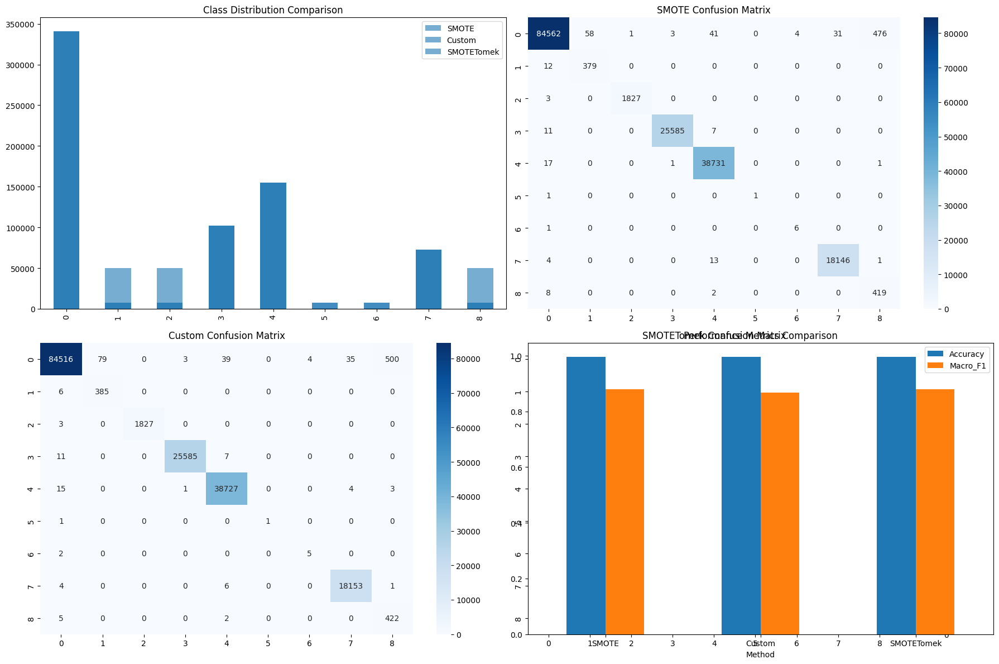


Best dataset saved as 'best_resampled_data.csv'


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE, RandomOverSampler  # Added missing import
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
from imblearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score
from sklearn.cluster import KMeans
from google.colab import drive
import seaborn as sns
import time

# Mount Google Drive
drive.mount('/content/drive')

# Load data
train_path = '/content/drive/MyDrive/CICIDS2017/reduced_train_data.csv'
X_train = pd.read_csv(train_path)
y_train = X_train['target']
X_train = X_train.drop('target', axis=1)

# Encode labels
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)

# Define minority classes
class_counts = pd.Series(y_train_encoded).value_counts()
minority_classes = class_counts[class_counts < 50000].index.tolist()
majority_classes = class_counts[class_counts >= 50000].index.tolist()

print("Original Class Distribution:")
print(class_counts)

# Split data
minority_mask = np.isin(y_train_encoded, minority_classes)
X_min = X_train[minority_mask]
y_min = y_train_encoded[minority_mask]
X_maj = X_train[~minority_mask]
y_maj = y_train_encoded[~minority_mask]

# Custom resampler for tiny classes - fixing potential shape issues
def custom_resampler(X, y):
    # Convert inputs to numpy arrays if they aren't already
    X = np.array(X)
    y = np.array(y)

    # Separate tiny and moderate classes
    class_counts = pd.Series(y).value_counts()
    tiny_classes = class_counts[class_counts < 100].index.tolist()
    moderate_classes = [c for c in minority_classes if c not in tiny_classes]

    # Initialize result containers
    X_resampled_parts = []
    y_resampled_parts = []

    # Process tiny classes with RandomOverSampler
    if tiny_classes:
        tiny_mask = np.isin(y, tiny_classes)
        if np.any(tiny_mask):
            try:
                ros = RandomOverSampler(sampling_strategy={c:1000 for c in tiny_classes}, random_state=42)
                X_tiny, y_tiny = ros.fit_resample(X[tiny_mask], y[tiny_mask])
                X_resampled_parts.append(X_tiny)
                y_resampled_parts.append(y_tiny)
            except Exception as e:
                print(f"Warning: RandomOverSampler failed on tiny classes: {e}")

    # Process moderate classes with SMOTE
    if moderate_classes:
        moderate_mask = np.isin(y, moderate_classes)
        if np.any(moderate_mask):
            try:
                # Adjust k_neighbors for small classes if needed
                min_samples = min([class_counts[c] for c in moderate_classes])
                k_neighbors = min(5, min_samples-1) if min_samples > 1 else 1

                sm = SMOTE(
                    sampling_strategy={c:50000 for c in moderate_classes},
                    random_state=42,
                    k_neighbors=k_neighbors
                )
                X_mod, y_mod = sm.fit_resample(X[moderate_mask], y[moderate_mask])
                X_resampled_parts.append(X_mod)
                y_resampled_parts.append(y_mod)
            except Exception as e:
                print(f"Warning: SMOTE failed on moderate classes: {e}")

    # Combine results if we have any resampled parts
    if X_resampled_parts:
        return np.vstack(X_resampled_parts), np.hstack(y_resampled_parts)

    # Return original data if resampling failed completely
    return X, y

# Define resampling strategies
strategies = {
    'SMOTE': SMOTE(sampling_strategy='auto', random_state=42),
    'Custom': custom_resampler,
    'SMOTETomek': SMOTETomek(sampling_strategy='auto', random_state=42)
}

# Prepare test set
X_test = pd.read_csv('/content/drive/MyDrive/CICIDS2017/reduced_test_data.csv')
y_test = le.transform(X_test['target'])
X_test = X_test.drop('target', axis=1)

# Results storage
results = []
confusion_matrices = {}
class_distributions = {}

for name, sampler in strategies.items():
    print(f"\n=== Processing {name} ===")
    start_time = time.time()

    try:
        # Apply resampling
        if name == 'Custom':
            X_min_res, y_min_res = custom_resampler(X_min.values, y_min)  # Fixed function call
        else:
            X_min_res, y_min_res = sampler.fit_resample(X_min.values, y_min)

        # Combine with majority classes
        X_full = np.vstack([X_maj.values, X_min_res])
        y_full = np.hstack([y_maj, y_min_res])

        # Track processing time
        resample_time = time.time() - start_time
        train_start_time = time.time()

        # Train XGBoost
        model = XGBClassifier(
            n_estimators=200,
            max_depth=6,
            learning_rate=0.1,
            objective='multi:softprob',
            random_state=42
        )
        model.fit(X_full, y_full)

        # Calculate training time properly
        train_time = time.time() - train_start_time
        total_time = resample_time + train_time

        # Predict and evaluate
        y_pred = model.predict(X_test.values)

        # Store metrics
        results.append({
            'Method': name,
            'Accuracy': accuracy_score(y_test, y_pred),
            'Macro_F1': f1_score(y_test, y_pred, average='macro'),
            'Time (s)': total_time
        })

        # Store confusion matrix
        confusion_matrices[name] = confusion_matrix(y_test, y_pred)

        # Store class distribution
        class_distributions[name] = pd.Series(y_full).value_counts()

        # Save best dataset (custom method)
        if name == 'Custom':
            resampled_df = pd.DataFrame(X_full, columns=X_train.columns)
            resampled_df['target'] = le.inverse_transform(y_full)
            resampled_df.to_csv('/content/drive/MyDrive/CICIDS2017/best_resampled_data.csv', index=False)

    except Exception as e:
        print(f"Failed on {name}: {str(e)}")
        continue

# Generate comparison report
results_df = pd.DataFrame(results).set_index('Method')
print("\n=== Final Comparison ===")
print(results_df.sort_values('Macro_F1', ascending=False))

# Visualization
plt.figure(figsize=(18, 12))

# 1. Class distribution comparison
plt.subplot(2, 2, 1)
for name, dist in class_distributions.items():
    dist.sort_index().plot(kind='bar', alpha=0.6, label=name)
plt.title('Class Distribution Comparison')
plt.legend()

# 2. Confusion matrices
for idx, (name, cm) in enumerate(confusion_matrices.items(), 2):
    if idx <= 4:  # Ensure we only plot up to 3 confusion matrices (positions 2, 3, 4)
        plt.subplot(2, 2, idx)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f'{name} Confusion Matrix')

# 3. Performance metrics
plt.subplot(2, 2, 4)
results_df.plot(kind='bar', y=['Accuracy', 'Macro_F1'], ax=plt.gca())
plt.title('Performance Metrics Comparison')
plt.xticks(rotation=0)

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/CICIDS2017/resampling_comparison.png', dpi=300)
plt.show()

print("\nBest dataset saved as 'best_resampled_data.csv'")

In [ ]:
import numpy as np
import pandas as pd
from sklearn.mixture import GaussianMixture
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from sklearn.cluster import KMeans

def custom_resampler(X, y):
    X = np.array(X)
    y = np.array(y)

    class_counts = pd.Series(y).value_counts().sort_index()
    print("Processing classes with counts:", class_counts)

    X_resampled = X.copy()
    y_resampled = y.copy()

    # 1. Enhanced Extremely Rare Class Handling (<30 samples)
    extremely_rare = class_counts[class_counts < 30].index.tolist()
    if extremely_rare:
        print(f"\nProcessing critical rare classes: {extremely_rare}")
        for rare_class in extremely_rare:
            class_mask = (y == rare_class)
            if class_mask.sum() > 0:
                X_class = X[class_mask]

                # Conservative oversampling with validation
                n_samples = min(3000, 300 * len(X_class))
                indices = np.random.choice(len(X_class), n_samples, replace=True)
                X_oversampled = X_class[indices]

                # Add validated noise
                noise_scale = np.std(X_class, axis=0) * 0.03
                noise = np.random.normal(0, noise_scale, X_oversampled.shape)
                X_oversampled = np.clip(X_oversampled + noise,
                                      X_class.min(axis=0),
                                      X_class.max(axis=0))

                X_resampled = np.vstack([X_resampled, X_oversampled])
                y_resampled = np.hstack([y_resampled, np.full(n_samples, rare_class)])
                print(f"  Class {rare_class}: {class_mask.sum()} → {n_samples}")

    # 2. Optimized Rare Class Handling (30-2000 samples)
    very_rare = class_counts[(class_counts >= 30) & (class_counts < 2000)].index.tolist()
    if very_rare:
        print(f"\nProcessing rare classes: {very_rare}")
        for rare_class in very_rare:
            class_mask = (y == rare_class)
            if class_mask.sum() > 0:
                X_class = X[class_mask]
                y_class = y[class_mask]

                # Get samples from another class for SMOTE
                other_classes = [c for c in class_counts.index if c != rare_class]
                if other_classes:
                    other_class = other_classes[0]
                    other_mask = (y == other_class)
                    X_other = X[other_mask][:10]  # Take 10 samples from another class
                    y_other = y[other_mask][:10]

                    # Combine with rare class samples
                    X_combined = np.vstack([X_class, X_other])
                    y_combined = np.hstack([y_class, y_other])

                    try:
                        # Safe SMOTE with validation
                        target_count = min(50000, 30 * len(X_class))
                        sm = SMOTE(sampling_strategy={rare_class: target_count},
                                  k_neighbors=min(5, len(X_class)-1),
                                  random_state=42)
                        X_res, y_res = sm.fit_resample(X_combined, y_combined)

                        # Filter only the target class
                        target_mask = (y_res == rare_class)
                        X_filtered = X_res[target_mask]
                        y_filtered = y_res[target_mask]

                        # Validate synthetic samples
                        std_dev = np.std(X_class, axis=0)
                        valid_mask = np.all(np.abs(X_filtered - X_class.mean(axis=0)) < 3*std_dev, axis=1)

                        X_resampled = np.vstack([X_resampled, X_filtered[valid_mask]])
                        y_resampled = np.hstack([y_resampled, y_filtered[valid_mask]])
                        print(f"  Class {rare_class}: {len(X_class)} → {sum(valid_mask)} (validated SMOTE)")

                    except Exception as e:
                        print(f"  SMOTE failed: {str(e)}")
                        # Fallback to Gaussian augmentation
                        try:
                            gmm = GaussianMixture(n_components=min(3, len(X_class)), random_state=42)
                            gmm.fit(X_class)
                            X_synthetic = gmm.sample(n_samples=min(50000, 30 * len(X_class)))[0]
                            X_resampled = np.vstack([X_resampled, X_synthetic])
                            y_resampled = np.hstack([y_resampled, np.full(len(X_synthetic), rare_class)])
                            print(f"  Class {rare_class}: {len(X_class)} → {len(X_synthetic)} (GMM)")
                        except Exception as gmm_error:
                            print(f"  GMM failed: {str(gmm_error)}")
                            # Final fallback to simple oversampling
                            indices = np.random.choice(len(X_class), size=min(50000, 30 * len(X_class)), replace=True)
                            X_resampled = np.vstack([X_resampled, X_class[indices]])
                            y_resampled = np.hstack([y_resampled, np.full(len(indices), rare_class)])
                            print(f"  Class {rare_class}: {len(X_class)} → {len(indices)} (random oversampling)")

    # 3. Post-processing: Clean samples
    try:
        print("\nApplying final cleaning...")
        tl = TomekLinks(sampling_strategy='majority')
        X_resampled, y_resampled = tl.fit_resample(X_resampled, y_resampled)
        print("TomekLinks cleaning successful")
    except Exception as e:
        print(f"\nTomekLinks cleaning failed: {str(e)}")

    print(f"\nFinal class distribution: {pd.Series(y_resampled).value_counts().sort_index()}")
    return X_resampled, y_resampled

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Original Class Distribution:
0    340702
4    154998
3    102413
7     72655
2      7322
8      1714
1      1562
6        29
5         9
Name: count, dtype: int64

=== Processing SMOTE ===

=== Processing Custom ===
Processing classes with counts: 1    1562
2    7322
5       9
6      29
8    1714
Name: count, dtype: int64

Processing critical rare classes: [5, 6]
  Class 5: 9 → 2700
  Class 6: 29 → 3000

Processing rare classes: [1, 8]
  Class 1: 1562 → 45835 (validated SMOTE)
  Class 8: 1714 → 43943 (validated SMOTE)

Applying final cleaning...
TomekLinks cleaning successful

Final class distribution: 1    47397
2     7322
5     2709
6     3029
8    45657
Name: count, dtype: int64

=== Processing SMOTETomek ===

=== Final Comparison ===
            Accuracy  Macro_F1    Time (s)
Method                                    
Custom      0.995985  0.890375  303.9

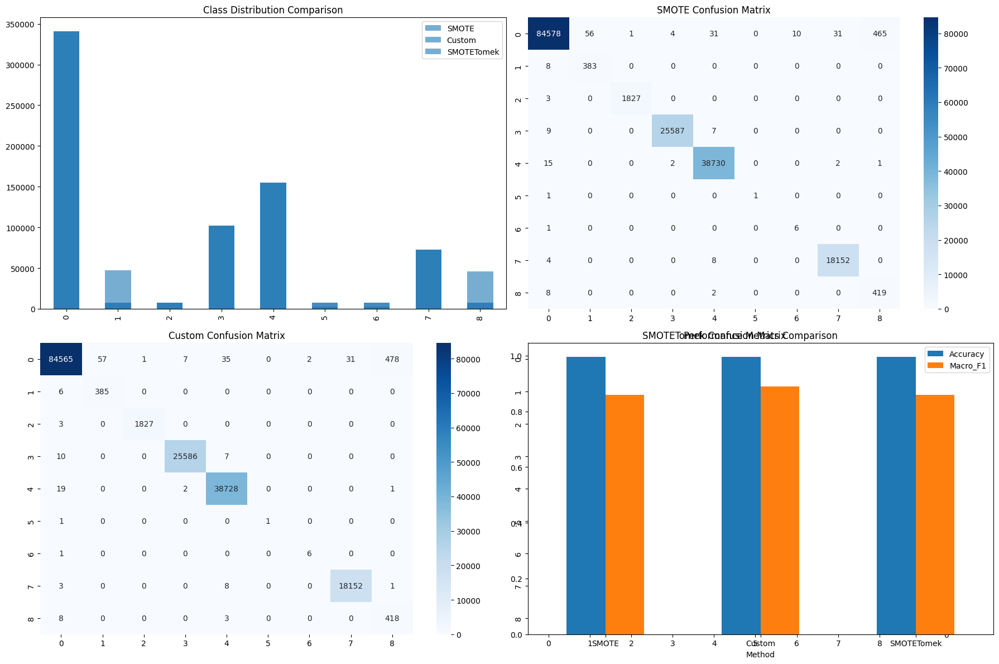


Best dataset saved as 'best_resampled_data.csv'


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE, RandomOverSampler  # Added missing import
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
from imblearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score
from sklearn.cluster import KMeans
from google.colab import drive
import seaborn as sns
import time

# Mount Google Drive
drive.mount('/content/drive')

# Load data
train_path = '/content/drive/MyDrive/CICIDS2017/reduced_train_data.csv'
X_train = pd.read_csv(train_path)
y_train = X_train['target']
X_train = X_train.drop('target', axis=1)

# Encode labels
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)

# Define minority classes
class_counts = pd.Series(y_train_encoded).value_counts()
minority_classes = class_counts[class_counts < 50000].index.tolist()
majority_classes = class_counts[class_counts >= 50000].index.tolist()

print("Original Class Distribution:")
print(class_counts)

# Split data
minority_mask = np.isin(y_train_encoded, minority_classes)
X_min = X_train[minority_mask]
y_min = y_train_encoded[minority_mask]
X_maj = X_train[~minority_mask]
y_maj = y_train_encoded[~minority_mask]


# Define resampling strategies
strategies = {
    'SMOTE': SMOTE(sampling_strategy='auto', random_state=42),
    'Custom': custom_resampler,
    'SMOTETomek': SMOTETomek(sampling_strategy='auto', random_state=42)
}

# Prepare test set
X_test = pd.read_csv('/content/drive/MyDrive/CICIDS2017/reduced_test_data.csv')
y_test = le.transform(X_test['target'])
X_test = X_test.drop('target', axis=1)

# Results storage
results = []
confusion_matrices = {}
class_distributions = {}

for name, sampler in strategies.items():
    print(f"\n=== Processing {name} ===")
    start_time = time.time()

    try:
        # Apply resampling
        if name == 'Custom':
            X_min_res, y_min_res = custom_resampler(X_min.values, y_min)  # Fixed function call
        else:
            X_min_res, y_min_res = sampler.fit_resample(X_min.values, y_min)

        # Combine with majority classes
        X_full = np.vstack([X_maj.values, X_min_res])
        y_full = np.hstack([y_maj, y_min_res])

        # Track processing time
        resample_time = time.time() - start_time
        train_start_time = time.time()

        # Train XGBoost
        model = XGBClassifier(
            n_estimators=200,
            max_depth=10,
            learning_rate=0.1,
            objective='multi:softprob',
            random_state=42
        )
        model.fit(X_full, y_full)

        # Calculate training time properly
        train_time = time.time() - train_start_time
        total_time = resample_time + train_time

        # Predict and evaluate
        y_pred = model.predict(X_test.values)

        # Store metrics
        results.append({
            'Method': name,
            'Accuracy': accuracy_score(y_test, y_pred),
            'Macro_F1': f1_score(y_test, y_pred, average='macro'),
            'Time (s)': total_time
        })

        # Store confusion matrix
        confusion_matrices[name] = confusion_matrix(y_test, y_pred)

        # Store class distribution
        class_distributions[name] = pd.Series(y_full).value_counts()

        # Save best dataset (custom method)
        if name == 'Custom':
            resampled_df = pd.DataFrame(X_full, columns=X_train.columns)
            resampled_df['target'] = le.inverse_transform(y_full)
            resampled_df.to_csv('/content/drive/MyDrive/CICIDS2017/best_resampled_data.csv', index=False)

    except Exception as e:
        print(f"Failed on {name}: {str(e)}")
        continue

# Generate comparison report
results_df = pd.DataFrame(results).set_index('Method')
print("\n=== Final Comparison ===")
print(results_df.sort_values('Macro_F1', ascending=False))

# Visualization
plt.figure(figsize=(18, 12))

# 1. Class distribution comparison
plt.subplot(2, 2, 1)
for name, dist in class_distributions.items():
    dist.sort_index().plot(kind='bar', alpha=0.6, label=name)
plt.title('Class Distribution Comparison')
plt.legend()

# 2. Confusion matrices
for idx, (name, cm) in enumerate(confusion_matrices.items(), 2):
    if idx <= 4:  # Ensure we only plot up to 3 confusion matrices (positions 2, 3, 4)
        plt.subplot(2, 2, idx)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f'{name} Confusion Matrix')

# 3. Performance metrics
plt.subplot(2, 2, 4)
results_df.plot(kind='bar', y=['Accuracy', 'Macro_F1'], ax=plt.gca())
plt.title('Performance Metrics Comparison')
plt.xticks(rotation=0)

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/CICIDS2017/resampling_comparison.png', dpi=300)
plt.show()

print("\nBest dataset saved as 'best_resampled_data.csv'")

# 5. Mulit-Stage Classification

## Test-1

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Class mapping: {0: 'BENIGN', 1: 'Bot', 2: 'Brute Force', 3: 'DDoS', 4: 'DoS', 5: 'Heartbleed', 6: 'Infiltration', 7: 'Port Scan', 8: 'Web Attack'}
BENIGN class index: 0

Training LGB...

LGB Results:
              precision    recall  f1-score   support

      BENIGN       0.88      0.70      0.78     85176
         Bot       0.01      0.31      0.02       391
 Brute Force       0.02      0.06      0.03      1830
        DDoS       0.70      0.64      0.67     25603
         DoS       0.71      0.54      0.61     38750
  Heartbleed       0.00      0.00      0.00         2
Infiltration       0.00      0.43      0.00         7
   Port Scan       0.75      0.85      0.79     18164
  Web Attack       0.00      0.00      0.00       429

    accuracy                           0.66    170352
   macro avg       0.34      0.39      0.32    170352
weighted avg       0.

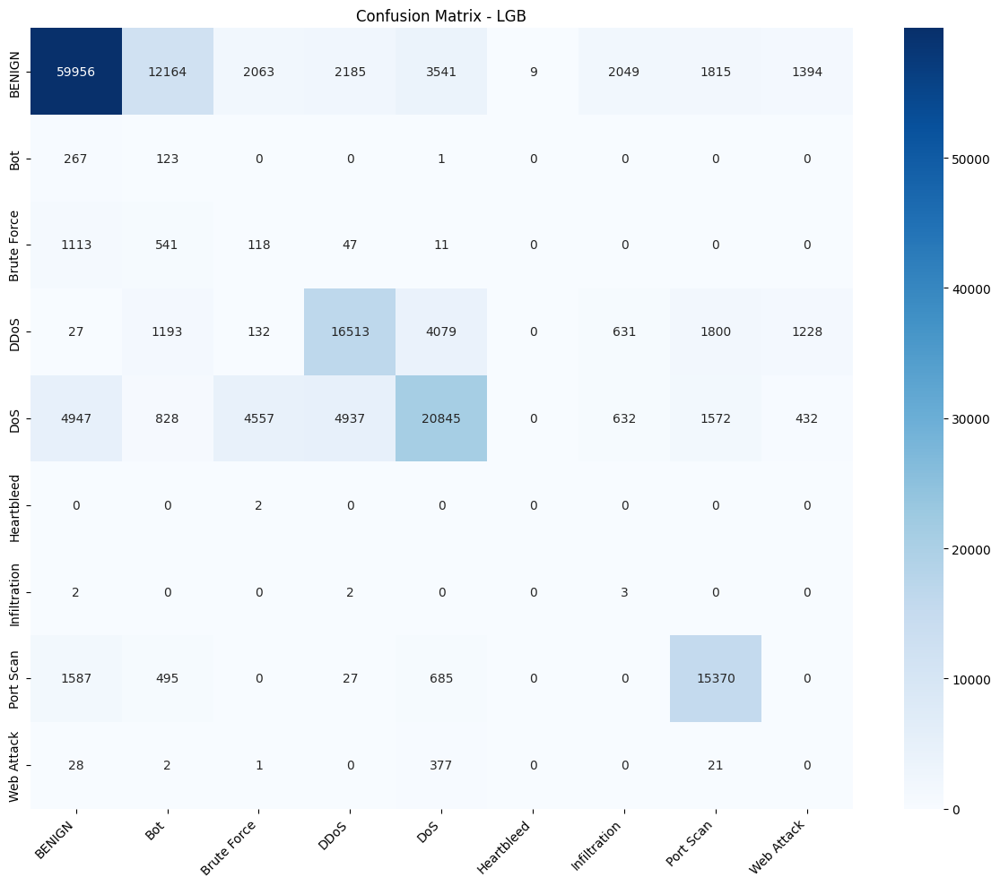


Training CAT...

CAT Results:
              precision    recall  f1-score   support

      BENIGN       1.00      0.99      1.00     85176
         Bot       0.75      0.99      0.85       391
 Brute Force       1.00      1.00      1.00      1830
        DDoS       1.00      1.00      1.00     25603
         DoS       1.00      1.00      1.00     38750
  Heartbleed       0.67      1.00      0.80         2
Infiltration       0.62      0.71      0.67         7
   Port Scan       1.00      1.00      1.00     18164
  Web Attack       0.46      0.98      0.62       429

    accuracy                           0.99    170352
   macro avg       0.83      0.96      0.88    170352
weighted avg       1.00      0.99      1.00    170352



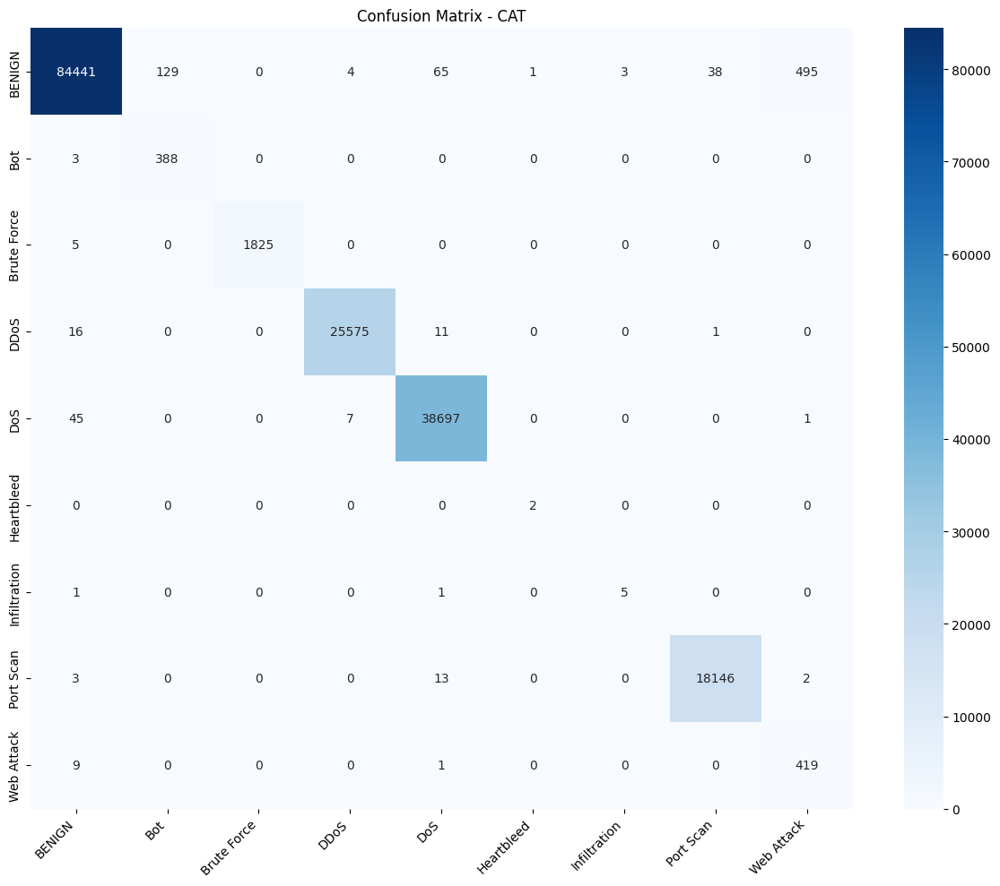


Training XGB...

XGB Results:
              precision    recall  f1-score   support

      BENIGN       1.00      0.99      1.00     85176
         Bot       0.87      0.98      0.92       391
 Brute Force       1.00      1.00      1.00      1830
        DDoS       1.00      1.00      1.00     25603
         DoS       1.00      1.00      1.00     38750
  Heartbleed       1.00      0.50      0.67         2
Infiltration       0.86      0.86      0.86         7
   Port Scan       1.00      1.00      1.00     18164
  Web Attack       0.47      0.98      0.63       429

    accuracy                           1.00    170352
   macro avg       0.91      0.92      0.90    170352
weighted avg       1.00      1.00      1.00    170352



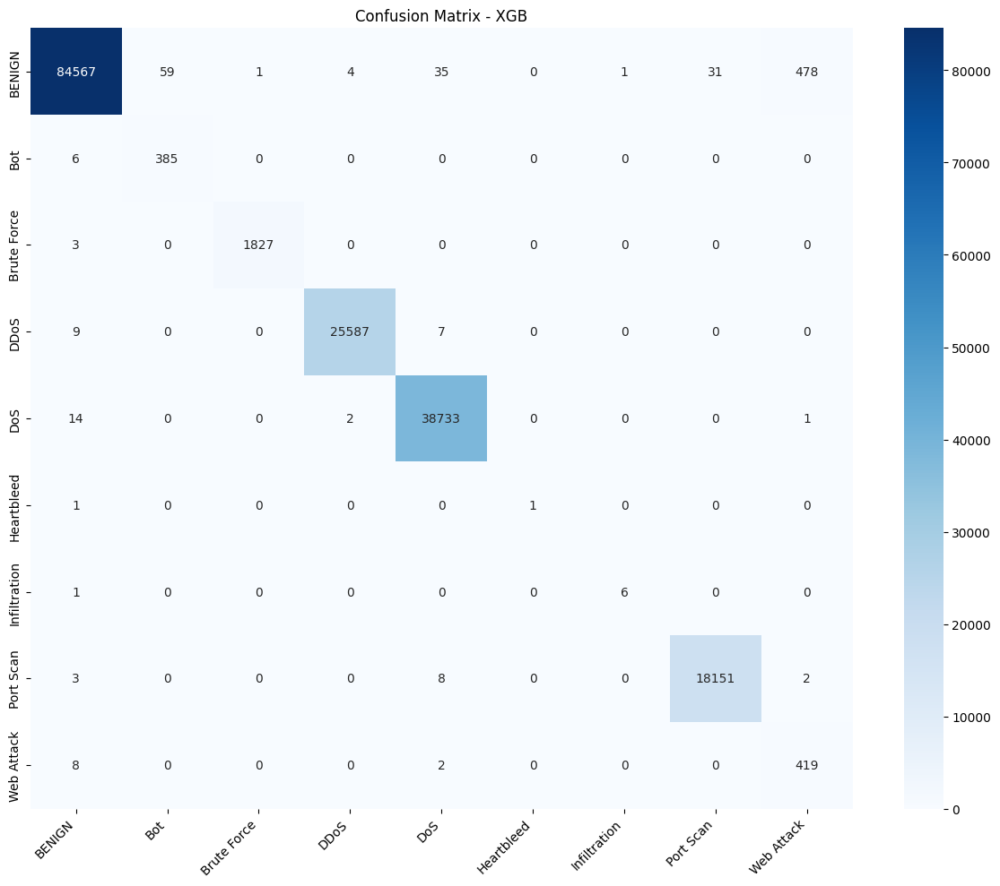


Starting two-stage classification with normal class index: 0

Training Stage 1 Ensemble...
Stage 1 identified 85827 out of 170352 as attacks
Attack classes in training data: ['Bot', 'Brute Force', 'DDoS', 'DoS', 'Heartbleed', 'Infiltration', 'Port Scan', 'Web Attack']

Training Stage 2 Ensemble...

Stage 1 Evaluation (Normal vs Attack):

Stage1 Ensemble Results:
Error in evaluation: Number of classes, 2, does not match size of target_names, 9. Try specifying the labels parameter
Binary classification F1: 0.0000

Two-Stage Final Results:
              precision    recall  f1-score   support

      BENIGN       1.00      0.99      1.00     85176
         Bot       0.77      0.99      0.87       391
 Brute Force       1.00      1.00      1.00      1830
        DDoS       1.00      1.00      1.00     25603
         DoS       1.00      1.00      1.00     38750
  Heartbleed       1.00      1.00      1.00         2
Infiltration       0.67      0.86      0.75         7
   Port Scan       1.00

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(



Two-Stage Stacked Ensemble Final Results:
              precision    recall  f1-score   support

      BENIGN       1.00      0.99      1.00     85176
         Bot       0.77      0.99      0.87       391
 Brute Force       1.00      1.00      1.00      1830
        DDoS       1.00      1.00      1.00     25603
         DoS       1.00      1.00      1.00     38750
  Heartbleed       1.00      1.00      1.00         2
Infiltration       0.75      0.86      0.80         7
   Port Scan       1.00      1.00      1.00     18164
  Web Attack       0.45      0.98      0.62       429

    accuracy                           0.99    170352
   macro avg       0.89      0.98      0.92    170352
weighted avg       1.00      0.99      1.00    170352


=== Model Comparison ===
      Model        F1   Train Time    Pred Time
0       LGB  0.322380   186.194501    22.701933
1       CAT  0.881501   214.533303     0.287923
2       XGB  0.896560   173.457958     4.402643
3    2S-ENS  0.913947   629.352806

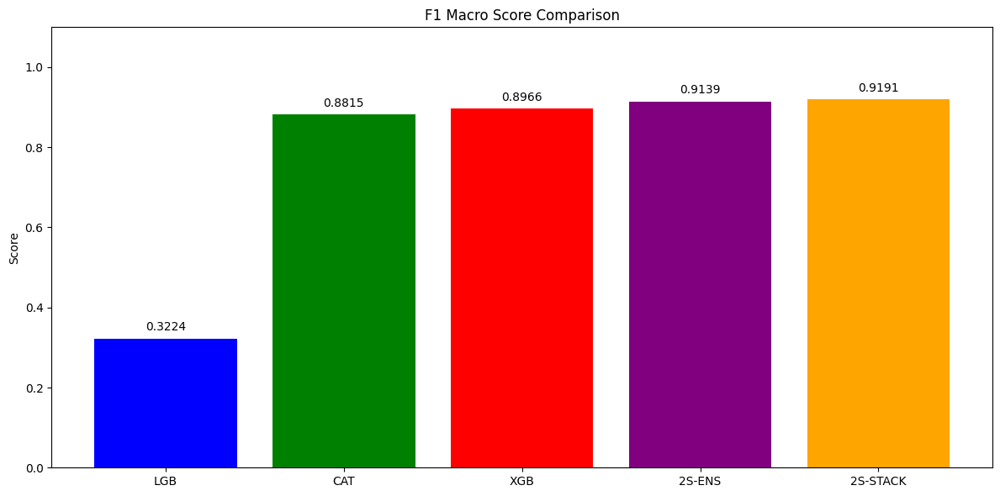

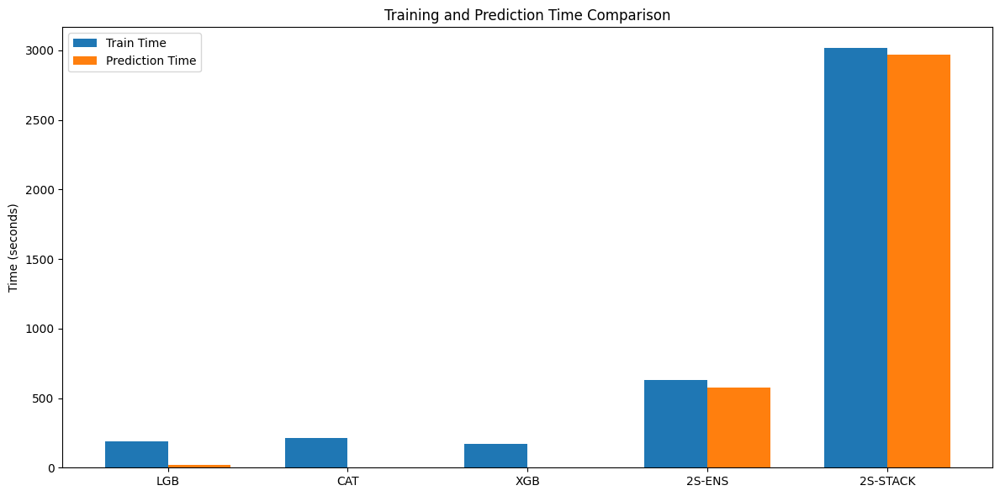

Results saved to drive


In [ ]:
import pandas as pd
import numpy as np
import time
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostClassifier
# Removed FLAML import to avoid the NumPy 2.0 compatibility issue
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load data
try:
    res = pd.read_csv('/content/drive/MyDrive/CICIDS2017/best_resampled_data.csv')
    tst = pd.read_csv('/content/drive/MyDrive/CICIDS2017/reduced_test_data.csv')
except FileNotFoundError:
    print("Check your file paths - unable to locate CSV files")
    # You might want to add alternative paths here

# Prepare data
if 'target' in tst.columns:
    yts = tst['target'].copy()
    Xts = tst.drop('target', axis=1)
else:
    try:
        yts = pd.read_csv('/content/drive/MyDrive/CICIDS2017/test_labels.csv')['target']
        Xts = tst
    except FileNotFoundError:
        print("Test labels file not found")

Xtr = res.drop('target', axis=1)
ytr = res['target'].copy()

# Ensure column consistency between training and test sets
common_cols = list(set(Xtr.columns) & set(Xts.columns))
if len(common_cols) < len(Xtr.columns):
    print(f"Warning: Training has {len(Xtr.columns)} features but only {len(common_cols)} are common with test set")
    Xtr = Xtr[common_cols]
    Xts = Xts[common_cols]

# Handle missing values
Xtr = Xtr.fillna(0)
Xts = Xts.fillna(0)

# Encode labels
le = LabelEncoder()
ytr = le.fit_transform(ytr)
yts = le.transform(yts)
class_mapping = {i: lbl for i, lbl in enumerate(le.classes_)}
print(f"Class mapping: {class_mapping}")

# Ensure BENIGN class exists in the mapping
if 'BENIGN' not in le.classes_:
    print("Warning: 'BENIGN' class not found in data. Using first class as normal traffic.")
    normal_idx = 0
else:
    normal_idx = list(le.classes_).index('BENIGN')
    print(f"BENIGN class index: {normal_idx}")

# Evaluation function
def eval_model(m, X, y, name):
    t0 = time.time()
    try:
        yhat = m.predict(X)
        pt = time.time() - t0

        print(f"\n{name} Results:")
        print(classification_report(y, yhat, target_names=[str(class_mapping[i]) for i in range(len(class_mapping))]))

        cmx = confusion_matrix(y, yhat)
        plt.figure(figsize=(12, 10))
        sns.heatmap(cmx, annot=True, fmt='d', cmap='Blues',
                    xticklabels=[str(class_mapping[i]) for i in range(len(class_mapping))],
                    yticklabels=[str(class_mapping[i]) for i in range(len(class_mapping))])
        plt.title(f'Confusion Matrix - {name}')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

        return f1_score(y, yhat, average='macro'), pt
    except Exception as e:
        print(f"Error in evaluation: {e}")
        return 0, 0

# Initialize results
res_cmp = pd.DataFrame(columns=['Model', 'F1', 'Train Time', 'Pred Time'])

# Single model baselines
models = [
    ('LGB', lgb.LGBMClassifier(n_estimators=150, random_state=42, verbosity=-1)),
    ('CAT', CatBoostClassifier(iterations=150, verbose=0, random_state=42)),
    ('XGB', xgb.XGBClassifier(n_estimators=150, random_state=42, verbosity=0))
]

for i, (name, model) in enumerate(models):
    print(f"\nTraining {name}...")
    t0 = time.time()
    model.fit(Xtr, ytr)
    tt = time.time() - t0

    f1, pt = eval_model(model, Xts, yts, name)
    res_cmp.loc[i] = [name, f1, tt, pt]

# Two-stage ensemble
print(f"\nStarting two-stage classification with normal class index: {normal_idx}")

# Stage 1: Binary classification (normal vs attack)
ytr1 = (ytr != normal_idx).astype(int)
vc1 = VotingClassifier([
    ('lgb', lgb.LGBMClassifier(n_estimators=150, random_state=42, verbosity=-1)),
    ('cat', CatBoostClassifier(iterations=150, verbose=0, random_state=42))
], voting='soft')

print("\nTraining Stage 1 Ensemble...")
t0 = time.time()
vc1.fit(Xtr, ytr1)
t1 = time.time() - t0

# Stage 1 evaluation
yts1 = (yts != normal_idx).astype(int)
bhat = vc1.predict(Xts)
atk_indices = np.where(bhat == 1)[0]
print(f"Stage 1 identified {len(atk_indices)} out of {len(Xts)} as attacks")

if len(atk_indices) == 0:
    print("WARNING: Stage 1 didn't detect any attacks. Two-stage classification may fail.")

# Stage 2: Attack classification
attack_indices = np.where(ytr != normal_idx)[0]
X2, y2 = Xtr.iloc[attack_indices].copy(), ytr[attack_indices].copy()

# Original attack class values (important for mapping back later)
attack_classes = np.unique(ytr[attack_indices])
print(f"Attack classes in training data: {[class_mapping[i] for i in attack_classes]}")

# Map attack classes to sequential IDs starting from 0
atk_class_map = {orig: i for i, orig in enumerate(attack_classes)}
y2_mapped = np.array([atk_class_map[y] for y in y2])

# Create inverse mapping for predictions
inv_atk_map = {i: orig for orig, i in atk_class_map.items()}

# Create a stronger second-stage classifier
vc2 = VotingClassifier([
    ('lgb', lgb.LGBMClassifier(n_estimators=200, random_state=42, verbosity=-1)),
    ('cat', CatBoostClassifier(iterations=200, verbose=0, random_state=42)),
    ('xgb', xgb.XGBClassifier(n_estimators=200, random_state=42, verbosity=0)),
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1))
], voting='soft')

print("\nTraining Stage 2 Ensemble...")
t0 = time.time()
vc2.fit(X2, y2_mapped)
t2 = time.time() - t0

# Final predictions
pred = np.full(yts.shape, normal_idx)
if len(atk_indices) > 0:
    try:
        # Get attack predictions
        p2 = vc2.predict(Xts.iloc[atk_indices])
        # Map back to original class indices
        for i, idx in enumerate(atk_indices):
            pred[idx] = inv_atk_map[p2[i]]
    except Exception as e:
        print(f"Error in stage 2 prediction: {e}")

f1_e = f1_score(yts, pred, average='macro')
pred_time = time.time() - t0
res_cmp.loc[len(res_cmp)] = ['2S-ENS', f1_e, t1 + t2, pred_time]

# Evaluate stages separately
print("\nStage 1 Evaluation (Normal vs Attack):")
s1_f1, _ = eval_model(vc1, Xts, yts1, 'Stage1 Ensemble')
print(f"Binary classification F1: {s1_f1:.4f}")

print("\nTwo-Stage Final Results:")
print(classification_report(yts, pred, target_names=[str(class_mapping[i]) for i in range(len(class_mapping))]))

# Alternative Stage 2: Use a stacked ensemble as replacement for AutoML
print("\nTraining Stacked Ensemble for Stage 2...")
from sklearn.ensemble import StackingClassifier

# Create a stacked ensemble as an alternative to AutoML
stacked = StackingClassifier(
    estimators=[
        ('lgb', lgb.LGBMClassifier(n_estimators=200, random_state=42, verbosity=-1)),
        ('cat', CatBoostClassifier(iterations=200, verbose=0, random_state=42)),
        ('xgb', xgb.XGBClassifier(n_estimators=200, random_state=42, verbosity=0)),
        ('rf', RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1))
    ],
    final_estimator=lgb.LGBMClassifier(n_estimators=100, random_state=42, verbosity=-1),
    cv=5
)

t0 = time.time()
try:
    stacked.fit(X2, y2_mapped)
    t3 = time.time() - t0

    # Final predictions with stacked ensemble
    pred_a = np.full(yts.shape, normal_idx)
    if len(atk_indices) > 0:
        # Get attack predictions
        p3 = stacked.predict(Xts.iloc[atk_indices])
        # Map back to original class indices
        for i, idx in enumerate(atk_indices):
            pred_a[idx] = inv_atk_map[p3[i]]

    f1_a = f1_score(yts, pred_a, average='macro')
    pred_time_a = time.time() - t0
    res_cmp.loc[len(res_cmp)] = ['2S-STACK', f1_a, t1 + t3, pred_time_a]

    print("\nTwo-Stage Stacked Ensemble Final Results:")
    print(classification_report(yts, pred_a, target_names=[str(class_mapping[i]) for i in range(len(class_mapping))]))

except Exception as e:
    print(f"Error during stacked ensemble training: {e}")

# Results comparison
print("\n=== Model Comparison ===")
print(res_cmp)

# Visualization
plt.figure(figsize=(12, 6))
plt.bar(res_cmp['Model'], res_cmp['F1'], color=['blue', 'green', 'red', 'purple', 'orange'])
plt.title('F1 Macro Score Comparison')
plt.ylabel('Score')
for i, v in enumerate(res_cmp['F1']):
    plt.text(i, v + 0.02, f"{v:.4f}", ha='center')
plt.ylim(0, 1.1)
plt.tight_layout()
plt.show()

# Time Comparison
plt.figure(figsize=(12, 6))
x = np.arange(len(res_cmp['Model']))
width = 0.35
plt.bar(x - width/2, res_cmp['Train Time'], width, label='Train Time')
plt.bar(x + width/2, res_cmp['Pred Time'], width, label='Prediction Time')
plt.xticks(x, res_cmp['Model'])
plt.title('Training and Prediction Time Comparison')
plt.ylabel('Time (seconds)')
plt.legend()
plt.tight_layout()
plt.show()

# Save results
try:
    res_cmp.to_csv('/content/drive/MyDrive/CICIDS2017/classification_results.csv', index=False)
    print("Results saved to drive")
except Exception as e:
    print(f"Error saving results: {e}")
    res_cmp.to_csv('classification_results.csv', index=False)
    print("Results saved locally")

### imports


In [ ]:
!pip install -U flaml

In [ ]:
!pip install flaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.2/314.2 kB 5.8 MB/s eta 0:00:00


In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 6.7 MB/s eta 0:00:00


## Test-2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

LightGBM Classification Report:
              precision    recall  f1-score   support

      BENIGN       0.86      0.65      0.74     85176
         DoS       0.50      0.25      0.34     38750
        DDoS       0.63      0.66      0.64     25603
   Port Scan       0.54      0.94      0.68     18164
 Brute Force       0.29      0.74      0.42      1830
  Web Attack       0.00      0.03      0.00       429
         Bot       0.03      0.62      0.05       391
Infiltration       0.00      0.00      0.00         7
  Heartbleed       0.00      0.00      0.00         2

    accuracy                           0.59    170352
   macro avg       0.32      0.43      0.32    170352
weighted avg       0.70      0.59      0.62    170352



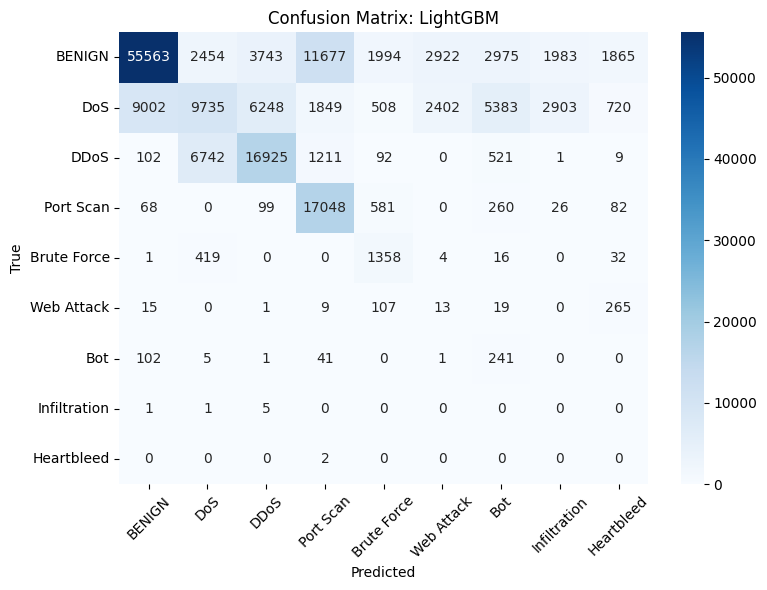


CatBoost Classification Report:
              precision    recall  f1-score   support

      BENIGN       1.00      0.99      1.00     85176
         DoS       1.00      1.00      1.00     38750
        DDoS       1.00      1.00      1.00     25603
   Port Scan       1.00      1.00      1.00     18164
 Brute Force       1.00      1.00      1.00      1830
  Web Attack       0.46      0.98      0.62       429
         Bot       0.75      0.99      0.85       391
Infiltration       0.62      0.71      0.67         7
  Heartbleed       0.67      1.00      0.80         2

    accuracy                           0.99    170352
   macro avg       0.83      0.96      0.88    170352
weighted avg       1.00      0.99      1.00    170352



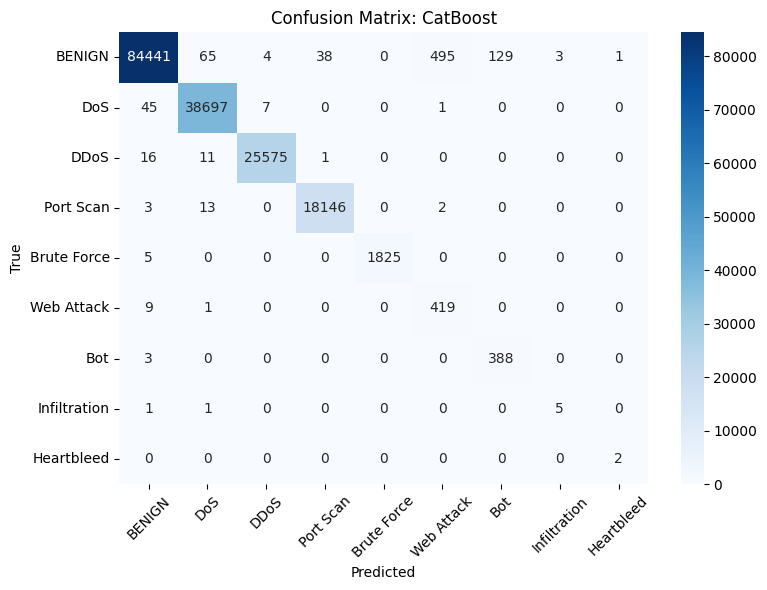

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [15:39:19] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



XGBoost Classification Report:
              precision    recall  f1-score   support

      BENIGN       1.00      0.99      1.00     85176
         DoS       1.00      1.00      1.00     38750
        DDoS       1.00      1.00      1.00     25603
   Port Scan       1.00      1.00      1.00     18164
 Brute Force       1.00      1.00      1.00      1830
  Web Attack       0.47      0.98      0.63       429
         Bot       0.87      0.98      0.92       391
Infiltration       0.86      0.86      0.86         7
  Heartbleed       1.00      0.50      0.67         2

    accuracy                           1.00    170352
   macro avg       0.91      0.92      0.90    170352
weighted avg       1.00      1.00      1.00    170352



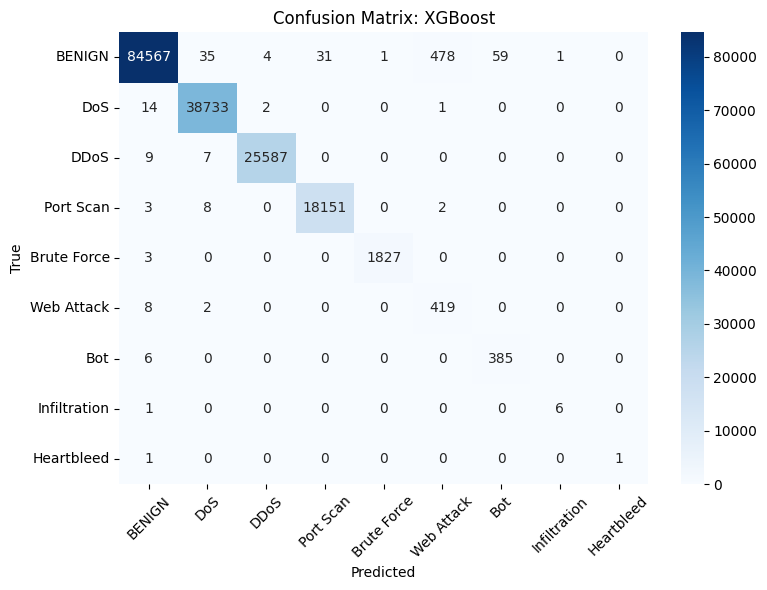


Stage1 (Binary) Classification Report:
              precision    recall  f1-score   support

      Normal       1.00      0.99      1.00     85176
      Attack       0.99      1.00      1.00     85176

    accuracy                           1.00    170352
   macro avg       1.00      1.00      1.00    170352
weighted avg       1.00      1.00      1.00    170352



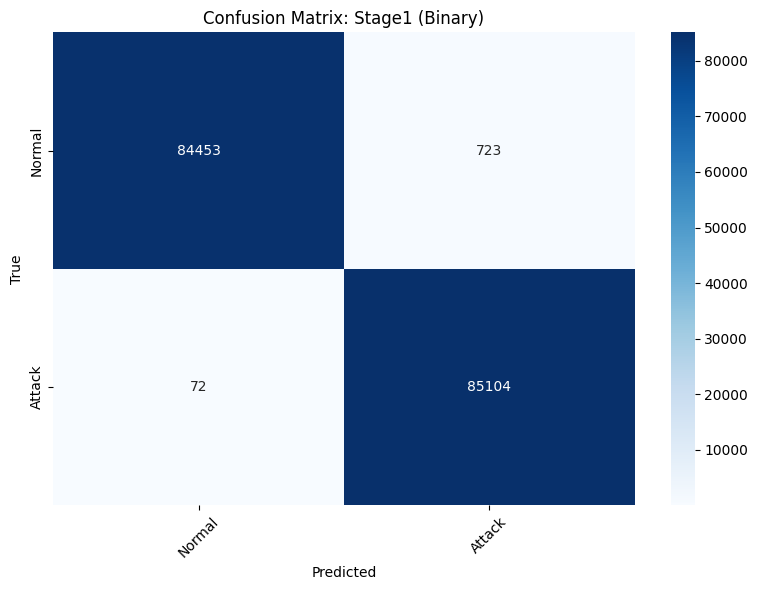

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [15:45:52] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Final Two-Stage Classification Report:
              precision    recall  f1-score   support

      BENIGN       1.00      0.99      1.00     85176
         DoS       1.00      1.00      1.00     38750
        DDoS       1.00      1.00      1.00     25603
   Port Scan       1.00      1.00      1.00     18164
 Brute Force       1.00      1.00      1.00      1830
  Web Attack       0.45      0.98      0.62       429
         Bot       0.77      0.99      0.87       391
Infiltration       0.75      0.86      0.80         7
  Heartbleed       1.00      1.00      1.00         2

    accuracy                           1.00    170352
   macro avg       0.89      0.98      0.92    170352
weighted avg       1.00      1.00      1.00    170352



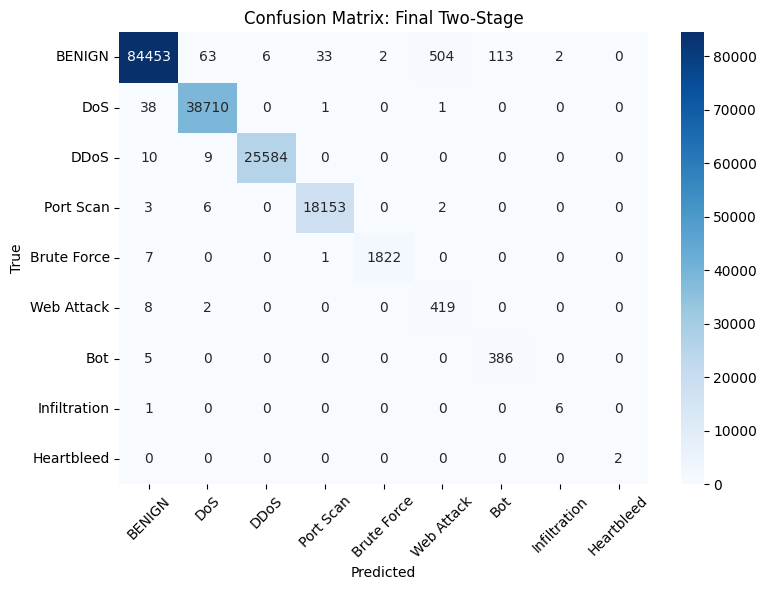

               Model  F1_macro  Train_time(s)  Pred_time(s)
0           LightGBM  0.319372     137.304861     20.367376
1           CatBoost  0.881501     203.003095      0.445667
2            XGBoost  0.896560     165.008821      6.087720
3  TwoStage-Ensemble  0.919460     291.869981      9.363736


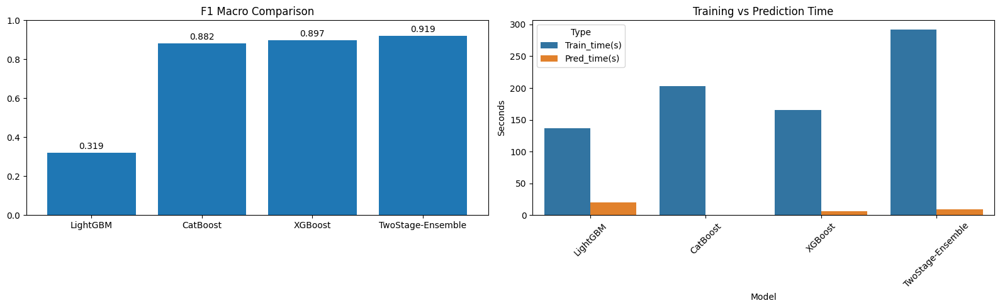

In [ ]:

# Install required libraries in Colab
!pip install --quiet lightgbm xgboost catboost

import pandas as pd
import numpy as np
import time
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from sklearn.ensemble import VotingClassifier
import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# 1. Mount Google Drive and load data
# -----------------------------------
drive.mount('/content/drive')
resampled_df = pd.read_csv(
    '/content/drive/MyDrive/CICIDS2017/best_resampled_data.csv'
)
test_df = pd.read_csv(
    '/content/drive/MyDrive/CICIDS2017/reduced_test_data.csv'
)

# Separate features and target
if 'target' in test_df.columns:
    y_test = test_df['target']
    X_test = test_df.drop('target', axis=1)
else:
    y_test = pd.read_csv(
        '/content/drive/MyDrive/CICIDS2017/test_labels.csv'
    )['target']
    X_test = test_df

X_train = resampled_df.drop('target', axis=1)
y_train = resampled_df['target']

# 2. Map string labels to integers in desired order
# --------------------------------------------------
class_order = [
    'BENIGN','DoS','DDoS','Port Scan','Brute Force',
    'Web Attack','Bot','Infiltration','Heartbleed'
]
class_to_idx = {cls: idx for idx, cls in enumerate(class_order)}
idx_to_class = {idx: cls for cls, idx in class_to_idx.items()}

# Map targets
y_train = y_train.map(class_to_idx)
y_test = y_test.map(class_to_idx)

# 3. Evaluation helper
# ---------------------
def evaluate(name, y_true, y_pred, labels):
    print(f"\n{name} Classification Report:")
    print(classification_report(y_true, y_pred, target_names=labels))
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8,6))
    sns.heatmap(
        cm, annot=True, fmt='d',
        xticklabels=labels,
        yticklabels=labels,
        cmap='Blues'
    )
    plt.title(f"Confusion Matrix: {name}")
    plt.ylabel('True')
    plt.xlabel('Predicted')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# 4. Baseline single models
# --------------------------
results = []
for Model, name in [
    (lgb.LGBMClassifier(n_estimators=150, random_state=42), 'LightGBM'),
    (CatBoostClassifier(iterations=150, verbose=0, random_state=42), 'CatBoost'),
    (xgb.XGBClassifier(n_estimators=150, use_label_encoder=False, eval_metric='mlogloss', random_state=42), 'XGBoost')
]:
    t0 = time.time()
    Model.fit(X_train, y_train)
    train_time = time.time() - t0

    t0 = time.time()
    preds = Model.predict(X_test)
    pred_time = time.time() - t0

    f1 = f1_score(y_test, preds, average='macro')
    results.append((name, f1, train_time, pred_time))
    evaluate(name, y_test, preds, class_order)

# 5. Two-Stage Ensemble
# ----------------------
# Identify benign index
nid = class_to_idx['BENIGN']

# Stage 1: Binary classification (benign vs attack)
y_train_bin = (y_train != nid).astype(int)
y_test_bin = (y_test != nid).astype(int)

stage1 = VotingClassifier([
    ('lgb', lgb.LGBMClassifier(n_estimators=150, random_state=42)),
    ('cat', CatBoostClassifier(iterations=150, verbose=0, random_state=42))
], voting='soft')

# Train Stage 1

t0 = time.time()
stage1.fit(X_train, y_train_bin)
train1 = time.time() - t0
# Predict Stage 1

t0 = time.time()
bin_preds = stage1.predict(X_test)
pred1 = time.time() - t0

evaluate('Stage1 (Binary)', y_test_bin, bin_preds, ['Normal', 'Attack'])

# Stage 2: Multiclass on attack-only samples
atk_idx_train = np.where(y_train != nid)[0]
X2 = X_train.iloc[atk_idx_train]
y2 = y_train[atk_idx_train]

atk_idx_test = np.where(bin_preds == 1)[0]

stage2 = VotingClassifier([
    ('lgb', lgb.LGBMClassifier(n_estimators=150, random_state=42)),
    ('cat', CatBoostClassifier(iterations=150, verbose=0, random_state=42)),
    ('xgb', xgb.XGBClassifier(n_estimators=150, use_label_encoder=False, eval_metric='mlogloss', random_state=42))
], voting='soft')

# Train Stage 2

t0 = time.time()
stage2.fit(X2, y2)
train2 = time.time() - t0
# Predict Stage 2

t0 = time.time()
sec_preds = stage2.predict(X_test.iloc[atk_idx_test])
pred2 = time.time() - t0

# Combine predictions
final_preds = np.full(y_test.shape, nid)
final_preds[atk_idx_test] = sec_preds

two_f1 = f1_score(y_test, final_preds, average='macro')
results.append(('TwoStage-Ensemble', two_f1, train1+train2, pred1+pred2))

evaluate('Final Two-Stage', y_test, final_preds, class_order)

# 6. Summary Comparison
# ----------------------
summary = pd.DataFrame(
    results, columns=['Model', 'F1_macro', 'Train_time(s)', 'Pred_time(s)']
)
print(summary)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
# F1 Comparison
ax1.bar(summary['Model'], summary['F1_macro'])
ax1.set_title('F1 Macro Comparison')
ax1.set_ylim(0, 1)
for i, v in enumerate(summary['F1_macro']):
    ax1.text(i, v + 0.02, f"{v:.3f}", ha='center')

# Time Comparison
ntime = summary.melt(
    id_vars='Model', value_vars=['Train_time(s)', 'Pred_time(s)'],
    var_name='Type', value_name='Seconds'
)
sns.barplot(x='Model', y='Seconds', hue='Type', data=ntime, ax=ax2)
ax2.set_title('Training vs Prediction Time')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 6.Incremetal Learning

In [ ]:
pip install -U numpy

  Using cached numpy-2.2.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.4 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.5 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.5 which is incompatible.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import SGDClassifier
import lightgbm as lgb
import time
import river
from river import ensemble, linear_model, preprocessing, metrics, multiclass

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import SGDClassifier
import lightgbm as lgb
import time
import river
from river import ensemble, linear_model, preprocessing, metrics, multiclass
from google.colab import drive
drive.mount('/content/drive')


# Load the data
print("Loading data...")

resampled_df = pd.read_csv('/content/drive/MyDrive/CICIDS2017/best_resampled_data.csv')
X_test = pd.read_csv('/content/drive/MyDrive/CICIDS2017/reduced_test_data.csv')

# Ensure target is the last column in test data or is separate
if 'target' in X_test.columns:
    y_test = X_test['target']
    X_test = X_test.drop('target', axis=1)
else:
    # Assuming the test target is saved separately
    y_test = pd.read_csv('/content/drive/MyDrive/CICIDS2017/test_labels.csv')['target']

# Extract features and target from resampled data
X_train = resampled_df.drop('target', axis=1)
y_train = resampled_df['target']

# Encode targets if they're categorical strings
le = LabelEncoder()
if y_train.dtype == 'object':
    y_train = le.fit_transform(y_train)
    y_test = le.transform(y_test)

# Get class mappings if needed for interpretation
class_mapping = {i: label for i, label in enumerate(le.classes_)}
print("Class mapping:", class_mapping)
n_classes = len(class_mapping)

# Function to evaluate and display results
def evaluate_model(y_true, y_pred, model_name):
    print(f"\n----- {model_name} Results -----")
    print(classification_report(y_true, y_pred))

    f1_macro = f1_score(y_true, y_pred, average='macro')
    print(f"F1-Macro Score: {f1_macro:.4f}")

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_mapping.values(),
                yticklabels=class_mapping.values())
    plt.title(f'Confusion Matrix - {model_name}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(f'{model_name}_confusion_matrix.png')
    plt.close()

    return f1_macro, cm

# Simulate streaming data by creating batches
def create_batches(X, y, batch_size):
    n_samples = len(X)
    indices = np.random.permutation(n_samples)
    X_shuffled = X.iloc[indices].reset_index(drop=True)
    y_shuffled = y[indices] if isinstance(y, np.ndarray) else y.iloc[indices].reset_index(drop=True)

    for i in range(0, n_samples, batch_size):
        end = min(i + batch_size, n_samples)
        yield X_shuffled.iloc[i:end], y_shuffled[i:end]

# Function to plot incremental learning progress
def plot_incremental_progress(batch_metrics, model_name):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    for metric_name, values in batch_metrics['metrics'].items():
        plt.plot(batch_metrics['batch_sizes'], values, marker='o', label=metric_name)
    plt.xlabel('Cumulative Training Samples')
    plt.ylabel('Score')
    plt.title(f'{model_name} Learning Progress')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(1, 2, 2)
    plt.plot(batch_metrics['batch_sizes'], batch_metrics['times'], marker='s', color='purple')
    plt.xlabel('Cumulative Training Samples')
    plt.ylabel('Cumulative Training Time (s)')
    plt.title(f'{model_name} Training Time')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig(f'{model_name}_learning_progress.png')
    plt.close()

print("\n========== Incremental Learning Implementation ==========")

# Define batch size for incremental learning
batch_size = 1000
n_batches = len(X_train) // batch_size
if len(X_train) % batch_size > 0:
    n_batches += 1
print(f"Training with {n_batches} batches of size {batch_size}")

# Initialize results storage for comparison
results = {
    'Model': [],
    'F1-Macro': [],
    'Training Time': []
}

# Standardize feature scaling for SGD
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

# 1. Custom LightGBM with Warm-Start
print("\n===== Custom LightGBM with Warm-Start =====")
lgb_params = {
    'objective': 'multiclass',
    'num_class': n_classes,
    'learning_rate': 0.1,
    'max_depth': 6,
    'num_leaves': 31,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'min_data_in_leaf': 50,
    'verbose': -1
}

lgb_batch_metrics = {
    'batch_sizes': [],
    'metrics': {'f1_macro': []},
    'times': []
}

# Initialize model with small batch
init_batches = create_batches(X_train, y_train, batch_size)
X_init, y_init = next(init_batches)
init_dataset = lgb.Dataset(X_init, y_init)
lgb_model = None
cumulative_time = 0

# Incremental learning loop
cumulative_size = 0
for batch_idx, (X_batch, y_batch) in enumerate(create_batches(X_train, y_train, batch_size)):
    batch_start_time = time.time()
    cumulative_size += len(X_batch)

    # First batch: initialize the model
    if batch_idx == 0:
        lgb_model = lgb.train(
            lgb_params,
            init_dataset,
            num_boost_round=10
        )
    # Subsequent batches: continue training with warm-start
    else:
        batch_dataset = lgb.Dataset(X_batch, y_batch)
        # Continue training from current model state
        lgb_model = lgb.train(
            lgb_params,
            batch_dataset,
            num_boost_round=10,
            init_model=lgb_model
        )

    batch_time = time.time() - batch_start_time
    cumulative_time += batch_time

    # Evaluate after each batch
    if (batch_idx + 1) % 5 == 0 or batch_idx == n_batches - 1:
        y_pred = lgb_model.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        f1 = f1_score(y_test, y_pred, average='macro')

        lgb_batch_metrics['batch_sizes'].append(cumulative_size)
        lgb_batch_metrics['metrics']['f1_macro'].append(f1)
        lgb_batch_metrics['times'].append(cumulative_time)

        print(f"Batch {batch_idx+1}/{n_batches}, Samples: {cumulative_size}, F1-Macro: {f1:.4f}")

# Final evaluation
y_pred_lgb = lgb_model.predict(X_test)
y_pred_lgb = np.argmax(y_pred_lgb, axis=1)
lgb_f1, lgb_cm = evaluate_model(y_test, y_pred_lgb, "LightGBM Incremental")

# Plot learning progress
plot_incremental_progress(lgb_batch_metrics, "LightGBM Incremental")

# Store results
results['Model'].append('LightGBM Incremental')
results['F1-Macro'].append(lgb_f1)
results['Training Time'].append(cumulative_time)



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loading data...
Class mapping: {0: 'BENIGN', 1: 'Bot', 2: 'Brute Force', 3: 'DDoS', 4: 'DoS', 5: 'Heartbleed', 6: 'Infiltration', 7: 'Port Scan', 8: 'Web Attack'}

========== Incremental Learning Implementation ==========
Training with 777 batches of size 1000

===== Custom LightGBM with Warm-Start =====
Batch 5/777, Samples: 5000, F1-Macro: 0.7208
Batch 10/777, Samples: 10000, F1-Macro: 0.1959
Batch 15/777, Samples: 15000, F1-Macro: 0.1985
Batch 20/777, Samples: 20000, F1-Macro: 0.1985
Batch 25/777, Samples: 25000, F1-Macro: 0.1985
Batch 30/777, Samples: 30000, F1-Macro: 0.1715
Batch 35/777, Samples: 35000, F1-Macro: 0.1585
Batch 40/777, Samples: 40000, F1-Macro: 0.1572
Batch 45/777, Samples: 45000, F1-Macro: 0.1572
Batch 50/777, Samples: 50000, F1-Macro: 0.1572
Batch 55/777, Samples: 55000, F1-Macro: 0.1572
Batch 60/777, Samples: 60000, F1-Macro: 0.1573
Bat

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
results

{'Model': ['LightGBM Incremental'],
 'F1-Macro': [0.15682359789120282],
 'Training Time': [110.89785289764404]}

In [ ]:
from river import tree, metrics
import time
from sklearn.metrics import f1_score, confusion_matrix

print("\n===== River HoeffdingTreeClassifier (streaming) =====")

river_model = tree.HoeffdingTreeClassifier()
river_f1_metric = metrics.MacroF1()

river_batch_metrics = {
    'batch_sizes': [],
    'metrics': {'f1_macro': []},
    'times': []
}

cumulative_size = 0
cumulative_time = 0.0

# Streaming training loop
for batch_idx, (X_batch, y_batch) in enumerate(create_batches(X_train_scaled, y_train, batch_size)):
    batch_start_time = time.time()

    for xi, yi in zip(X_batch.to_dict('records'), y_batch):
        y_pred = river_model.predict_one(xi)
        if y_pred is not None:
            river_f1_metric.update(yi, y_pred)  # <- no reassignment here
        river_model.learn_one(xi, yi)

    batch_time = time.time() - batch_start_time
    cumulative_time += batch_time
    cumulative_size += len(X_batch)

    if (batch_idx + 1) % 5 == 0 or batch_idx == n_batches - 1:
        current_f1 = river_f1_metric.get()
        river_batch_metrics['batch_sizes'].append(cumulative_size)
        river_batch_metrics['metrics']['f1_macro'].append(current_f1)
        river_batch_metrics['times'].append(cumulative_time)
        print(f"Batch {batch_idx+1}/{n_batches}, Samples: {cumulative_size}, River F1-Macro: {current_f1:.4f}")



===== River HoeffdingTreeClassifier (streaming) =====
Batch 5/777, Samples: 5000, River F1-Macro: 0.6097
Batch 10/777, Samples: 10000, River F1-Macro: 0.6346
Batch 15/777, Samples: 15000, River F1-Macro: 0.6141
Batch 20/777, Samples: 20000, River F1-Macro: 0.6094
Batch 25/777, Samples: 25000, River F1-Macro: 0.6153
Batch 30/777, Samples: 30000, River F1-Macro: 0.6270
Batch 35/777, Samples: 35000, River F1-Macro: 0.6389
Batch 40/777, Samples: 40000, River F1-Macro: 0.6513
Batch 45/777, Samples: 45000, River F1-Macro: 0.6616
Batch 50/777, Samples: 50000, River F1-Macro: 0.6689
Batch 55/777, Samples: 55000, River F1-Macro: 0.6748
Batch 60/777, Samples: 60000, River F1-Macro: 0.6795
Batch 65/777, Samples: 65000, River F1-Macro: 0.6839
Batch 70/777, Samples: 70000, River F1-Macro: 0.6916
Batch 75/777, Samples: 75000, River F1-Macro: 0.6972
Batch 80/777, Samples: 80000, River F1-Macro: 0.7028
Batch 85/777, Samples: 85000, River F1-Macro: 0.7083
Batch 90/777, Samples: 90000, River F1-Macro: 

In [ ]:
X_test_dicts = X_test_scaled.to_dict('records')
y_pred_river = [river_model.predict_one(xi) or y_test[i] for i, xi in enumerate(X_test_dicts)]
river_f1 = f1_score(y_test, y_pred_river, average='macro')
river_cm = confusion_matrix(y_test, y_pred_river)

print("\nFinal River F1-Macro:", river_f1)
print("River Confusion Matrix:\n", river_cm)

plot_incremental_progress(river_batch_metrics, "River HoeffdingTree")

results['Model'].append('River HoeffdingTree')
results['F1-Macro'].append(river_f1)
results['Training Time'].append(cumulative_time)



Final River F1-Macro: 0.6668902753299286
River Confusion Matrix:
 [[76346  1668     0   468  4462     1    94   318  1819]
 [    0   391     0     0     0     0     0     0     0]
 [    0     0  1772     0     2     0     0     4    52]
 [    0     0     0 25594     9     0     0     0     0]
 [    0     0     0   180 38142     0     2    71   355]
 [    0     1     0     0     0     1     0     0     0]
 [    0     0     0     0     3     0     4     0     0]
 [    0     0     0     8    22     0     3 18044    87]
 [    0     0     0     0     0     0     0     0   429]]


In [ ]:
# 3. SGD Classifier with partial_fit
print("\n===== SGD Classifier with partial_fit =====")
sgd_model = SGDClassifier(
    loss='log_loss',  # Using log loss for probability estimates
    alpha=0.0001,
    max_iter=1000,
    tol=1e-3,
    random_state=42
)

sgd_batch_metrics = {
    'batch_sizes': [],
    'metrics': {'f1_macro': []},
    'times': []
}

# ----> Convert X_train_scaled and y_train for compatibility with .iloc <----
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
y_train = pd.Series(y_train)

# Initialize with all classes
sgd_model.partial_fit(X_train_scaled.iloc[:1], y_train[:1], classes=np.unique(y_train))

# Incremental learning loop
cumulative_size = 0
cumulative_time = 0

for batch_idx, (X_batch, y_batch) in enumerate(create_batches(X_train_scaled, y_train, batch_size)):
    batch_start_time = time.time()

    # Update model with current batch
    sgd_model.partial_fit(X_batch, y_batch)

    cumulative_size += len(X_batch)
    batch_time = time.time() - batch_start_time
    cumulative_time += batch_time

    # Evaluate after each batch
    if (batch_idx + 1) % 5 == 0 or batch_idx == n_batches - 1:
        y_pred = sgd_model.predict(X_test_scaled)
        f1 = f1_score(y_test, y_pred, average='macro')

        sgd_batch_metrics['batch_sizes'].append(cumulative_size)
        sgd_batch_metrics['metrics']['f1_macro'].append(f1)
        sgd_batch_metrics['times'].append(cumulative_time)

        print(f"Batch {batch_idx+1}/{n_batches}, Samples: {cumulative_size}, F1-Macro: {f1:.4f}")

# Final evaluation
y_pred_sgd = sgd_model.predict(X_test_scaled)
sgd_f1, sgd_cm = evaluate_model(y_test, y_pred_sgd, "SGD Classifier (incremental)")

# Plot learning progress
plot_incremental_progress(sgd_batch_metrics, "SGD Classifier")

# Store results
results['Model'].append('SGD Classifier')
results['F1-Macro'].append(sgd_f1)
results['Training Time'].append(cumulative_time)


===== SGD Classifier with partial_fit =====
Batch 5/777, Samples: 5000, F1-Macro: 0.3646
Batch 10/777, Samples: 10000, F1-Macro: 0.4362
Batch 15/777, Samples: 15000, F1-Macro: 0.5036
Batch 20/777, Samples: 20000, F1-Macro: 0.4834
Batch 25/777, Samples: 25000, F1-Macro: 0.4905
Batch 30/777, Samples: 30000, F1-Macro: 0.5060
Batch 35/777, Samples: 35000, F1-Macro: 0.3977
Batch 40/777, Samples: 40000, F1-Macro: 0.5067
Batch 45/777, Samples: 45000, F1-Macro: 0.4585
Batch 50/777, Samples: 50000, F1-Macro: 0.5278
Batch 55/777, Samples: 55000, F1-Macro: 0.4515
Batch 60/777, Samples: 60000, F1-Macro: 0.5291
Batch 65/777, Samples: 65000, F1-Macro: 0.5042
Batch 70/777, Samples: 70000, F1-Macro: 0.5243
Batch 75/777, Samples: 75000, F1-Macro: 0.4884
Batch 80/777, Samples: 80000, F1-Macro: 0.5512
Batch 85/777, Samples: 85000, F1-Macro: 0.5194
Batch 90/777, Samples: 90000, F1-Macro: 0.5258
Batch 95/777, Samples: 95000, F1-Macro: 0.5560
Batch 100/777, Samples: 100000, F1-Macro: 0.5218
Batch 105/777, 

In [ ]:
results

{'Model': ['LightGBM Incremental', 'River HoeffdingTree', 'SGD Classifier'],
 'F1-Macro': [0.15682359789120282, 0.6668902753299286, 0.5819128850718447],
 'Training Time': [110.89785289764404, 302.56665539741516, 9.003679752349854]}


===== Incremental Learning Models Comparison =====
                  Model  F1-Macro  Training Time
0  LightGBM Incremental  0.156824     110.897853
1   River HoeffdingTree  0.666890     302.566655
2        SGD Classifier  0.581913       9.003680


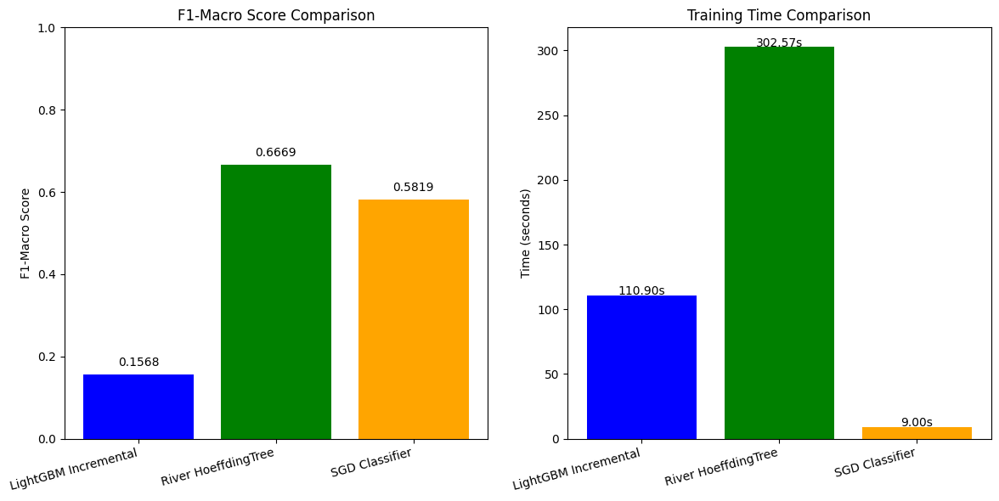

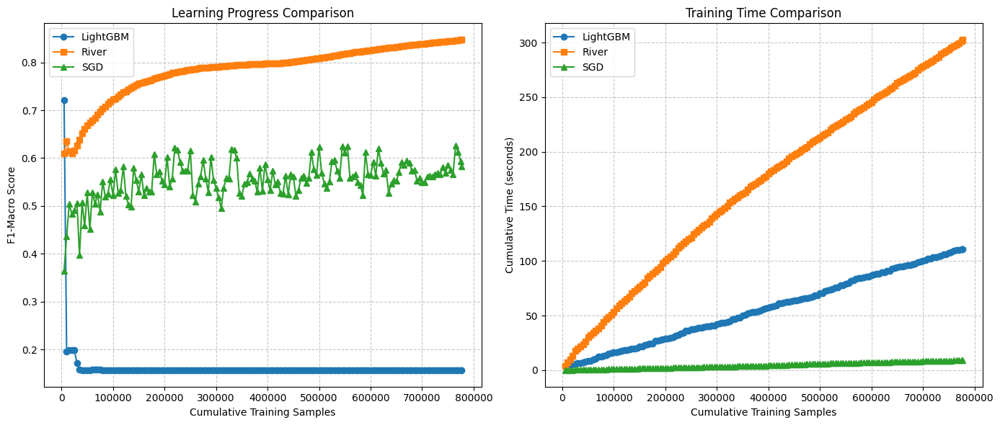

In [ ]:

# Compare all incremental learning models
print("\n===== Incremental Learning Models Comparison =====")
results_df = pd.DataFrame(results)
print(results_df)

# Plot comparison of F1 scores
plt.figure(figsize=(12, 6))

# F1 Scores comparison
plt.subplot(1, 2, 1)
plt.bar(results['Model'], results['F1-Macro'], color=['blue', 'green', 'orange'])
plt.title('F1-Macro Score Comparison')
plt.ylabel('F1-Macro Score')
plt.ylim(0, 1)
plt.xticks(rotation=15, ha='right')
for i, v in enumerate(results['F1-Macro']):
    plt.text(i, v + 0.02, f"{v:.4f}", ha='center')

# Training time comparison
plt.subplot(1, 2, 2)
plt.bar(results['Model'], results['Training Time'], color=['blue', 'green', 'orange'])
plt.title('Training Time Comparison')
plt.ylabel('Time (seconds)')
plt.xticks(rotation=15, ha='right')
for i, v in enumerate(results['Training Time']):
    plt.text(i, v + 0.5, f"{v:.2f}s", ha='center')

plt.tight_layout()
plt.savefig('incremental_learning_comparison.png')
plt.show()

# Plot combined learning progress
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(lgb_batch_metrics['batch_sizes'], lgb_batch_metrics['metrics']['f1_macro'],
         marker='o', label='LightGBM')
plt.plot(river_batch_metrics['batch_sizes'], river_batch_metrics['metrics']['f1_macro'],
         marker='s', label='River')
plt.plot(sgd_batch_metrics['batch_sizes'], sgd_batch_metrics['metrics']['f1_macro'],
         marker='^', label='SGD')
plt.xlabel('Cumulative Training Samples')
plt.ylabel('F1-Macro Score')
plt.title('Learning Progress Comparison')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
plt.plot(lgb_batch_metrics['batch_sizes'], lgb_batch_metrics['times'],
         marker='o', label='LightGBM')
plt.plot(river_batch_metrics['batch_sizes'], river_batch_metrics['times'],
         marker='s', label='River')
plt.plot(sgd_batch_metrics['batch_sizes'], sgd_batch_metrics['times'],
         marker='^', label='SGD')
plt.xlabel('Cumulative Training Samples')
plt.ylabel('Cumulative Time (seconds)')
plt.title('Training Time Comparison')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('combined_learning_progress.png')
plt.show()



In [ ]:
# Summary
print("\n===== Implementation Summary =====")
print("1. LightGBM with Warm-Start:")
print("   - Implements incremental learning through model initialization")
print("   - Training with 'init_model' parameter for continuous updates")
print("   - Batch-wise learning curve visualization")

print("\n2. River Online Learning:")
print("   - True streaming model with learn_one/predict_one interface")
print("   - One-vs-Rest strategy with Adaptive Random Forest")
print("   - Instance-by-instance learning without requiring full batches")

print("\n3. SGD Classifier with partial_fit:")
print("   - Native scikit-learn incremental learning API")
print("   - Efficient for large datasets through stochastic updates")
print("   - Requires feature scaling for optimal performance")

print("\nKey Findings:")
best_model = results_df.loc[results_df['F1-Macro'].idxmax(), 'Model']
best_f1 = results_df['F1-Macro'].max()
fastest_model = results_df.loc[results_df['Training Time'].idxmin(), 'Model']
fastest_time = results_df['Training Time'].min()

print(f"Best performance: {best_model} with F1-Macro of {best_f1:.4f}")
print(f"Fastest training: {fastest_model} in {fastest_time:.2f} seconds")


===== Implementation Summary =====
1. LightGBM with Warm-Start:
   - Implements incremental learning through model initialization
   - Training with 'init_model' parameter for continuous updates
   - Batch-wise learning curve visualization

2. River Online Learning:
   - True streaming model with learn_one/predict_one interface
   - One-vs-Rest strategy with Adaptive Random Forest
   - Instance-by-instance learning without requiring full batches

3. SGD Classifier with partial_fit:
   - Native scikit-learn incremental learning API
   - Efficient for large datasets through stochastic updates
   - Requires feature scaling for optimal performance

Key Findings:
Best performance: River HoeffdingTree with F1-Macro of 0.6669
Fastest training: SGD Classifier in 9.00 seconds
